In [1]:
from nilearn import image
from nilearn.maskers import NiftiMasker
from scipy import stats
from scipy.io import loadmat
from scipy.stats import pearsonr
from scipy.stats import spearmanr
import numpy as np
import nibabel as nib
import pandas as pd
import os,glob
import seaborn as sns
import matplotlib.pyplot as plt

# Make Matrix

In [27]:
def load_matrix():
    data = loadmat('/Volumes/Empty/Sweetspot_Seg/subject_matrix.mat')
    first_matrix = data['first_matrix']
    masker = NiftiMasker(mask_img='/Volumes/Empty/Sweetspot_Seg/Outputs/binary/zones1-2/binary_zones1-2_n-map.nii.gz', standardize=True)
    mask_nii = masker.fit()
    return mask_nii, first_matrix

#index matrix and df by cohort
def matrix_df_selection(first_matrix,df_array):
    ranges = [(0, 3), (4, 5), (6, 18), (19, 21), (22, 25), (26, 27), (28, 29), (30, 32), (32, 33), (34, 37), (38, 39), (40, 47)]
    second_matrix,df_selection = first_matrix.copy(),df_array.copy()
    
    #make cohort matricies
    cingulotomy_rows = np.concatenate([np.arange(start, end) for start, end in ranges])
    cingulotomy_matrix = second_matrix[cingulotomy_rows]
    cap_sct_matrix = np.delete(second_matrix,cingulotomy_rows,axis=0)
    
    #make clinical outcomes cohorts
    cingulotomy_df = df_selection[cingulotomy_rows]
    cap_sct_df = np.delete(df_selection,cingulotomy_rows, axis=0)
    
    return cingulotomy_matrix, cap_sct_matrix, cingulotomy_df, cap_sct_df

df = pd.read_csv('/Volumes/Empty/Sweetspot_Seg/All_YBOCS_Flip.csv')
df_array = df['Relative'].to_numpy().reshape(-1, 1) #change for absolute vs relative

mask_nii, first_matrix = load_matrix()
cingulotomy_matrix, cap_sct_matrix, cingulotomy_df, cap_sct_df = matrix_df_selection(first_matrix,df_array)

In [28]:
def create_subcohorts(ranges): #create selection from main matrix
    second_cap_sct_matrix,cap_sct_df_selection = cap_sct_matrix.copy(),cap_sct_df.copy()
    rows = np.concatenate([np.arange(start, end) for start, end in ranges])
    matrix = second_cap_sct_matrix[rows]
    df = cap_sct_df_selection[rows]
    return matrix, df
    
def delete_subcohorts(ranges): #create inverse selection
    second_cap_sct_matrix,cap_sct_df_selection = cap_sct_matrix.copy(),cap_sct_df.copy()
    rows = np.concatenate([np.arange(start, end) for start, end in ranges])
    matrix = np.delete(second_cap_sct_matrix,rows,axis=0)
    df = np.delete(cap_sct_df_selection,rows, axis=0)
    return matrix, df
    
#set ranges of each cohort in matrix and csv
brazil_ranges = [(16,21),(22,25),(27,32)]
canada_ranges = [(10,16),(21,22),(25,27),(32,34)]
sct_range = [(0,10)]
    
brazil_matrix, brazil_df = create_subcohorts(brazil_ranges)
canada_matrix, canada_df = create_subcohorts(canada_ranges)
sct_matrix, sct_df = create_subcohorts(sct_range)
brazil_canada_matrix,brazil_canada_df = delete_subcohorts(sct_range)
brazil_sct_matrix,brazil_sct_df = delete_subcohorts(canada_ranges)
canada_sct_matrix,canada_sct_df = delete_subcohorts(brazil_ranges)

# Prediction of Subcohorts

In [29]:
def sweetspot(matrix):
    def correlations(A, B,path,export=False): #pearson and spearman correlation
        n = A.shape[1]
        dist = stats.beta(n/2 - 1, n/2 - 1, loc=-1, scale=2)
        v_pear_r, v_pear_p, v_spear_r, v_spear_p = None, None, None, None
        
        A[np.isnan(A)],B[np.isnan(B)] = 0,0 #make nans 0
        
        if corr_type == 'pearson' or corr_type == 'both':
            A_mA = A - A.mean(1)[:, None]
            B_mB = B - B.mean(1)[:, None]
            ssA = (A_mA**2).sum(1)
            ssB = (B_mB**2).sum(1)
            v_pear_r = (np.dot(A_mA, B_mB.T) / np.sqrt(np.dot(ssA[:, None],ssB[None]))).ravel()
            v_pear_p = 2*dist.cdf(-abs(v_pear_r))
            v_pear_p = np.around(v_pear_p, 200)
            v_pear_r[np.isnan(v_pear_r)],v_pear_p[np.isnan(v_pear_p)] = 0,0 #replace nans with 0s
            
            pos_v_pear_r = v_pear_r.copy()
            pos_v_pear_r[pos_v_pear_r < 0] = 0
            
        if corr_type == 'spearman' or corr_type == 'both':
            rank_A = np.apply_along_axis(lambda x: stats.rankdata(x, method='average'), 1, A) #ranking
            rank_B = np.apply_along_axis(lambda x: stats.rankdata(x, method='average'), 1, B)
            A_mA = rank_A - rank_A.mean(1)[:, None]
            B_mB = rank_B - rank_B.mean(1)[:, None]
            ssA = (A_mA**2).sum(1)
            ssB = (B_mB**2).sum(1)
            v_spear_r = (np.dot(A_mA, B_mB.T) / np.sqrt(np.dot(ssA[:, None], ssB[None]))).ravel()
            v_spear_p = 2 * dist.cdf(-np.abs(v_spear_r))
            v_spear_p = np.around(v_spear_p, 200)
            v_spear_r[np.isnan(v_spear_r)],v_spear_p[np.isnan(v_spear_p)] = 0,0 #replace nans with 0s
            
            pos_v_spear_r = v_spear_r.copy()
            pos_v_spear_r[pos_v_spear_r < 0] = 0
        
        if export:
            if corr_type == 'pearson' or corr_type == 'both':
                nib.save(mask_nii.inverse_transform(v_pear_r.reshape(1, -1)), f'{path}/pearson_r-map.nii.gz'),nib.save(mask_nii.inverse_transform(v_pear_p.reshape(1, -1)), f'{path}/pearson_p-map_from_r.nii.gz'),nib.save(mask_nii.inverse_transform(pos_v_pear_r.reshape(1, -1)), f'{path}/positive_pearson_r-map.nii.gz')
            if corr_type == 'spearman' or corr_type == 'both':
                nib.save(mask_nii.inverse_transform(v_spear_r.reshape(1, -1)), f'{path}/spearman_r-map.nii.gz'),nib.save(mask_nii.inverse_transform(v_spear_p.reshape(1, -1)), f'{path}/spearman_p-map_from_r.nii.gz'),nib.save(mask_nii.inverse_transform(pos_v_spear_r.reshape(1, -1)), f'{path}/positive_spearman_r-map.nii.gz')
        return v_pear_r,v_pear_p,pos_v_pear_r,v_spear_r,v_spear_p,pos_v_spear_r

    #make r and p maps only where significant p < 0.05
    def significant(path, corr_type, v_pear_r, v_pear_p, v_spear_r, v_spear_p, export=False):
        sig_pearson_r_map, sig_pearson_p_map, sig_spearman_r_map, sig_spearman_p_map = None, None, None, None
        if corr_type == 'pearson' or corr_type == 'both':
            sig_pearson_mask = (v_pear_p > 0) & (v_pear_p <= 0.05)
            sig_pearson_r_map = v_pear_r * sig_pearson_mask
            sig_pearson_p_map = v_pear_p * sig_pearson_mask
            
            pos_sig_pearson_r = sig_pearson_r_map.copy()
            pos_sig_pearson_r[pos_sig_pearson_r < 0] = 0
            
            if export:
                nib.save(mask_nii.inverse_transform(sig_pearson_r_map.reshape(1, -1)), f'{path}/pearson_sig_r-map.nii.gz'),nib.save(mask_nii.inverse_transform(sig_pearson_p_map.reshape(1, -1)), f'{path}/pearson_sig_p-map.nii.gz'),nib.save(mask_nii.inverse_transform(pos_sig_pearson_r.reshape(1, -1)), f'{path}/positive_pearson_sig_r-map.nii.gz')
      
        if corr_type == 'spearman' or corr_type == 'both':
            sig_spearman_mask = (v_spear_p > 0) & (v_spear_p <= 0.05)
            sig_spearman_r_map = v_spear_r * sig_spearman_mask
            sig_spearman_p_map = v_spear_p * sig_spearman_mask
            
            pos_sig_spearman_r = sig_spearman_r_map.copy()
            pos_sig_spearman_r[pos_sig_spearman_r < 0] = 0
            
            if export:
                nib.save(mask_nii.inverse_transform(sig_spearman_r_map.reshape(1, -1)), f'{path}/spearman_sig_r-map.nii.gz'),nib.save(mask_nii.inverse_transform(sig_spearman_p_map.reshape(1, -1)), f'{path}/spearman_sig_p-map.nii.gz'),nib.save(mask_nii.inverse_transform(pos_sig_spearman_r.reshape(1, -1)), f'{path}/positive_spearman_sig_r-map.nii.gz')
        
        return sig_pearson_r_map, sig_pearson_p_map,pos_sig_pearson_r, sig_spearman_r_map, sig_spearman_p_map,pos_sig_spearman_r

    #n-map
    def n_map(matrix, path, export=False):
        n_matrix = matrix.copy()
        n_matrix[n_matrix != 0] = 1
        sum_vector = np.sum(n_matrix, axis=0)
        sum_vector_reshape = sum_vector.reshape(1, -1)
        if export:
            nib.save(mask_nii.inverse_transform(sum_vector_reshape[0]), f'{path}/n-map.nii.gz')
        return sum_vector

    #threshold n-map by desired amount
    def threshold_n(sum_vector,path, threshold, export=False,v_pear_r=None):
        thresholded_vector = sum_vector.copy()
        thresholded_vector[thresholded_vector <= threshold] = 0
        thresholded_vector_reshape = thresholded_vector.reshape(1, -1)  
        if export:
            nib.save(mask_nii.inverse_transform(thresholded_vector_reshape[0]), f'{path}/n-map_thresholded_by_{threshold}.nii.gz')
        return thresholded_vector

    #threshold r-maps to designated threshold of n-map
    def threshold_r_p(thresholded_vector, path, threshold, v_pear_r, v_pear_p, sig_pearson_r_map, sig_pearson_p_map, v_spear_r, v_spear_p, sig_spearman_r_map, sig_spearman_p_map, corr_type, export):
        binary_threshold_n_vector = thresholded_vector.copy()
        binary_threshold_n_vector[binary_threshold_n_vector > 0] = 1
        if corr_type == 'pearson' or corr_type == 'both':
            thresholded_pearson_sig_r_map = sig_pearson_r_map * binary_threshold_n_vector
            thresholded_pearson_sig_p_map = sig_pearson_p_map * binary_threshold_n_vector
            thresholded_pearson_r_map = v_pear_r * binary_threshold_n_vector
            thresholded_pearson_p_map = v_pear_p * binary_threshold_n_vector
            
            positive_thresholded_pearson_r_map,positive_thresholded_pearson_sig_r_map = thresholded_pearson_r_map.copy(),thresholded_pearson_sig_r_map.copy()
            positive_thresholded_pearson_r_map[positive_thresholded_pearson_r_map < 0] = 0 #make all neg values = 0
            positive_thresholded_pearson_sig_r_map[positive_thresholded_pearson_sig_r_map < 0] = 0 #make all neg values = 0
            
            if export:
                nib.save(mask_nii.inverse_transform(thresholded_pearson_sig_r_map.reshape(1, -1)), f'{path}/sig_pearson_r-map_thresholded_by_{threshold}.nii.gz'), nib.save(mask_nii.inverse_transform(thresholded_pearson_sig_p_map.reshape(1, -1)), f'{path}/sig_pearson_p-map_thresholded_by_{threshold}.nii.gz'), nib.save(mask_nii.inverse_transform(thresholded_pearson_r_map.reshape(1, -1)), f'{path}/pearson_r-map_thresholded_by_{threshold}.nii.gz'), nib.save(mask_nii.inverse_transform(thresholded_pearson_p_map.reshape(1, -1)), f'{path}/pearson_p-map_thresholded_by_{threshold}.nii.gz'),nib.save(mask_nii.inverse_transform(positive_thresholded_pearson_sig_r_map.reshape(1, -1)), f'{path}/positive_sig_pearson_r-map_thresholded_by_{threshold}.nii.gz'),nib.save(mask_nii.inverse_transform(positive_thresholded_pearson_sig_r_map.reshape(1, -1)), f'{path}/positive_sig_pearson_r-map_thresholded_by_{threshold}.nii.gz')
        if corr_type == 'spearman' or corr_type == 'both':
            thresholded_spearman_sig_r_map = sig_spearman_r_map * binary_threshold_n_vector
            thresholded_spearman_sig_p_map = sig_spearman_p_map * binary_threshold_n_vector
            thresholded_spearman_r_map = v_spear_r * binary_threshold_n_vector
            thresholded_spearman_p_map = v_spear_p * binary_threshold_n_vector
            
            positive_thresholded_spearman_r_map,positive_thresholded_spearman_sig_r_map = thresholded_spearman_r_map.copy(),thresholded_spearman_sig_r_map.copy()
            positive_thresholded_spearman_r_map[positive_thresholded_spearman_r_map < 0] = 0 #make all neg values = 0
            positive_thresholded_spearman_sig_r_map[positive_thresholded_spearman_sig_r_map < 0] = 0 #make all neg values = 0
            
            if export:
                nib.save(mask_nii.inverse_transform(thresholded_spearman_sig_r_map.reshape(1, -1)), f'{path}/sig_spearman_r-map_thresholded_by_{threshold}.nii.gz'), nib.save(mask_nii.inverse_transform(thresholded_spearman_sig_p_map.reshape(1, -1)), f'{path}/sig_spearman_p-map_thresholded_by_{threshold}.nii.gz'), nib.save(mask_nii.inverse_transform(thresholded_spearman_r_map.reshape(1, -1)), f'{path}/spearman_r-map_thresholded_by_{threshold}.nii.gz'), nib.save(mask_nii.inverse_transform(thresholded_spearman_p_map.reshape(1, -1)), f'{path}/spearman_p-map_thresholded_by_{threshold}.nii.gz'),nib.save(mask_nii.inverse_transform(positive_thresholded_spearman_sig_r_map.reshape(1, -1)), f'{path}/positive_spearman_r-map_thresholded_by_{threshold}.nii.gz'),nib.save(mask_nii.inverse_transform(positive_thresholded_spearman_sig_r_map.reshape(1, -1)), f'{path}/positive_sig_spearman_r-map_thresholded_by_{threshold}.nii.gz')
        return thresholded_pearson_r_map, thresholded_pearson_sig_r_map, thresholded_pearson_p_map, thresholded_pearson_sig_p_map, thresholded_spearman_r_map, thresholded_spearman_sig_r_map, thresholded_spearman_p_map, thresholded_spearman_sig_p_map,positive_thresholded_pearson_r_map,positive_thresholded_pearson_sig_r_map,positive_thresholded_spearman_r_map,positive_thresholded_spearman_sig_r_map

    path = '/Volumes/Empty/Sweetspot_Seg/Outputs/matrix_tests' #path to export to
    export = False
    corr_type = 'both' #change for correlation type: pearson, spearman, or both
    threshold = 5 #n-threshold, greater than or equal to

    matrix = brazil_matrix #matrix that data trains on
    df = brazil_df #matching df
    
    vector_pearson_correlation_coefficients, vector_pearson_p_values, positive_pearson_r_values, vector_spearman_correlation_coefficients, vector_spearman_p_values,positive_spearman_r_values = correlations(matrix.T, df.T, path, export)
    significant_pearson_correlation_coefficients, significant_pearson_p_values, positive_significant_pearson_correlation_coefficients, significant_spearman_correlation_coefficients, significant_spearman_p_values,positive_significant_spearman_correlation_coefficients = significant(path, corr_type, vector_pearson_correlation_coefficients, vector_pearson_p_values, vector_spearman_correlation_coefficients, vector_spearman_p_values, export)
    n_vector = n_map(matrix, path, export)
    threshold_n_result = threshold_n(n_vector, path, threshold, export, v_pear_r = vector_pearson_correlation_coefficients)
    thresholded_pearson_r_map, thresholded_pearson_sig_r_map, thresholded_pearson_p_map, thresholded_pearson_sig_p_map,positive_thresholded_pearson_r_map,positive_thresholded_pearson_sig_r_map, thresholded_spearman_r_map, thresholded_spearman_sig_r_map, thresholded_spearman_p_map, thresholded_spearman_sig_p_map,positive_thresholded_spearman_r_map,positive_thresholded_spearman_sig_r_map = threshold_r_p(threshold_n_result, path, threshold, vector_pearson_correlation_coefficients, vector_pearson_p_values, significant_pearson_correlation_coefficients, significant_pearson_p_values, vector_spearman_correlation_coefficients, vector_spearman_p_values, significant_spearman_correlation_coefficients, significant_spearman_p_values, corr_type, export)
    
    return vector_pearson_correlation_coefficients,positive_pearson_r_values,significant_pearson_correlation_coefficients,positive_significant_pearson_correlation_coefficients,vector_spearman_correlation_coefficients,positive_spearman_r_values, significant_spearman_correlation_coefficients, positive_significant_spearman_correlation_coefficients,thresholded_pearson_r_map,thresholded_pearson_sig_r_map, positive_thresholded_pearson_r_map,positive_thresholded_pearson_sig_r_map, thresholded_spearman_r_map, thresholded_spearman_sig_r_map,positive_thresholded_spearman_r_map,positive_thresholded_spearman_sig_r_map

#get overlap and r & p values
def sweetspot_score(corr_type,matrix,df_column,vector_pearson_correlation_coefficients,positive_pearson_r_values,significant_pearson_correlation_coefficients,positive_significant_pearson_correlation_coefficients,vector_spearman_correlation_coefficients,positive_spearman_r_values, significant_spearman_correlation_coefficients, positive_significant_spearman_correlation_coefficients,thresholded_pearson_r_map, positive_thresholded_pearson_r_map,thresholded_pearson_sig_r_map,positive_thresholded_pearson_sig_r_map, thresholded_spearman_r_map, thresholded_spearman_sig_r_map,positive_thresholded_spearman_r_map,positive_thresholded_spearman_sig_r_map):
    efield_matrix = matrix.copy()
    if corr_type == 'pearson' or corr_type == 'both':
        #make empty matricies to store outputs in
        pearson_sweetspot_score,pos_pearson_sweetspot_score,sig_pearson_sweetspot_score,pos_sig_pearson_sweetspot_score,thresholded_pearson_sweetspot_score,pos_thresholded_pearson_sweetspot_score,thresholded_sig_pearson_sweetspot_score,pos_thresholded_sig_pearson_sweetspot_score = np.zeros(efield_matrix.shape[0]),np.zeros(efield_matrix.shape[0]),np.zeros(efield_matrix.shape[0]),np.zeros(efield_matrix.shape[0]),np.zeros((efield_matrix.shape[0])),np.zeros((efield_matrix.shape[0])),np.zeros((efield_matrix.shape[0])),np.zeros((efield_matrix.shape[0]))
        pearson_sweetspot_corr,pos_pearson_sweetspot_corr,sig_pearson_sweetspot_corr,pos_sig_pearson_sweetspot_corr,thresholded_pearson_sweetspot_corr,pos_thresholded_pearson_sweetspot_corr,thresholded_sig_pearson_sweetspot_corr,pos_thresholded_sig_pearson_sweetspot_corr = np.zeros((efield_matrix.shape[0])),np.zeros((efield_matrix.shape[0])),np.zeros((efield_matrix.shape[0])),np.zeros((efield_matrix.shape[0])),np.zeros((efield_matrix.shape[0])),np.zeros((efield_matrix.shape[0])),np.zeros((efield_matrix.shape[0])),np.zeros((efield_matrix.shape[0]))

        for i in range(efield_matrix.shape[0]): #switch with amount of folds, should be one r and p value per fold
            #multiply voxels together in subject efield and r-map and then average the row together            
            pearson_sweetspot_score[i],pos_pearson_sweetspot_score[i],sig_pearson_sweetspot_score[i],pos_sig_pearson_sweetspot_score[i],thresholded_pearson_sweetspot_score[i],pos_thresholded_pearson_sweetspot_score[i],thresholded_sig_pearson_sweetspot_score[i],pos_thresholded_sig_pearson_sweetspot_score[i] = np.mean(np.multiply(vector_pearson_correlation_coefficients[efield_matrix[i, :] != 0], efield_matrix[i, efield_matrix[i, :] != 0])),np.mean(np.multiply(positive_pearson_r_values[efield_matrix[i, :] != 0], efield_matrix[i, efield_matrix[i, :] != 0])),np.mean(np.multiply(significant_pearson_correlation_coefficients[efield_matrix[i, :] != 0], efield_matrix[i, efield_matrix[i, :] != 0])),np.mean(np.multiply(positive_significant_pearson_correlation_coefficients[efield_matrix[i, :] != 0], efield_matrix[i, efield_matrix[i, :] != 0])),np.mean(np.multiply(thresholded_pearson_r_map[efield_matrix[i, :] != 0], efield_matrix[i, efield_matrix[i, :] != 0])),np.mean(np.multiply(positive_thresholded_pearson_r_map[efield_matrix[i, :] != 0], efield_matrix[i, efield_matrix[i, :] != 0])),np.mean(np.multiply(thresholded_pearson_sig_r_map[efield_matrix[i, :] != 0], efield_matrix[i, efield_matrix[i, :] != 0])),np.mean(np.multiply(positive_thresholded_pearson_sig_r_map[efield_matrix[i, :] != 0], efield_matrix[i, efield_matrix[i, :] != 0]))

            #correlate clinical outcomes with sweetspot_score
            pearson_sweetspot_corr[i],p = pearsonr(pearson_sweetspot_score,df_column)
            sig_pearson_sweetspot_corr[i],p = pearsonr(sig_pearson_sweetspot_score,df_column)
            thresholded_pearson_sweetspot_corr[i],p = pearsonr(thresholded_pearson_sweetspot_score,df_column)
            thresholded_sig_pearson_sweetspot_corr[i],p = pearsonr(thresholded_sig_pearson_sweetspot_score,df_column)
            
            pos_pearson_sweetspot_corr[i],p = pearsonr(pos_pearson_sweetspot_score,df_column)
            pos_sig_pearson_sweetspot_corr[i],p = pearsonr(pos_sig_pearson_sweetspot_score,df_column)
            pos_thresholded_pearson_sweetspot_corr[i],p = pearsonr(pos_thresholded_pearson_sweetspot_score,df_column)
            pos_thresholded_sig_pearson_sweetspot_corr[i],p = pearsonr(pos_thresholded_sig_pearson_sweetspot_score,df_column)
        
        #make nans 0
#         sig_pearson_sweetspot_corr[np.isnan(sig_pearson_sweetspot_corr)],pos_sig_pearson_sweetspot_corr[np.isnan(pos_sig_pearson_sweetspot_corr)] = 0,0
#         thresholded_sig_pearson_sweetspot_corr[np.isnan(thresholded_sig_pearson_sweetspot_corr)],pos_thresholded_sig_pearson_sweetspot_corr[np.isnan(pos_thresholded_sig_pearson_sweetspot_corr)] = 0,0
        
        #overall r and p values
        pearson_r_val,pearson_p_val = pearsonr(pearson_sweetspot_corr,df_column)
        sig_pearson_r_val,sig_pearson_p_val = pearsonr(sig_pearson_sweetspot_corr,df_column)
        thresholded_pearson_r_val,thresholded_pearson_p_val = pearsonr(thresholded_pearson_sweetspot_corr,df_column)
        thresholded_sig_pearson_r_val,thresholded_sig_pearson_p_val = pearsonr(thresholded_sig_pearson_sweetspot_corr,df_column)
        
        s_pearson_r_val,s_pearson_p_val = spearmanr(pearson_sweetspot_corr,df_column)
        s_sig_pearson_r_val,s_sig_pearson_p_val = spearmanr(sig_pearson_sweetspot_corr,df_column)
        s_thresholded_pearson_r_val,s_thresholded_pearson_p_val = spearmanr(thresholded_pearson_sweetspot_corr,df_column)
        s_thresholded_sig_pearson_r_val,s_thresholded_sig_pearson_p_val = spearmanr(thresholded_sig_pearson_sweetspot_corr,df_column)

        pos_pearson_r_val,pos_pearson_p_val = pearsonr(pos_pearson_sweetspot_corr,df_column)
        pos_sig_pearson_r_val,pos_sig_pearson_p_val = pearsonr(pos_sig_pearson_sweetspot_corr,df_column)
        pos_thresholded_pearson_r_val,pos_thresholded_pearson_p_val = pearsonr(pos_thresholded_pearson_sweetspot_corr,df_column)
        pos_thresholded_sig_pearson_r_val,pos_thresholded_sig_pearson_p_val = pearsonr(pos_thresholded_sig_pearson_sweetspot_corr,df_column)
        pos_s_pearson_r_val,pos_s_pearson_p_val = spearmanr(pos_pearson_sweetspot_corr,df_column)
        pos_s_sig_pearson_r_val,pos_s_sig_pearson_p_val = spearmanr(pos_sig_pearson_sweetspot_corr,df_column)
        pos_s_thresholded_pearson_r_val,pos_s_thresholded_pearson_p_val = spearmanr(pos_thresholded_pearson_sweetspot_corr,df_column)
        pos_s_thresholded_sig_pearson_r_val,pos_s_thresholded_sig_pearson_p_val = spearmanr(pos_thresholded_sig_pearson_sweetspot_corr,df_column)
        
    if corr_type == 'spearman' or corr_type == 'both':
        #make empty matricies to store outputs in
        spearman_sweetspot_score,sig_spearman_sweetspot_score,thresholded_spearman_sweetspot_score,thresholded_sig_spearman_sweetspot_score,pos_spearman_sweetspot_score,pos_sig_spearman_sweetspot_score,pos_thresholded_spearman_sweetspot_score,pos_thresholded_sig_spearman_sweetspot_score = np.zeros(efield_matrix.shape[0]),np.zeros(efield_matrix.shape[0]),np.zeros(efield_matrix.shape[0]),np.zeros(efield_matrix.shape[0]),np.zeros(efield_matrix.shape[0]),np.zeros(efield_matrix.shape[0]),np.zeros(efield_matrix.shape[0]),np.zeros(efield_matrix.shape[0])
        spearman_sweetspot_corr,sig_spearman_sweetspot_corr,thresholded_spearman_sweetspot_corr,thresholded_sig_spearman_sweetspot_corr,pos_spearman_sweetspot_corr,pos_sig_spearman_sweetspot_corr,pos_thresholded_spearman_sweetspot_corr,pos_thresholded_sig_spearman_sweetspot_corr = np.zeros((efield_matrix.shape[0])),np.zeros((efield_matrix.shape[0])),np.zeros((efield_matrix.shape[0])),np.zeros((efield_matrix.shape[0])),np.zeros(efield_matrix.shape[0]),np.zeros(efield_matrix.shape[0]),np.zeros(efield_matrix.shape[0]),np.zeros(efield_matrix.shape[0])

        for i in range(efield_matrix.shape[0]): #switch with amount of folds, should be one r and p value per fold
            #multiply voxels together in subject efield and r-map and then average the row together            
            spearman_sweetspot_score[i],pos_spearman_sweetspot_score[i],sig_spearman_sweetspot_score[i],pos_sig_spearman_sweetspot_score[i],thresholded_spearman_sweetspot_score[i],pos_thresholded_spearman_sweetspot_score[i],thresholded_sig_spearman_sweetspot_score[i],pos_thresholded_sig_spearman_sweetspot_score[i] = np.mean(np.multiply(vector_spearman_correlation_coefficients[efield_matrix[i, :] != 0], efield_matrix[i, efield_matrix[i, :] != 0])),np.mean(np.multiply(positive_spearman_r_values[efield_matrix[i, :] != 0], efield_matrix[i, efield_matrix[i, :] != 0])),np.mean(np.multiply(significant_spearman_correlation_coefficients[efield_matrix[i, :] != 0], efield_matrix[i, efield_matrix[i, :] != 0])),np.mean(np.multiply(positive_significant_spearman_correlation_coefficients[efield_matrix[i, :] != 0], efield_matrix[i, efield_matrix[i, :] != 0])),np.mean(np.multiply(thresholded_spearman_r_map[efield_matrix[i, :] != 0], efield_matrix[i, efield_matrix[i, :] != 0])),np.mean(np.multiply(positive_thresholded_spearman_r_map[efield_matrix[i, :] != 0], efield_matrix[i, efield_matrix[i, :] != 0])),np.mean(np.multiply(thresholded_spearman_sig_r_map[efield_matrix[i, :] != 0], efield_matrix[i, efield_matrix[i, :] != 0])),np.mean(np.multiply(positive_thresholded_spearman_sig_r_map[efield_matrix[i, :] != 0], efield_matrix[i, efield_matrix[i, :] != 0]))
            
            #correlate clinical outcomes with sweetspot_score
            spearman_sweetspot_corr[i],p = spearmanr(spearman_sweetspot_score,df_column)
            sig_spearman_sweetspot_corr[i],p = spearmanr(sig_spearman_sweetspot_score,df_column)
            thresholded_spearman_sweetspot_corr[i],p = spearmanr(thresholded_spearman_sweetspot_score,df_column)
            thresholded_sig_spearman_sweetspot_corr[i],p = spearmanr(thresholded_sig_spearman_sweetspot_score,df_column)

            pos_spearman_sweetspot_corr[i],p = spearmanr(pos_spearman_sweetspot_score,df_column)
            pos_sig_spearman_sweetspot_corr[i],p = spearmanr(pos_sig_spearman_sweetspot_score,df_column)
            pos_thresholded_spearman_sweetspot_corr[i],p = spearmanr(pos_thresholded_spearman_sweetspot_score,df_column)
            pos_thresholded_sig_spearman_sweetspot_corr[i],p = spearmanr(pos_thresholded_sig_spearman_sweetspot_score,df_column)
          
        #make nans 0
#         sig_spearman_sweetspot_corr[np.isnan(sig_spearman_sweetspot_corr)],pos_sig_spearman_sweetspot_corr[np.isnan(pos_sig_spearman_sweetspot_corr)] = 0,0
#         thresholded_sig_spearman_sweetspot_corr[np.isnan(thresholded_sig_spearman_sweetspot_corr)],pos_thresholded_sig_spearman_sweetspot_corr[np.isnan(pos_thresholded_sig_spearman_sweetspot_corr)] = 0,0
        
        #overall r and p values
        spearman_r_val,spearman_p_val = spearmanr(spearman_sweetspot_corr,df_column)
        sig_spearman_r_val,sig_spearman_p_val = spearmanr(sig_spearman_sweetspot_corr,df_column)
        thresholded_spearman_r_val,thresholded_spearman_p_val = spearmanr(thresholded_spearman_sweetspot_corr,df_column)
        thresholded_sig_spearman_r_val,thresholded_sig_spearman_p_val = spearmanr(thresholded_sig_spearman_sweetspot_corr,df_column)
        p_spearman_r_val,p_spearman_p_val = pearsonr(spearman_sweetspot_corr,df_column)
        p_sig_spearman_r_val,p_sig_spearman_p_val = pearsonr(sig_spearman_sweetspot_corr,df_column)
        p_thresholded_spearman_r_val,p_thresholded_spearman_p_val = pearsonr(thresholded_spearman_sweetspot_corr,df_column)
        p_thresholded_sig_spearman_r_val,p_thresholded_sig_spearman_p_val = pearsonr(thresholded_sig_spearman_sweetspot_corr,df_column)
    
        pos_spearman_r_val,pos_spearman_p_val = spearmanr(pos_spearman_sweetspot_corr,df_column)
        pos_sig_spearman_r_val,pos_sig_spearman_p_val = spearmanr(pos_sig_spearman_sweetspot_corr,df_column)
        pos_thresholded_spearman_r_val,pos_thresholded_spearman_p_val = spearmanr(pos_thresholded_spearman_sweetspot_corr,df_column)
        pos_thresholded_sig_spearman_r_val,pos_thresholded_sig_spearman_p_val = spearmanr(pos_thresholded_sig_spearman_sweetspot_corr,df_column)
        pos_p_spearman_r_val,pos_p_spearman_p_val = pearsonr(pos_spearman_sweetspot_corr,df_column)
        pos_p_sig_spearman_r_val,pos_p_sig_spearman_p_val = pearsonr(pos_sig_spearman_sweetspot_corr,df_column)
        pos_p_thresholded_spearman_r_val,pos_p_thresholded_spearman_p_val = pearsonr(pos_thresholded_spearman_sweetspot_corr,df_column)
        pos_p_thresholded_sig_spearman_r_val,pos_p_thresholded_sig_spearman_p_val = pearsonr(pos_thresholded_sig_spearman_sweetspot_corr,df_column)
    
    return pearson_sweetspot_corr,sig_pearson_sweetspot_corr,thresholded_pearson_sweetspot_corr,thresholded_sig_pearson_sweetspot_corr, pos_pearson_sweetspot_corr,pos_sig_pearson_sweetspot_corr,pos_thresholded_pearson_sweetspot_corr,pos_thresholded_sig_pearson_sweetspot_corr,spearman_sweetspot_corr,sig_spearman_sweetspot_corr,thresholded_spearman_sweetspot_corr,thresholded_sig_spearman_sweetspot_corr,pos_spearman_sweetspot_corr,pos_sig_spearman_sweetspot_corr,pos_thresholded_spearman_sweetspot_corr,pos_thresholded_sig_spearman_sweetspot_corr,pearson_r_val,pearson_p_val,sig_pearson_r_val,sig_pearson_p_val,thresholded_pearson_r_val,thresholded_pearson_p_val,thresholded_sig_pearson_r_val,thresholded_sig_pearson_p_val,s_pearson_r_val,s_pearson_p_val,s_sig_pearson_r_val,s_sig_pearson_p_val,s_thresholded_pearson_r_val,s_thresholded_pearson_p_val,s_thresholded_sig_pearson_r_val,s_thresholded_sig_pearson_p_val,spearman_r_val,spearman_p_val,sig_spearman_r_val,sig_spearman_p_val,thresholded_spearman_r_val,thresholded_spearman_p_val,thresholded_sig_spearman_r_val,thresholded_sig_spearman_p_val,p_spearman_r_val,p_spearman_p_val,p_sig_spearman_r_val,p_sig_spearman_p_val,p_thresholded_spearman_r_val,p_thresholded_spearman_p_val,p_thresholded_sig_spearman_r_val,p_thresholded_sig_spearman_p_val,pos_pearson_r_val,pos_pearson_p_val,pos_sig_pearson_r_val,pos_sig_pearson_p_val,pos_thresholded_pearson_r_val,pos_thresholded_pearson_p_val,pos_thresholded_sig_pearson_r_val,pos_thresholded_sig_pearson_p_val,pos_s_pearson_r_val,pos_s_pearson_p_val,pos_s_sig_pearson_r_val,pos_s_sig_pearson_p_val,pos_s_thresholded_pearson_r_val,pos_s_thresholded_pearson_p_val,pos_s_thresholded_sig_pearson_r_val,pos_s_thresholded_sig_pearson_p_val,pos_spearman_r_val,pos_spearman_p_val,pos_sig_spearman_r_val,pos_sig_spearman_p_val,pos_thresholded_spearman_r_val,pos_thresholded_spearman_p_val,pos_thresholded_sig_spearman_r_val,pos_thresholded_sig_spearman_p_val,pos_p_spearman_r_val,pos_p_spearman_p_val,pos_p_sig_spearman_r_val,pos_p_sig_spearman_p_val,pos_p_thresholded_spearman_r_val,pos_p_thresholded_spearman_p_val,pos_p_thresholded_sig_spearman_r_val,pos_p_thresholded_sig_spearman_p_val
    
matrix = canada_matrix #matrix that is being predicted
df_column = canada_df.flatten() #df that aligns with matrix
corr_type = 'both' #change for correlation type: pearson, spearman, or both

def cross_validations(test_matrix,train_matrix):
    num_sub = test_matrix.shape[0]
    outputs = sweetspot(train_matrix)
    #unpack outputs for the sweetspot_score function
    vector_pearson_correlation_coefficients,positive_pearson_r_values,significant_pearson_correlation_coefficients,positive_significant_pearson_correlation_coefficients,vector_spearman_correlation_coefficients,positive_spearman_r_values, significant_spearman_correlation_coefficients, positive_significant_spearman_correlation_coefficients,thresholded_pearson_r_map, thresholded_pearson_sig_r_map,positive_thresholded_pearson_r_map,positive_thresholded_pearson_sig_r_map, thresholded_spearman_r_map, thresholded_spearman_sig_r_map,positive_thresholded_spearman_r_map,positive_thresholded_spearman_sig_r_map = outputs

    for i in range(num_sub):
        print(f'Predicting: {i + 1}/{num_sub}')
        current_subject_matrix = test_matrix[i]
        #call sweetspot_score with the obtained outputs
        pearson_sweetspot_corr,sig_pearson_sweetspot_corr,thresholded_pearson_sweetspot_corr,thresholded_sig_pearson_sweetspot_corr, pos_pearson_sweetspot_corr,pos_sig_pearson_sweetspot_corr,pos_thresholded_pearson_sweetspot_corr,pos_thresholded_sig_pearson_sweetspot_corr,spearman_sweetspot_corr,sig_spearman_sweetspot_corr,thresholded_spearman_sweetspot_corr,thresholded_sig_spearman_sweetspot_corr,pos_spearman_sweetspot_corr,pos_sig_spearman_sweetspot_corr,pos_thresholded_spearman_sweetspot_corr,pos_thresholded_sig_spearman_sweetspot_corr,pearson_r_val,pearson_p_val,sig_pearson_r_val,sig_pearson_p_val,thresholded_pearson_r_val,thresholded_pearson_p_val,thresholded_sig_pearson_r_val,thresholded_sig_pearson_p_val,s_pearson_r_val,s_pearson_p_val,s_sig_pearson_r_val,s_sig_pearson_p_val,s_thresholded_pearson_r_val,s_thresholded_pearson_p_val,s_thresholded_sig_pearson_r_val,s_thresholded_sig_pearson_p_val,spearman_r_val,spearman_p_val,sig_spearman_r_val,sig_spearman_p_val,thresholded_spearman_r_val,thresholded_spearman_p_val,thresholded_sig_spearman_r_val,thresholded_sig_spearman_p_val,p_spearman_r_val,p_spearman_p_val,p_sig_spearman_r_val,p_sig_spearman_p_val,p_thresholded_spearman_r_val,p_thresholded_spearman_p_val,p_thresholded_sig_spearman_r_val,p_thresholded_sig_spearman_p_val,pos_pearson_r_val,pos_pearson_p_val,pos_sig_pearson_r_val,pos_sig_pearson_p_val,pos_thresholded_pearson_r_val,pos_thresholded_pearson_p_val,pos_thresholded_sig_pearson_r_val,pos_thresholded_sig_pearson_p_val,pos_s_pearson_r_val,pos_s_pearson_p_val,pos_s_sig_pearson_r_val,pos_s_sig_pearson_p_val,pos_s_thresholded_pearson_r_val,pos_s_thresholded_pearson_p_val,pos_s_thresholded_sig_pearson_r_val,pos_s_thresholded_sig_pearson_p_val,pos_spearman_r_val,pos_spearman_p_val,pos_sig_spearman_r_val,pos_sig_spearman_p_val,pos_thresholded_spearman_r_val,pos_thresholded_spearman_p_val,pos_thresholded_sig_spearman_r_val,pos_thresholded_sig_spearman_p_val,pos_p_spearman_r_val,pos_p_spearman_p_val,pos_p_sig_spearman_r_val,pos_p_sig_spearman_p_val,pos_p_thresholded_spearman_r_val,pos_p_thresholded_spearman_p_val,pos_p_thresholded_sig_spearman_r_val,pos_p_thresholded_sig_spearman_p_val = sweetspot_score(corr_type,matrix,df_column,vector_pearson_correlation_coefficients,positive_pearson_r_values,significant_pearson_correlation_coefficients,positive_significant_pearson_correlation_coefficients,vector_spearman_correlation_coefficients,positive_spearman_r_values, significant_spearman_correlation_coefficients, positive_significant_spearman_correlation_coefficients,thresholded_pearson_r_map, positive_thresholded_pearson_r_map,thresholded_pearson_sig_r_map,positive_thresholded_pearson_sig_r_map, thresholded_spearman_r_map, thresholded_spearman_sig_r_map,positive_thresholded_spearman_r_map,positive_thresholded_spearman_sig_r_map)
    return (pearson_sweetspot_corr,sig_pearson_sweetspot_corr,thresholded_pearson_sweetspot_corr,thresholded_sig_pearson_sweetspot_corr, pos_pearson_sweetspot_corr,pos_sig_pearson_sweetspot_corr,pos_thresholded_pearson_sweetspot_corr,pos_thresholded_sig_pearson_sweetspot_corr,spearman_sweetspot_corr,sig_spearman_sweetspot_corr,thresholded_spearman_sweetspot_corr,thresholded_sig_spearman_sweetspot_corr,pos_spearman_sweetspot_corr,pos_sig_spearman_sweetspot_corr,pos_thresholded_spearman_sweetspot_corr,pos_thresholded_sig_spearman_sweetspot_corr,pearson_r_val,pearson_p_val,sig_pearson_r_val,sig_pearson_p_val,thresholded_pearson_r_val,thresholded_pearson_p_val,thresholded_sig_pearson_r_val,thresholded_sig_pearson_p_val,s_pearson_r_val,s_pearson_p_val,s_sig_pearson_r_val,s_sig_pearson_p_val,s_thresholded_pearson_r_val,s_thresholded_pearson_p_val,s_thresholded_sig_pearson_r_val,s_thresholded_sig_pearson_p_val,spearman_r_val,spearman_p_val,sig_spearman_r_val,sig_spearman_p_val,thresholded_spearman_r_val,thresholded_spearman_p_val,thresholded_sig_spearman_r_val,thresholded_sig_spearman_p_val,p_spearman_r_val,p_spearman_p_val,p_sig_spearman_r_val,p_sig_spearman_p_val,p_thresholded_spearman_r_val,p_thresholded_spearman_p_val,p_thresholded_sig_spearman_r_val,p_thresholded_sig_spearman_p_val,pos_pearson_r_val,pos_pearson_p_val,pos_sig_pearson_r_val,pos_sig_pearson_p_val,pos_thresholded_pearson_r_val,pos_thresholded_pearson_p_val,pos_thresholded_sig_pearson_r_val,pos_thresholded_sig_pearson_p_val,pos_s_pearson_r_val,pos_s_pearson_p_val,pos_s_sig_pearson_r_val,pos_s_sig_pearson_p_val,pos_s_thresholded_pearson_r_val,pos_s_thresholded_pearson_p_val,pos_s_thresholded_sig_pearson_r_val,pos_s_thresholded_sig_pearson_p_val,pos_spearman_r_val,pos_spearman_p_val,pos_sig_spearman_r_val,pos_sig_spearman_p_val,pos_thresholded_spearman_r_val,pos_thresholded_spearman_p_val,pos_thresholded_sig_spearman_r_val,pos_thresholded_sig_spearman_p_val,pos_p_spearman_r_val,pos_p_spearman_p_val,pos_p_sig_spearman_r_val,pos_p_sig_spearman_p_val,pos_p_thresholded_spearman_r_val,pos_p_thresholded_spearman_p_val,pos_p_thresholded_sig_spearman_r_val,pos_p_thresholded_sig_spearman_p_val)

test_matrix = canada_matrix
train_matrix = brazil_matrix

(vector_pearson_correlation_coefficients,positive_pearson_r_values,significant_pearson_correlation_coefficients,positive_significant_pearson_correlation_coefficients,vector_spearman_correlation_coefficients,positive_spearman_r_values, significant_spearman_correlation_coefficients, positive_significant_spearman_correlation_coefficients,thresholded_pearson_r_map, thresholded_pearson_sig_r_map,positive_thresholded_pearson_r_map,positive_thresholded_pearson_sig_r_map, thresholded_spearman_r_map, thresholded_spearman_sig_r_map,positive_thresholded_spearman_r_map,positive_thresholded_spearman_sig_r_map) = sweetspot(matrix)
(pearson_sweetspot_corr,sig_pearson_sweetspot_corr,thresholded_pearson_sweetspot_corr,thresholded_sig_pearson_sweetspot_corr, pos_pearson_sweetspot_corr,pos_sig_pearson_sweetspot_corr,pos_thresholded_pearson_sweetspot_corr,pos_thresholded_sig_pearson_sweetspot_corr,spearman_sweetspot_corr,sig_spearman_sweetspot_corr,thresholded_spearman_sweetspot_corr,thresholded_sig_spearman_sweetspot_corr,pos_spearman_sweetspot_corr,pos_sig_spearman_sweetspot_corr,pos_thresholded_spearman_sweetspot_corr,pos_thresholded_sig_spearman_sweetspot_corr,pearson_r_val,pearson_p_val,sig_pearson_r_val,sig_pearson_p_val,thresholded_pearson_r_val,thresholded_pearson_p_val,thresholded_sig_pearson_r_val,thresholded_sig_pearson_p_val,s_pearson_r_val,s_pearson_p_val,s_sig_pearson_r_val,s_sig_pearson_p_val,s_thresholded_pearson_r_val,s_thresholded_pearson_p_val,s_thresholded_sig_pearson_r_val,s_thresholded_sig_pearson_p_val,spearman_r_val,spearman_p_val,sig_spearman_r_val,sig_spearman_p_val,thresholded_spearman_r_val,thresholded_spearman_p_val,thresholded_sig_spearman_r_val,thresholded_sig_spearman_p_val,p_spearman_r_val,p_spearman_p_val,p_sig_spearman_r_val,p_sig_spearman_p_val,p_thresholded_spearman_r_val,p_thresholded_spearman_p_val,p_thresholded_sig_spearman_r_val,p_thresholded_sig_spearman_p_val,pos_pearson_r_val,pos_pearson_p_val,pos_sig_pearson_r_val,pos_sig_pearson_p_val,pos_thresholded_pearson_r_val,pos_thresholded_pearson_p_val,pos_thresholded_sig_pearson_r_val,pos_thresholded_sig_pearson_p_val,pos_s_pearson_r_val,pos_s_pearson_p_val,pos_s_sig_pearson_r_val,pos_s_sig_pearson_p_val,pos_s_thresholded_pearson_r_val,pos_s_thresholded_pearson_p_val,pos_s_thresholded_sig_pearson_r_val,pos_s_thresholded_sig_pearson_p_val,pos_spearman_r_val,pos_spearman_p_val,pos_sig_spearman_r_val,pos_sig_spearman_p_val,pos_thresholded_spearman_r_val,pos_thresholded_spearman_p_val,pos_thresholded_sig_spearman_r_val,pos_thresholded_sig_spearman_p_val,pos_p_spearman_r_val,pos_p_spearman_p_val,pos_p_sig_spearman_r_val,pos_p_sig_spearman_p_val,pos_p_thresholded_spearman_r_val,pos_p_thresholded_spearman_p_val,pos_p_thresholded_sig_spearman_r_val,pos_p_thresholded_sig_spearman_p_val) = sweetspot_score(corr_type,matrix,df_column,vector_pearson_correlation_coefficients,positive_pearson_r_values,significant_pearson_correlation_coefficients,positive_significant_pearson_correlation_coefficients,vector_spearman_correlation_coefficients,positive_spearman_r_values, significant_spearman_correlation_coefficients, positive_significant_spearman_correlation_coefficients,thresholded_pearson_r_map, positive_thresholded_pearson_r_map,thresholded_pearson_sig_r_map,positive_thresholded_pearson_sig_r_map, thresholded_spearman_r_map, thresholded_spearman_sig_r_map,positive_thresholded_spearman_r_map,positive_thresholded_spearman_sig_r_map)
(pearson_sweetspot_corr,sig_pearson_sweetspot_corr,thresholded_pearson_sweetspot_corr,thresholded_sig_pearson_sweetspot_corr, pos_pearson_sweetspot_corr,pos_sig_pearson_sweetspot_corr,pos_thresholded_pearson_sweetspot_corr,pos_thresholded_sig_pearson_sweetspot_corr,spearman_sweetspot_corr,sig_spearman_sweetspot_corr,thresholded_spearman_sweetspot_corr,thresholded_sig_spearman_sweetspot_corr,pos_spearman_sweetspot_corr,pos_sig_spearman_sweetspot_corr,pos_thresholded_spearman_sweetspot_corr,pos_thresholded_sig_spearman_sweetspot_corr,pearson_r_val,pearson_p_val,sig_pearson_r_val,sig_pearson_p_val,thresholded_pearson_r_val,thresholded_pearson_p_val,thresholded_sig_pearson_r_val,thresholded_sig_pearson_p_val,s_pearson_r_val,s_pearson_p_val,s_sig_pearson_r_val,s_sig_pearson_p_val,s_thresholded_pearson_r_val,s_thresholded_pearson_p_val,s_thresholded_sig_pearson_r_val,s_thresholded_sig_pearson_p_val,spearman_r_val,spearman_p_val,sig_spearman_r_val,sig_spearman_p_val,thresholded_spearman_r_val,thresholded_spearman_p_val,thresholded_sig_spearman_r_val,thresholded_sig_spearman_p_val,p_spearman_r_val,p_spearman_p_val,p_sig_spearman_r_val,p_sig_spearman_p_val,p_thresholded_spearman_r_val,p_thresholded_spearman_p_val,p_thresholded_sig_spearman_r_val,p_thresholded_sig_spearman_p_val,pos_pearson_r_val,pos_pearson_p_val,pos_sig_pearson_r_val,pos_sig_pearson_p_val,pos_thresholded_pearson_r_val,pos_thresholded_pearson_p_val,pos_thresholded_sig_pearson_r_val,pos_thresholded_sig_pearson_p_val,pos_s_pearson_r_val,pos_s_pearson_p_val,pos_s_sig_pearson_r_val,pos_s_sig_pearson_p_val,pos_s_thresholded_pearson_r_val,pos_s_thresholded_pearson_p_val,pos_s_thresholded_sig_pearson_r_val,pos_s_thresholded_sig_pearson_p_val,pos_spearman_r_val,pos_spearman_p_val,pos_sig_spearman_r_val,pos_sig_spearman_p_val,pos_thresholded_spearman_r_val,pos_thresholded_spearman_p_val,pos_thresholded_sig_spearman_r_val,pos_thresholded_sig_spearman_p_val,pos_p_spearman_r_val,pos_p_spearman_p_val,pos_p_sig_spearman_r_val,pos_p_sig_spearman_p_val,pos_p_thresholded_spearman_r_val,pos_p_thresholded_spearman_p_val,pos_p_thresholded_sig_spearman_r_val,pos_p_thresholded_sig_spearman_p_val) = cross_validations(test_matrix,train_matrix)

/var/folders/wf/8pxjw4251t7fl_l85_v1_33r0000gp/T/ipykernel_50134/869676479.py:14: RuntimeWarning: invalid value encountered in divide
  v_pear_r = (np.dot(A_mA, B_mB.T) / np.sqrt(np.dot(ssA[:, None],ssB[None]))).ravel()
/var/folders/wf/8pxjw4251t7fl_l85_v1_33r0000gp/T/ipykernel_50134/869676479.py:29: RuntimeWarning: invalid value encountered in divide
  v_spear_r = (np.dot(A_mA, B_mB.T) / np.sqrt(np.dot(ssA[:, None], ssB[None]))).ravel()


Predicting: 1/11
Predicting: 2/11
Predicting: 3/11
Predicting: 4/11
Predicting: 5/11
Predicting: 6/11
Predicting: 7/11
Predicting: 8/11
Predicting: 9/11
Predicting: 10/11
Predicting: 11/11


# Plots

# Canada Predicts Brazil

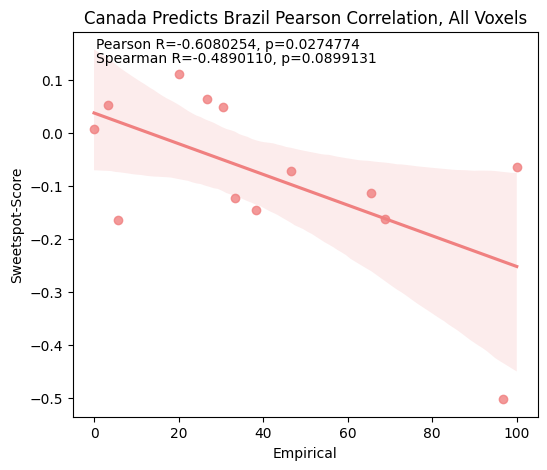

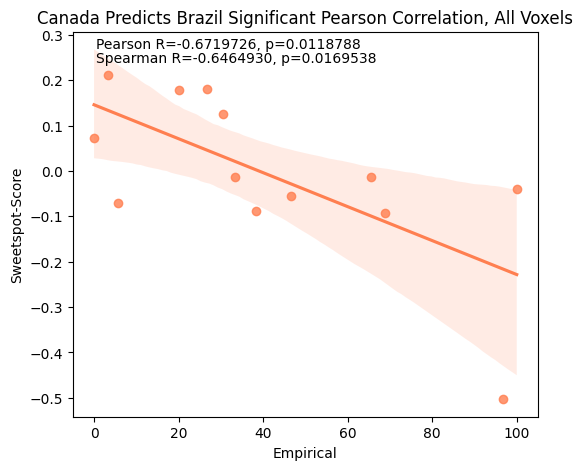

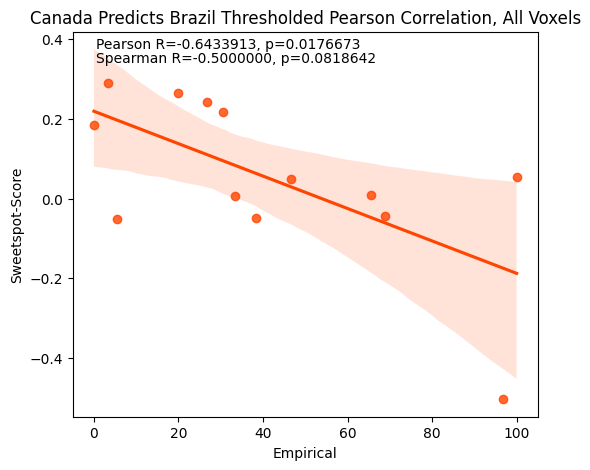

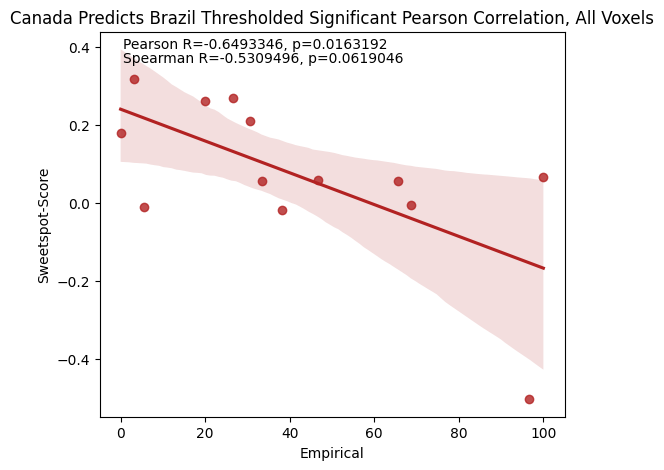

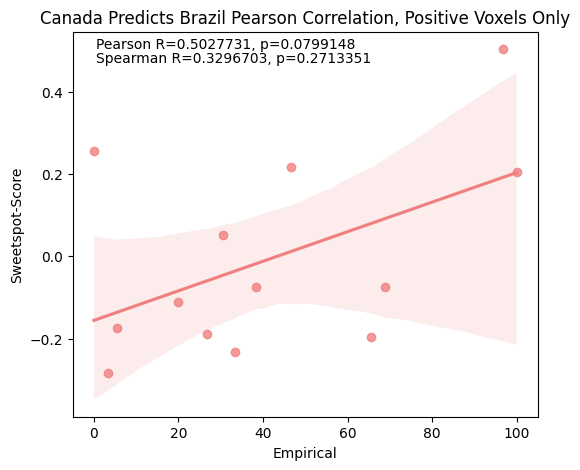

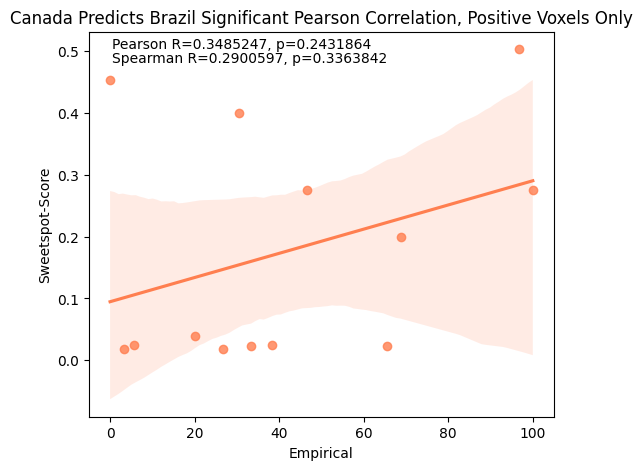

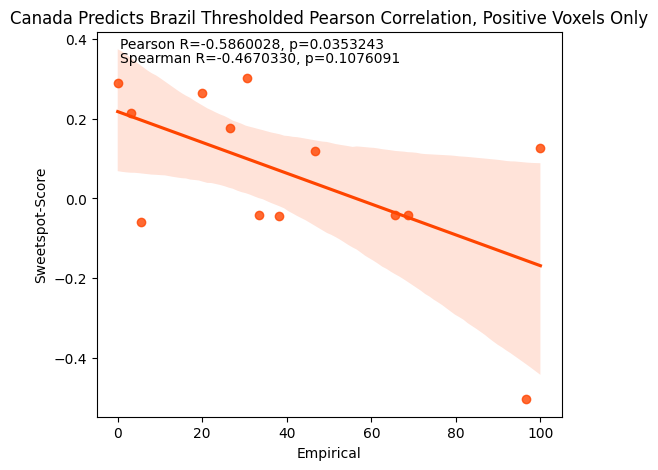

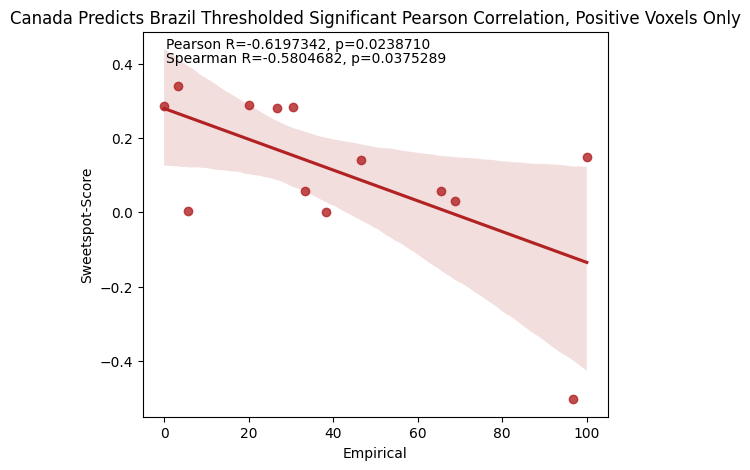

In [19]:
#pearson analysis for canada predicts brazil, relative, all voxels
def plot_pearson_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    plt.show()

plot_pearson_analysis(brazil_df, pearson_sweetspot_corr, 'Canada Predicts Brazil Pearson Correlation, All Voxels', pearson_r_val, pearson_p_val, s_pearson_r_val, s_pearson_p_val, 'lightcoral')
plot_pearson_analysis(brazil_df, sig_pearson_sweetspot_corr, 'Canada Predicts Brazil Significant Pearson Correlation, All Voxels',sig_pearson_r_val, sig_pearson_p_val, s_sig_pearson_r_val, s_sig_pearson_p_val, 'coral')
plot_pearson_analysis(brazil_df, thresholded_pearson_sweetspot_corr, 'Canada Predicts Brazil Thresholded Pearson Correlation, All Voxels',thresholded_pearson_r_val, thresholded_pearson_p_val, s_thresholded_pearson_r_val, s_thresholded_pearson_p_val, 'orangered')
plot_pearson_analysis(brazil_df, thresholded_sig_pearson_sweetspot_corr, 'Canada Predicts Brazil Thresholded Significant Pearson Correlation, All Voxels',thresholded_sig_pearson_r_val, thresholded_sig_pearson_p_val, s_thresholded_sig_pearson_r_val, s_thresholded_sig_pearson_p_val, 'firebrick')

#positive voxels
plot_pearson_analysis(brazil_df, pos_pearson_sweetspot_corr, 'Canada Predicts Brazil Pearson Correlation, Positive Voxels Only', pos_pearson_r_val, pos_pearson_p_val, pos_s_pearson_r_val, pos_s_pearson_p_val, 'lightcoral')
plot_pearson_analysis(brazil_df, pos_sig_pearson_sweetspot_corr, 'Canada Predicts Brazil Significant Pearson Correlation, Positive Voxels Only',pos_sig_pearson_r_val, pos_sig_pearson_p_val, pos_s_sig_pearson_r_val, pos_s_sig_pearson_p_val, 'coral')
plot_pearson_analysis(brazil_df, pos_thresholded_pearson_sweetspot_corr, 'Canada Predicts Brazil Thresholded Pearson Correlation, Positive Voxels Only',pos_thresholded_pearson_r_val, pos_thresholded_pearson_p_val, pos_s_thresholded_pearson_r_val, pos_s_thresholded_pearson_p_val, 'orangered')
plot_pearson_analysis(brazil_df, pos_thresholded_sig_pearson_sweetspot_corr, 'Canada Predicts Brazil Thresholded Significant Pearson Correlation, Positive Voxels Only',pos_thresholded_sig_pearson_r_val, pos_thresholded_sig_pearson_p_val, pos_s_thresholded_sig_pearson_r_val, pos_s_thresholded_sig_pearson_p_val, 'firebrick')

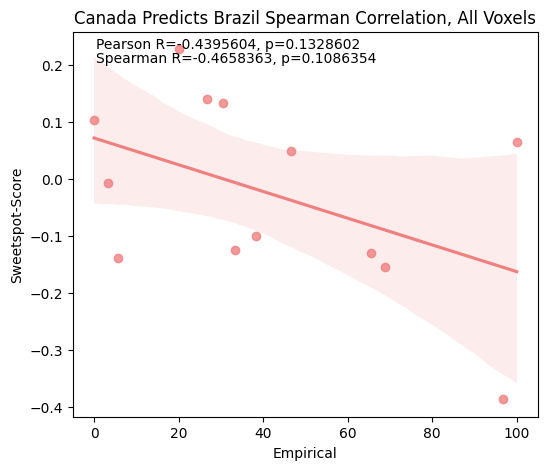

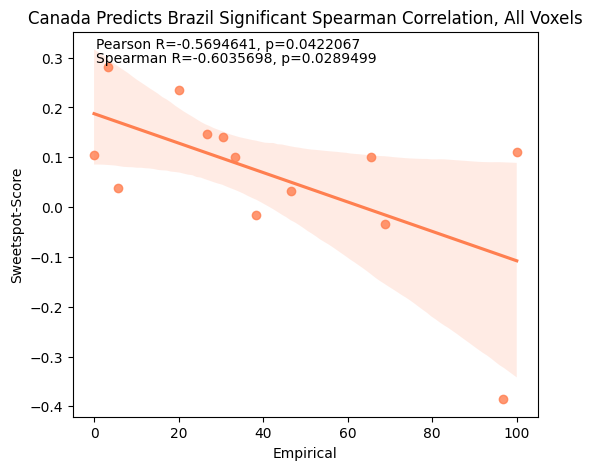

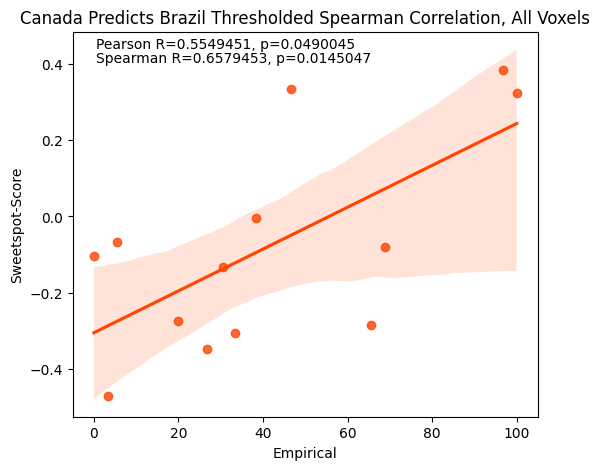

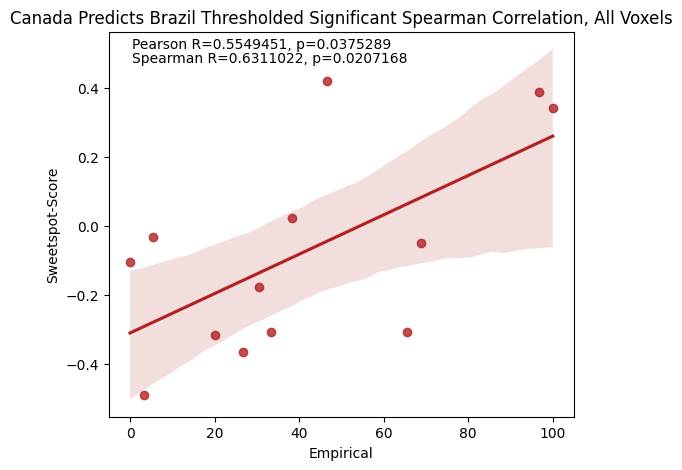

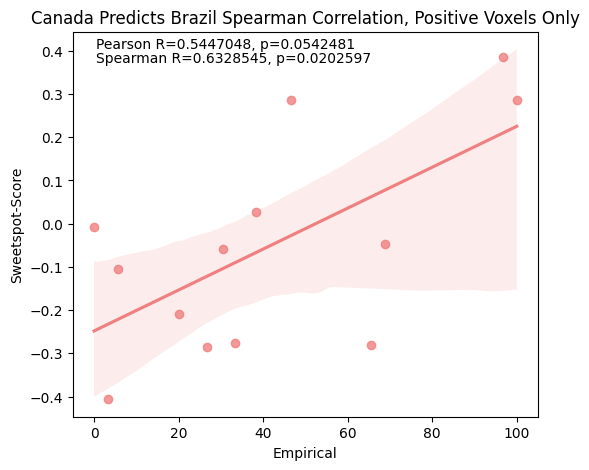

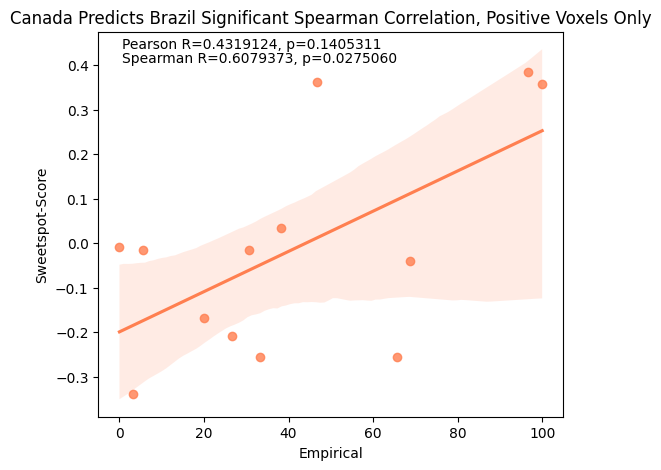

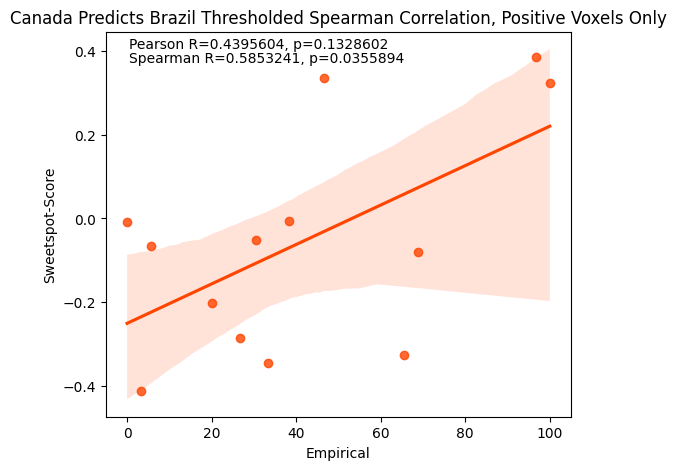

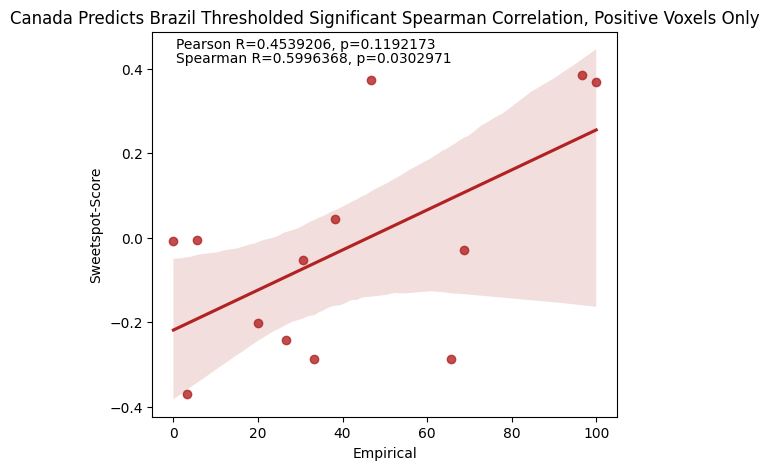

In [20]:
#spearman analysis for canada predicts brazil, relative, all voxels
def plot_spearman_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    plt.show()

plot_spearman_analysis(brazil_df, spearman_sweetspot_corr, 'Canada Predicts Brazil Spearman Correlation, All Voxels', spearman_r_val, spearman_p_val, p_spearman_r_val, p_spearman_p_val, 'lightcoral')
plot_spearman_analysis(brazil_df, sig_spearman_sweetspot_corr, 'Canada Predicts Brazil Significant Spearman Correlation, All Voxels',sig_spearman_r_val, sig_spearman_p_val, p_sig_spearman_r_val, p_sig_spearman_p_val, 'coral')
plot_spearman_analysis(brazil_df, thresholded_spearman_sweetspot_corr, 'Canada Predicts Brazil Thresholded Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_spearman_p_val, p_thresholded_spearman_r_val, p_thresholded_spearman_p_val, 'orangered')
plot_spearman_analysis(brazil_df, thresholded_sig_spearman_sweetspot_corr, 'Canada Predicts Brazil Thresholded Significant Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_sig_spearman_p_val, p_thresholded_sig_spearman_r_val, p_thresholded_sig_spearman_p_val, 'firebrick')

#positive voxels only
plot_spearman_analysis(brazil_df, pos_spearman_sweetspot_corr, 'Canada Predicts Brazil Spearman Correlation, Positive Voxels Only', pos_spearman_r_val, pos_spearman_p_val, pos_p_spearman_r_val, pos_p_spearman_p_val, 'lightcoral')
plot_spearman_analysis(brazil_df, pos_sig_spearman_sweetspot_corr, 'Canada Predicts Brazil Significant Spearman Correlation, Positive Voxels Only',pos_sig_spearman_r_val, pos_sig_spearman_p_val, pos_p_sig_spearman_r_val, pos_p_sig_spearman_p_val, 'coral')
plot_spearman_analysis(brazil_df, pos_thresholded_spearman_sweetspot_corr, 'Canada Predicts Brazil Thresholded Spearman Correlation, Positive Voxels Only',pos_thresholded_spearman_r_val, pos_thresholded_spearman_p_val, pos_p_thresholded_spearman_r_val, pos_p_thresholded_spearman_p_val, 'orangered')
plot_spearman_analysis(brazil_df, pos_thresholded_sig_spearman_sweetspot_corr, 'Canada Predicts Brazil Thresholded Significant Spearman Correlation, Positive Voxels Only',pos_thresholded_sig_spearman_r_val, pos_thresholded_sig_spearman_p_val, pos_p_thresholded_sig_spearman_r_val, pos_p_thresholded_sig_spearman_p_val, 'firebrick')

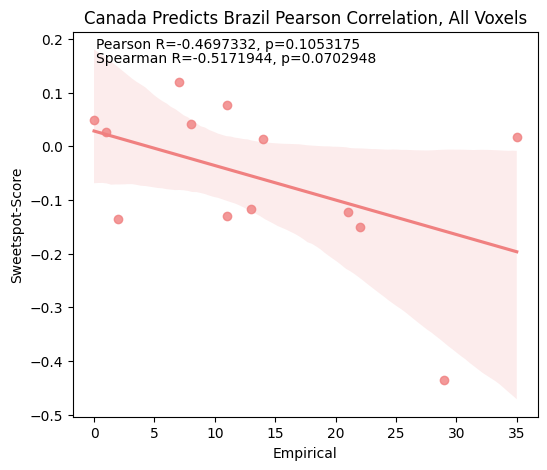

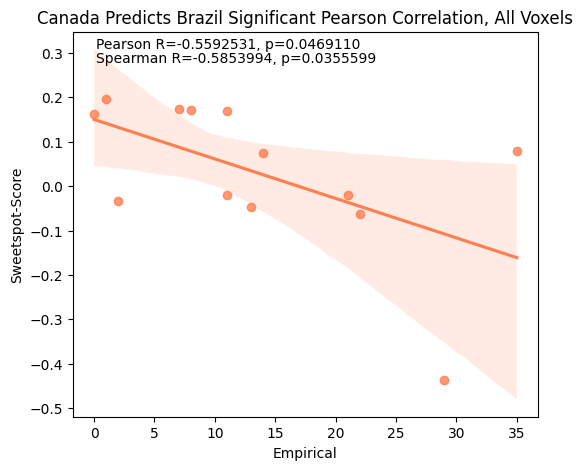

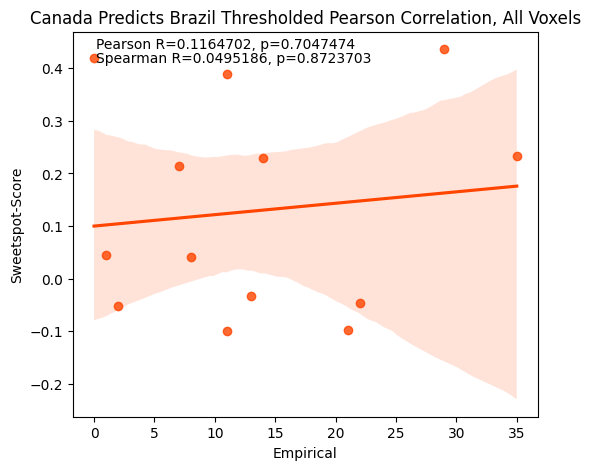

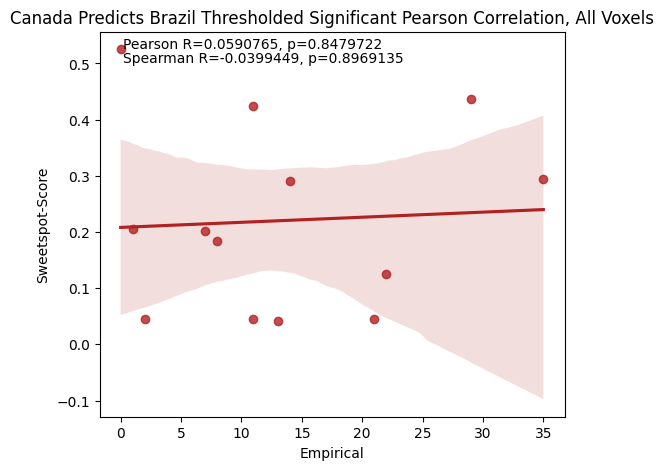

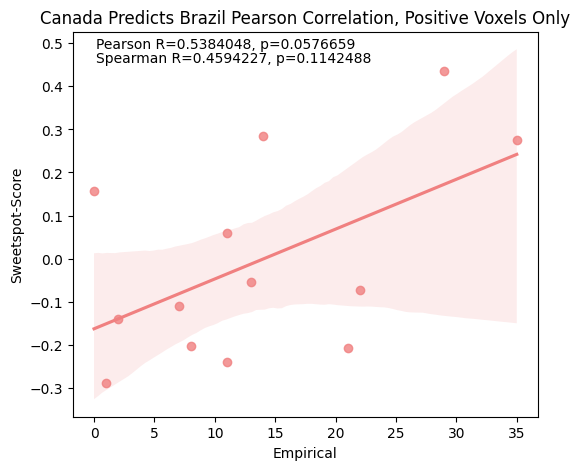

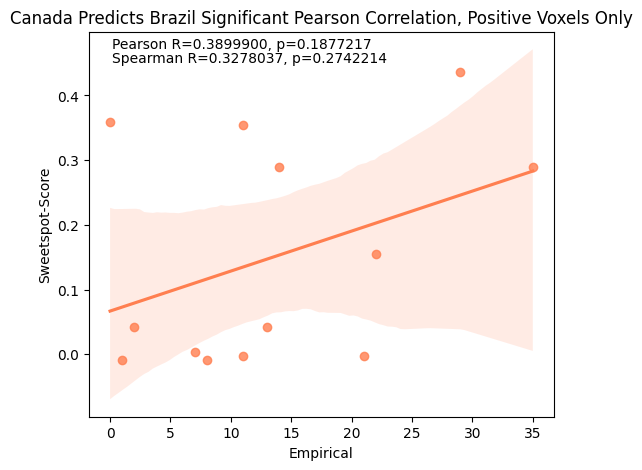

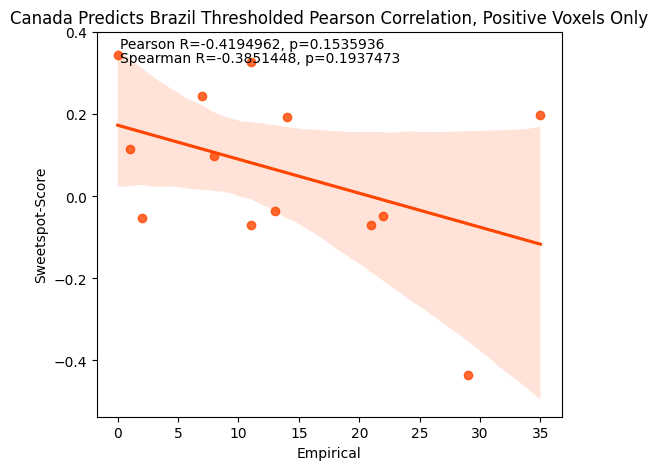

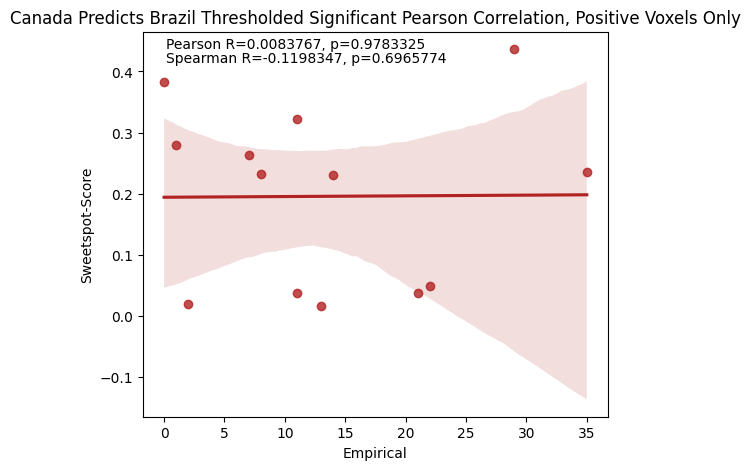

In [25]:
#pearson analysis for canada predicts brazil, absolute, all voxels
def plot_pearson_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    plt.show()

plot_pearson_analysis(brazil_df, pearson_sweetspot_corr, 'Canada Predicts Brazil Pearson Correlation, All Voxels', pearson_r_val, pearson_p_val, s_pearson_r_val, s_pearson_p_val, 'lightcoral')
plot_pearson_analysis(brazil_df, sig_pearson_sweetspot_corr, 'Canada Predicts Brazil Significant Pearson Correlation, All Voxels',sig_pearson_r_val, sig_pearson_p_val, s_sig_pearson_r_val, s_sig_pearson_p_val, 'coral')
plot_pearson_analysis(brazil_df, thresholded_pearson_sweetspot_corr, 'Canada Predicts Brazil Thresholded Pearson Correlation, All Voxels',thresholded_pearson_r_val, thresholded_pearson_p_val, s_thresholded_pearson_r_val, s_thresholded_pearson_p_val, 'orangered')
plot_pearson_analysis(brazil_df, thresholded_sig_pearson_sweetspot_corr, 'Canada Predicts Brazil Thresholded Significant Pearson Correlation, All Voxels',thresholded_sig_pearson_r_val, thresholded_sig_pearson_p_val, s_thresholded_sig_pearson_r_val, s_thresholded_sig_pearson_p_val, 'firebrick')

#positive voxels
plot_pearson_analysis(brazil_df, pos_pearson_sweetspot_corr, 'Canada Predicts Brazil Pearson Correlation, Positive Voxels Only', pos_pearson_r_val, pos_pearson_p_val, pos_s_pearson_r_val, pos_s_pearson_p_val, 'lightcoral')
plot_pearson_analysis(brazil_df, pos_sig_pearson_sweetspot_corr, 'Canada Predicts Brazil Significant Pearson Correlation, Positive Voxels Only',pos_sig_pearson_r_val, pos_sig_pearson_p_val, pos_s_sig_pearson_r_val, pos_s_sig_pearson_p_val, 'coral')
plot_pearson_analysis(brazil_df, pos_thresholded_pearson_sweetspot_corr, 'Canada Predicts Brazil Thresholded Pearson Correlation, Positive Voxels Only',pos_thresholded_pearson_r_val, pos_thresholded_pearson_p_val, pos_s_thresholded_pearson_r_val, pos_s_thresholded_pearson_p_val, 'orangered')
plot_pearson_analysis(brazil_df, pos_thresholded_sig_pearson_sweetspot_corr, 'Canada Predicts Brazil Thresholded Significant Pearson Correlation, Positive Voxels Only',pos_thresholded_sig_pearson_r_val, pos_thresholded_sig_pearson_p_val, pos_s_thresholded_sig_pearson_r_val, pos_s_thresholded_sig_pearson_p_val, 'firebrick')

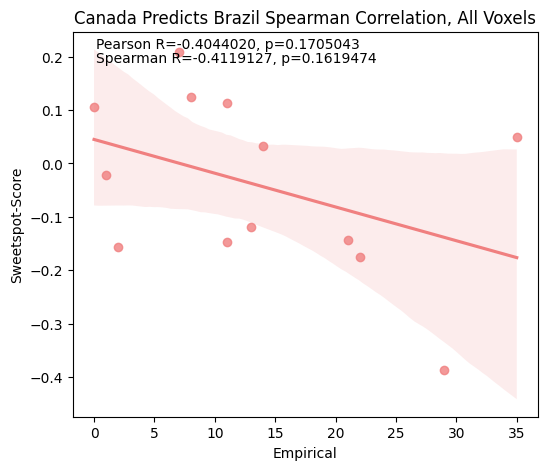

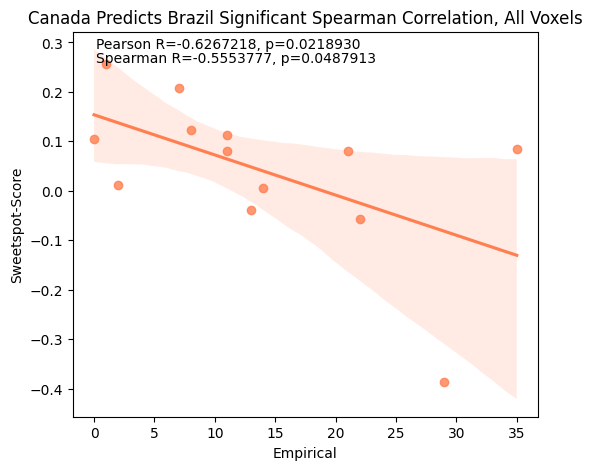

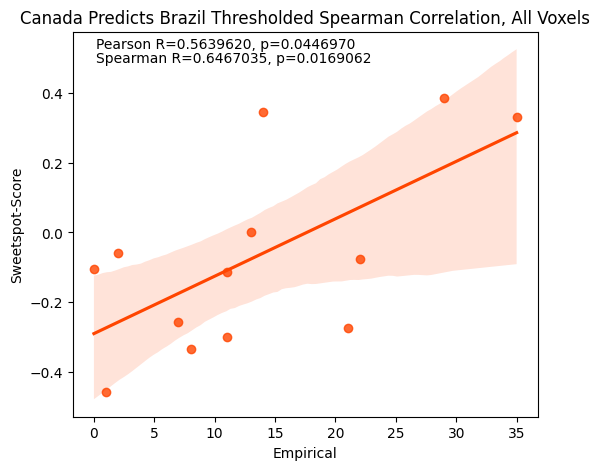

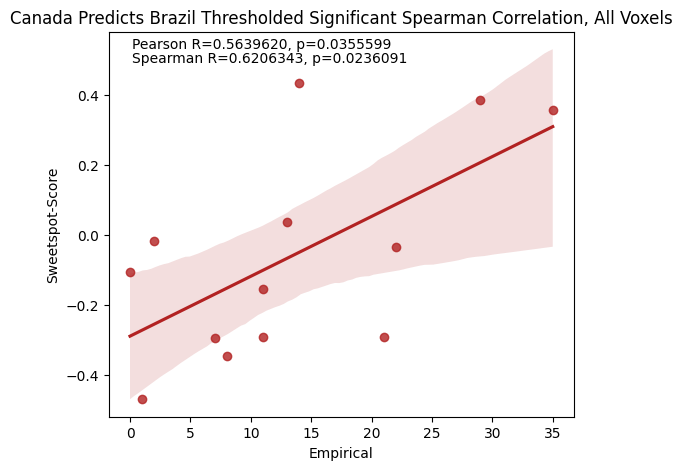

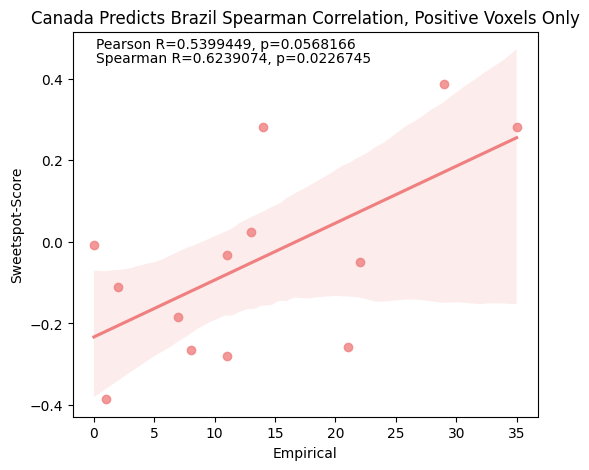

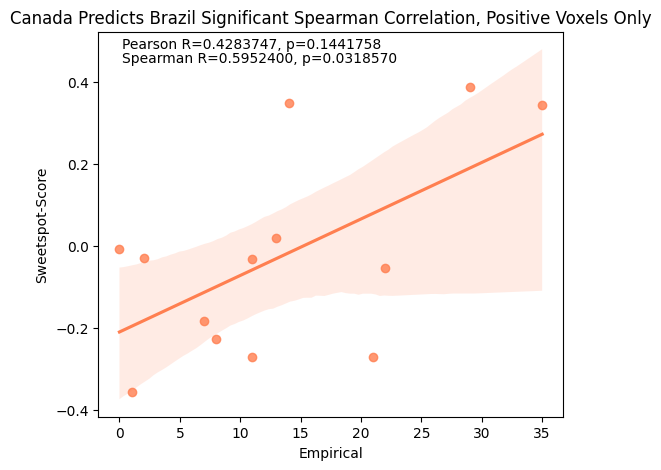

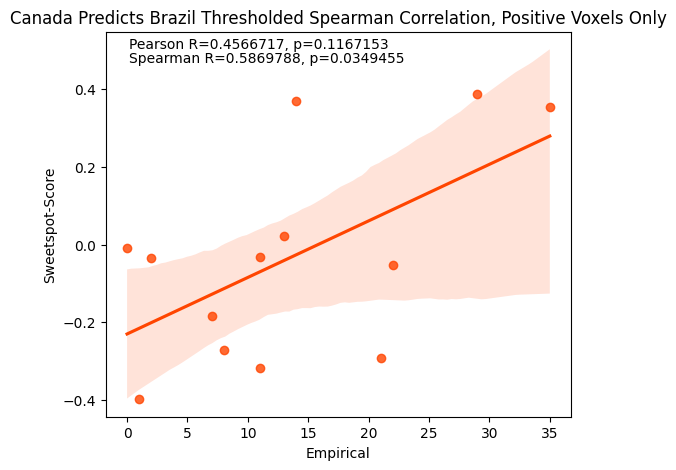

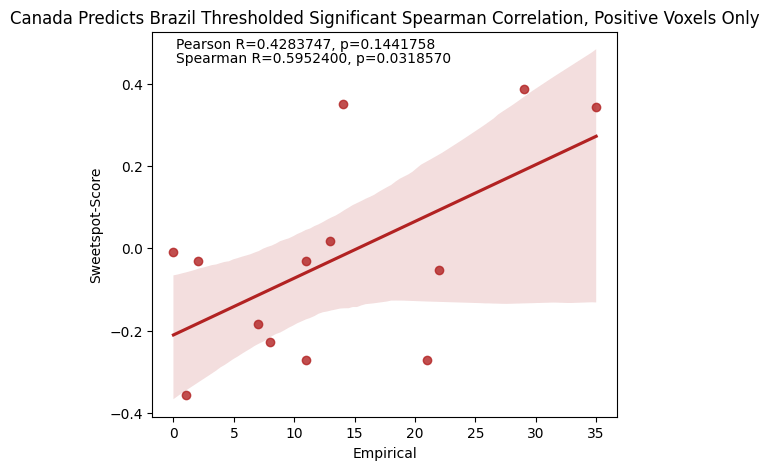

In [26]:
#spearman analysis for canada predicts brazil, absolute, all voxels
def plot_spearman_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    plt.show()

plot_spearman_analysis(brazil_df, spearman_sweetspot_corr, 'Canada Predicts Brazil Spearman Correlation, All Voxels', spearman_r_val, spearman_p_val, p_spearman_r_val, p_spearman_p_val, 'lightcoral')
plot_spearman_analysis(brazil_df, sig_spearman_sweetspot_corr, 'Canada Predicts Brazil Significant Spearman Correlation, All Voxels',sig_spearman_r_val, sig_spearman_p_val, p_sig_spearman_r_val, p_sig_spearman_p_val, 'coral')
plot_spearman_analysis(brazil_df, thresholded_spearman_sweetspot_corr, 'Canada Predicts Brazil Thresholded Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_spearman_p_val, p_thresholded_spearman_r_val, p_thresholded_spearman_p_val, 'orangered')
plot_spearman_analysis(brazil_df, thresholded_sig_spearman_sweetspot_corr, 'Canada Predicts Brazil Thresholded Significant Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_sig_spearman_p_val, p_thresholded_sig_spearman_r_val, p_thresholded_sig_spearman_p_val, 'firebrick')

#positive voxels only
plot_spearman_analysis(brazil_df, pos_spearman_sweetspot_corr, 'Canada Predicts Brazil Spearman Correlation, Positive Voxels Only', pos_spearman_r_val, pos_spearman_p_val, pos_p_spearman_r_val, pos_p_spearman_p_val, 'lightcoral')
plot_spearman_analysis(brazil_df, pos_sig_spearman_sweetspot_corr, 'Canada Predicts Brazil Significant Spearman Correlation, Positive Voxels Only',pos_sig_spearman_r_val, pos_sig_spearman_p_val, pos_p_sig_spearman_r_val, pos_p_sig_spearman_p_val, 'coral')
plot_spearman_analysis(brazil_df, pos_thresholded_spearman_sweetspot_corr, 'Canada Predicts Brazil Thresholded Spearman Correlation, Positive Voxels Only',pos_thresholded_spearman_r_val, pos_thresholded_spearman_p_val, pos_p_thresholded_spearman_r_val, pos_p_thresholded_spearman_p_val, 'orangered')
plot_spearman_analysis(brazil_df, pos_thresholded_sig_spearman_sweetspot_corr, 'Canada Predicts Brazil Thresholded Significant Spearman Correlation, Positive Voxels Only',pos_thresholded_sig_spearman_r_val, pos_thresholded_sig_spearman_p_val, pos_p_thresholded_sig_spearman_r_val, pos_p_thresholded_sig_spearman_p_val, 'firebrick')

# Brazil Predicts Canada

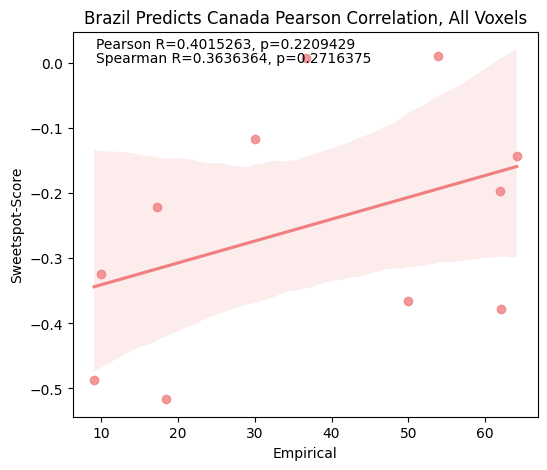

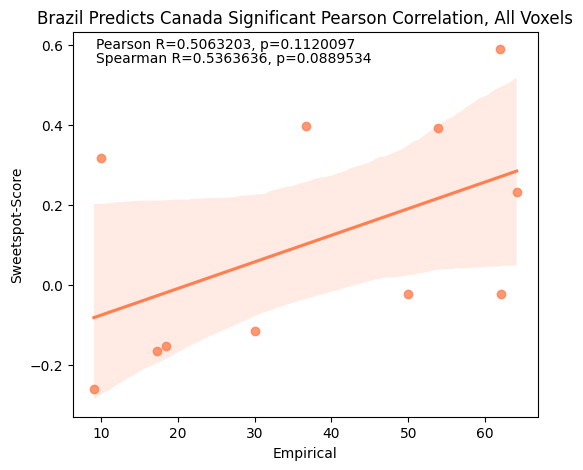

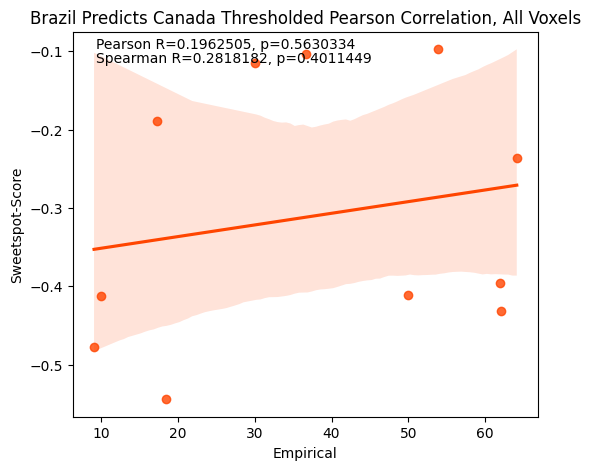

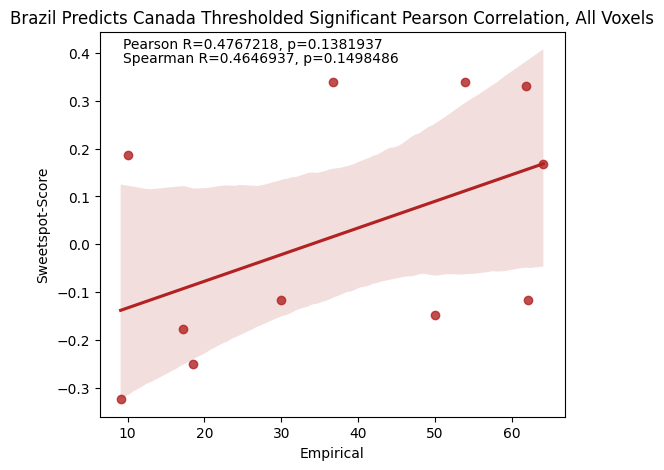

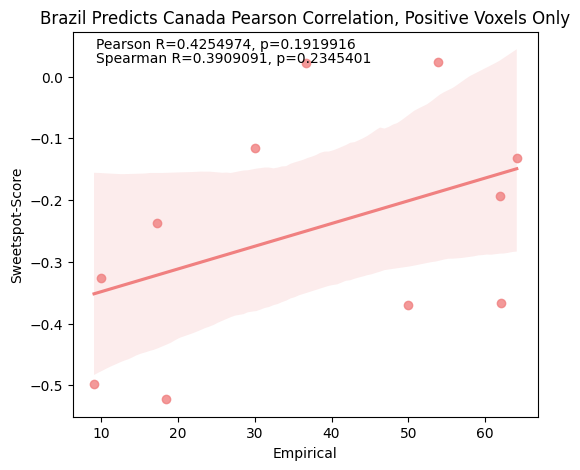

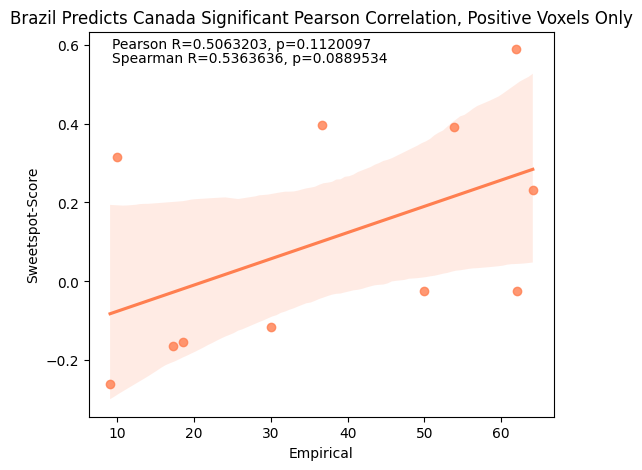

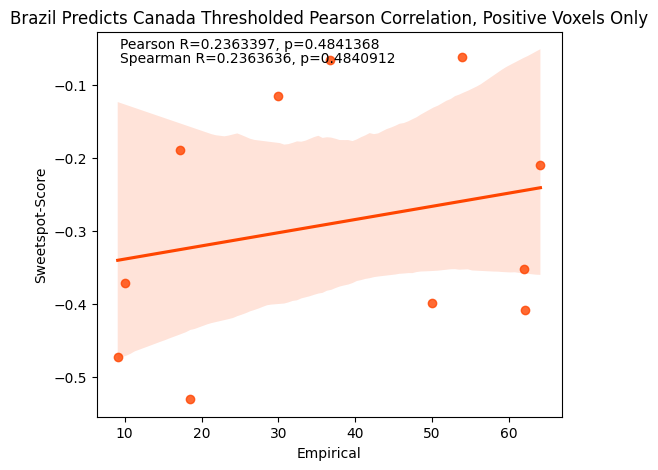

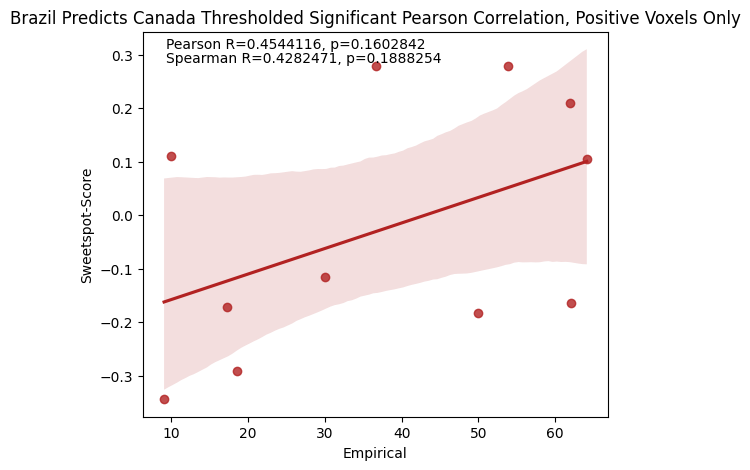

In [7]:
#pearson analysis for brazil predicts canada, relative, all voxels and positive voxels only
def plot_pearson_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    plt.show()

plot_pearson_analysis(canada_df, pearson_sweetspot_corr, 'Brazil Predicts Canada Pearson Correlation, All Voxels', pearson_r_val, pearson_p_val, s_pearson_r_val, s_pearson_p_val, 'lightcoral')
plot_pearson_analysis(canada_df, sig_pearson_sweetspot_corr, 'Brazil Predicts Canada Significant Pearson Correlation, All Voxels',sig_pearson_r_val, sig_pearson_p_val, s_sig_pearson_r_val, s_sig_pearson_p_val, 'coral')
plot_pearson_analysis(canada_df, thresholded_pearson_sweetspot_corr, 'Brazil Predicts Canada Thresholded Pearson Correlation, All Voxels',thresholded_pearson_r_val, thresholded_pearson_p_val, s_thresholded_pearson_r_val, s_thresholded_pearson_p_val, 'orangered')
plot_pearson_analysis(canada_df, thresholded_sig_pearson_sweetspot_corr, 'Brazil Predicts Canada Thresholded Significant Pearson Correlation, All Voxels',thresholded_sig_pearson_r_val, thresholded_sig_pearson_p_val, s_thresholded_sig_pearson_r_val, s_thresholded_sig_pearson_p_val, 'firebrick')

#positive only
plot_pearson_analysis(canada_df, pos_pearson_sweetspot_corr, 'Brazil Predicts Canada Pearson Correlation, Positive Voxels Only', pos_pearson_r_val, pos_pearson_p_val, pos_s_pearson_r_val, pos_s_pearson_p_val, 'lightcoral')
plot_pearson_analysis(canada_df, pos_sig_pearson_sweetspot_corr, 'Brazil Predicts Canada Significant Pearson Correlation, Positive Voxels Only',pos_sig_pearson_r_val, pos_sig_pearson_p_val, pos_s_sig_pearson_r_val, pos_s_sig_pearson_p_val, 'coral')
plot_pearson_analysis(canada_df, pos_thresholded_pearson_sweetspot_corr, 'Brazil Predicts Canada Thresholded Pearson Correlation, Positive Voxels Only',pos_thresholded_pearson_r_val, pos_thresholded_pearson_p_val, pos_s_thresholded_pearson_r_val, pos_s_thresholded_pearson_p_val, 'orangered')
plot_pearson_analysis(canada_df, pos_thresholded_sig_pearson_sweetspot_corr, 'Brazil Predicts Canada Thresholded Significant Pearson Correlation, Positive Voxels Only',pos_thresholded_sig_pearson_r_val, pos_thresholded_sig_pearson_p_val, pos_s_thresholded_sig_pearson_r_val, pos_s_thresholded_sig_pearson_p_val, 'firebrick')

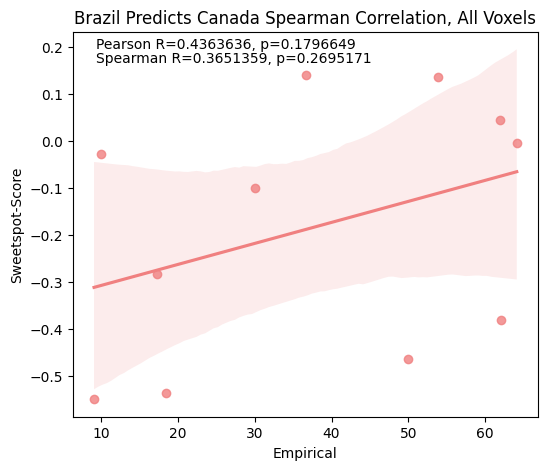

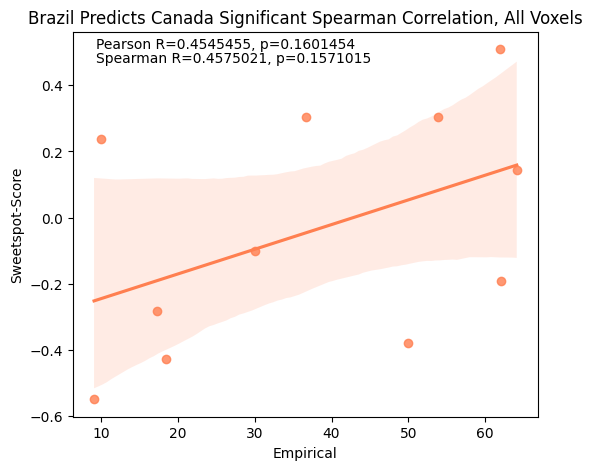

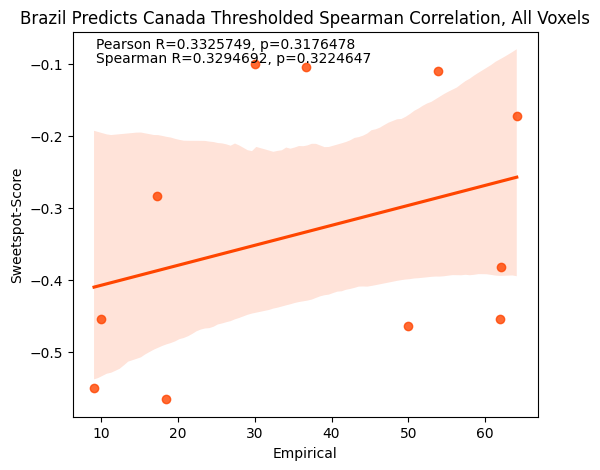

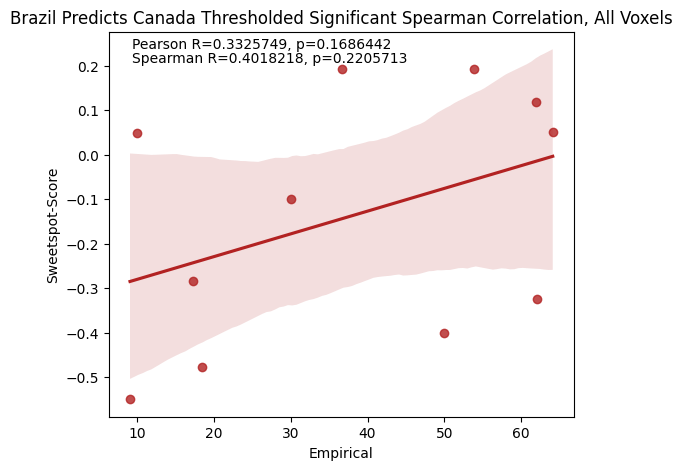

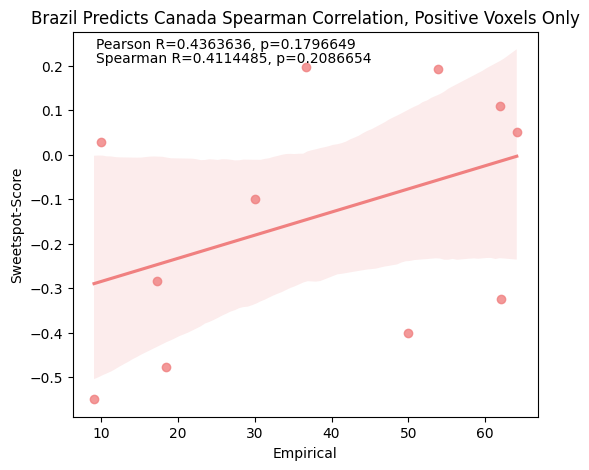

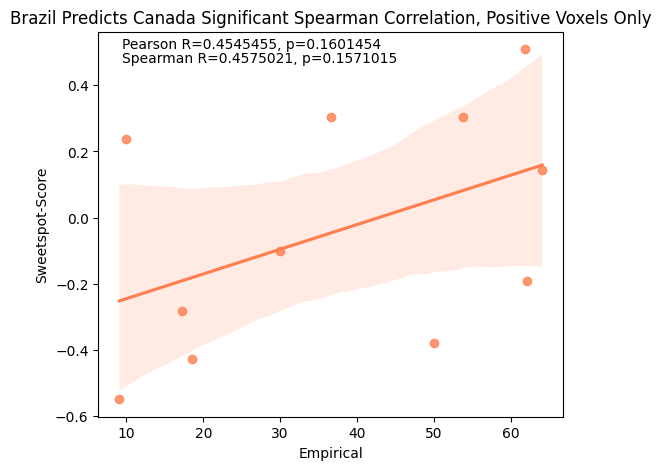

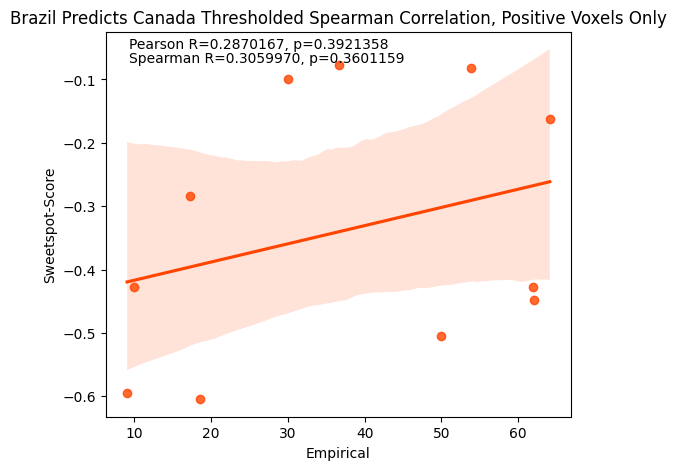

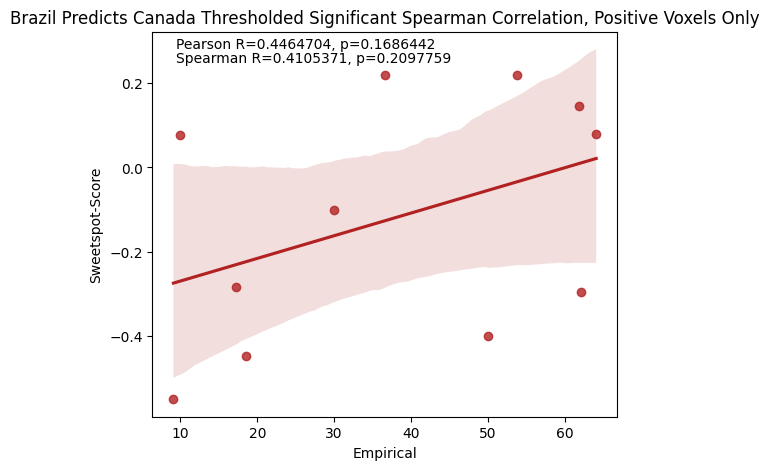

In [30]:
#spearman analysis for brazil predicts canada, relative, all voxels and positive voxels only
def plot_spearman_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    plt.show()

plot_spearman_analysis(canada_df, spearman_sweetspot_corr, 'Brazil Predicts Canada Spearman Correlation, All Voxels', spearman_r_val, spearman_p_val, p_spearman_r_val, p_spearman_p_val, 'lightcoral')
plot_spearman_analysis(canada_df, sig_spearman_sweetspot_corr, 'Brazil Predicts Canada Significant Spearman Correlation, All Voxels',sig_spearman_r_val, sig_spearman_p_val, p_sig_spearman_r_val, p_sig_spearman_p_val, 'coral')
plot_spearman_analysis(canada_df, thresholded_spearman_sweetspot_corr, 'Brazil Predicts Canada Thresholded Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_spearman_p_val, p_thresholded_spearman_r_val, p_thresholded_spearman_p_val, 'orangered')
plot_spearman_analysis(canada_df, thresholded_sig_spearman_sweetspot_corr, 'Brazil Predicts Canada Thresholded Significant Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_sig_spearman_p_val, p_thresholded_sig_spearman_r_val, p_thresholded_sig_spearman_p_val, 'firebrick')

#positive only
plot_spearman_analysis(canada_df, pos_spearman_sweetspot_corr, 'Brazil Predicts Canada Spearman Correlation, Positive Voxels Only', pos_spearman_r_val, pos_spearman_p_val, pos_p_spearman_r_val, pos_p_spearman_p_val, 'lightcoral')
plot_spearman_analysis(canada_df, pos_sig_spearman_sweetspot_corr, 'Brazil Predicts Canada Significant Spearman Correlation, Positive Voxels Only',pos_sig_spearman_r_val, pos_sig_spearman_p_val, pos_p_sig_spearman_r_val, pos_p_sig_spearman_p_val, 'coral')
plot_spearman_analysis(canada_df, pos_thresholded_spearman_sweetspot_corr, 'Brazil Predicts Canada Thresholded Spearman Correlation, Positive Voxels Only',pos_thresholded_spearman_r_val, pos_thresholded_spearman_p_val, pos_p_thresholded_spearman_r_val, pos_p_thresholded_spearman_p_val, 'orangered')
plot_spearman_analysis(canada_df, pos_thresholded_sig_spearman_sweetspot_corr, 'Brazil Predicts Canada Thresholded Significant Spearman Correlation, Positive Voxels Only',pos_thresholded_sig_spearman_r_val, pos_thresholded_sig_spearman_p_val, pos_p_thresholded_sig_spearman_r_val, pos_p_thresholded_sig_spearman_p_val, 'firebrick')

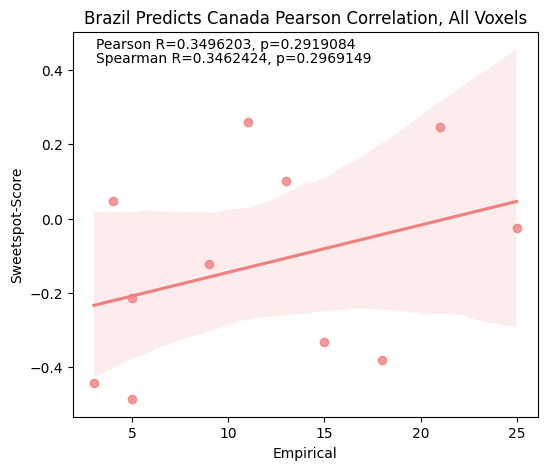

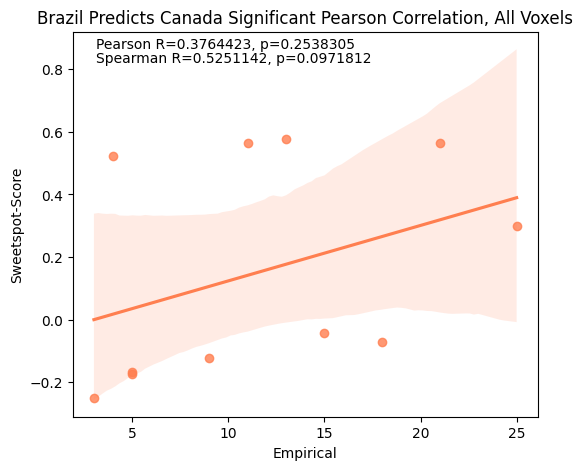

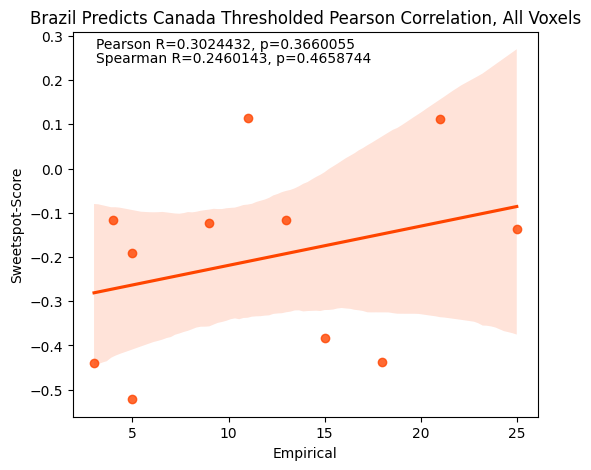

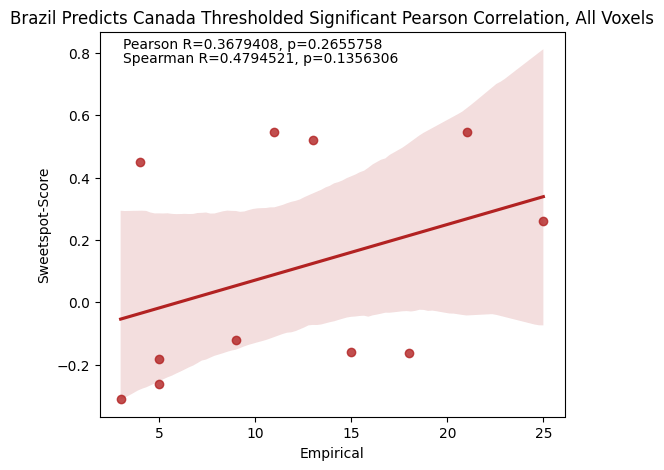

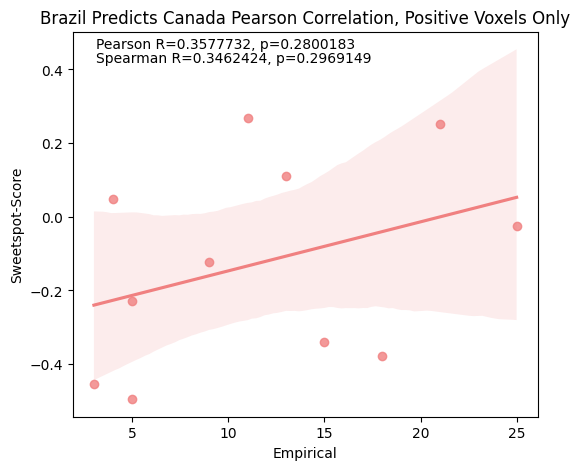

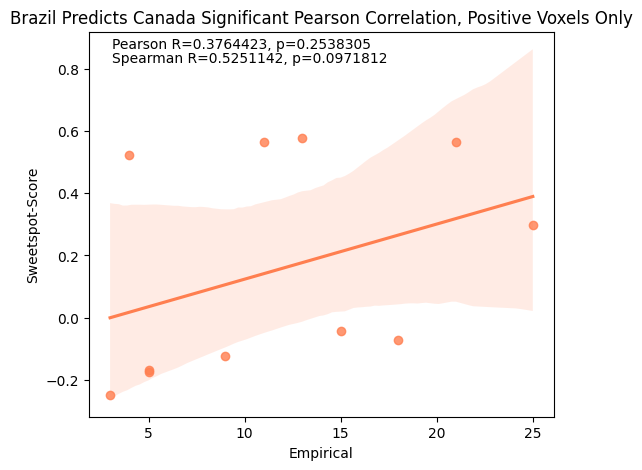

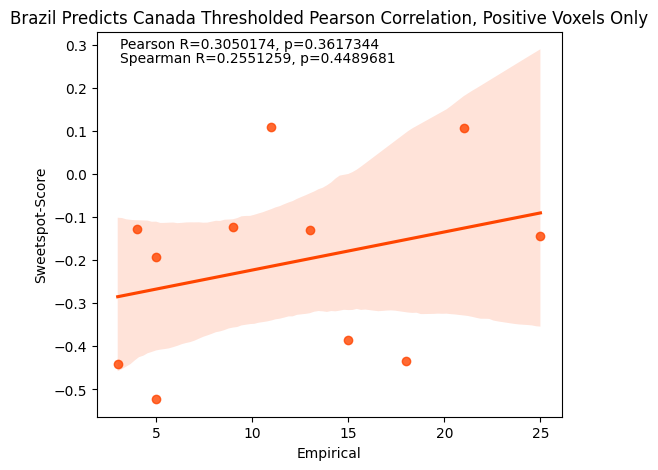

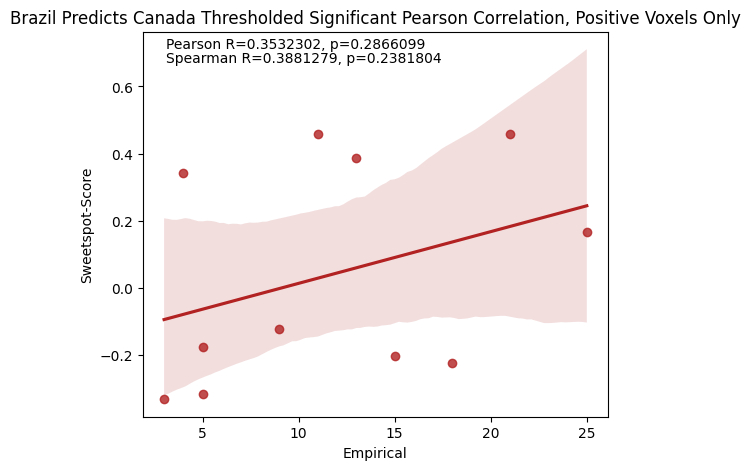

In [12]:
#pearson analysis for brazil predicts canada, absolute, all voxels and positive voxels only
def plot_pearson_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    plt.show()

plot_pearson_analysis(canada_df, pearson_sweetspot_corr, 'Brazil Predicts Canada Pearson Correlation, All Voxels', pearson_r_val, pearson_p_val, s_pearson_r_val, s_pearson_p_val, 'lightcoral')
plot_pearson_analysis(canada_df, sig_pearson_sweetspot_corr, 'Brazil Predicts Canada Significant Pearson Correlation, All Voxels',sig_pearson_r_val, sig_pearson_p_val, s_sig_pearson_r_val, s_sig_pearson_p_val, 'coral')
plot_pearson_analysis(canada_df, thresholded_pearson_sweetspot_corr, 'Brazil Predicts Canada Thresholded Pearson Correlation, All Voxels',thresholded_pearson_r_val, thresholded_pearson_p_val, s_thresholded_pearson_r_val, s_thresholded_pearson_p_val, 'orangered')
plot_pearson_analysis(canada_df, thresholded_sig_pearson_sweetspot_corr, 'Brazil Predicts Canada Thresholded Significant Pearson Correlation, All Voxels',thresholded_sig_pearson_r_val, thresholded_sig_pearson_p_val, s_thresholded_sig_pearson_r_val, s_thresholded_sig_pearson_p_val, 'firebrick')

#positive only
plot_pearson_analysis(canada_df, pos_pearson_sweetspot_corr, 'Brazil Predicts Canada Pearson Correlation, Positive Voxels Only', pos_pearson_r_val, pos_pearson_p_val, pos_s_pearson_r_val, pos_s_pearson_p_val, 'lightcoral')
plot_pearson_analysis(canada_df, pos_sig_pearson_sweetspot_corr, 'Brazil Predicts Canada Significant Pearson Correlation, Positive Voxels Only',pos_sig_pearson_r_val, pos_sig_pearson_p_val, pos_s_sig_pearson_r_val, pos_s_sig_pearson_p_val, 'coral')
plot_pearson_analysis(canada_df, pos_thresholded_pearson_sweetspot_corr, 'Brazil Predicts Canada Thresholded Pearson Correlation, Positive Voxels Only',pos_thresholded_pearson_r_val, pos_thresholded_pearson_p_val, pos_s_thresholded_pearson_r_val, pos_s_thresholded_pearson_p_val, 'orangered')
plot_pearson_analysis(canada_df, pos_thresholded_sig_pearson_sweetspot_corr, 'Brazil Predicts Canada Thresholded Significant Pearson Correlation, Positive Voxels Only',pos_thresholded_sig_pearson_r_val, pos_thresholded_sig_pearson_p_val, pos_s_thresholded_sig_pearson_r_val, pos_s_thresholded_sig_pearson_p_val, 'firebrick')

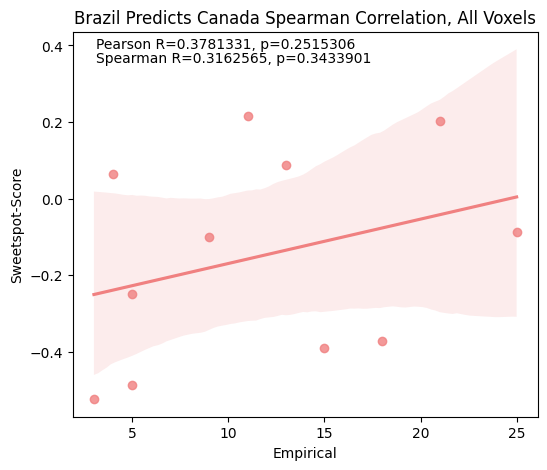

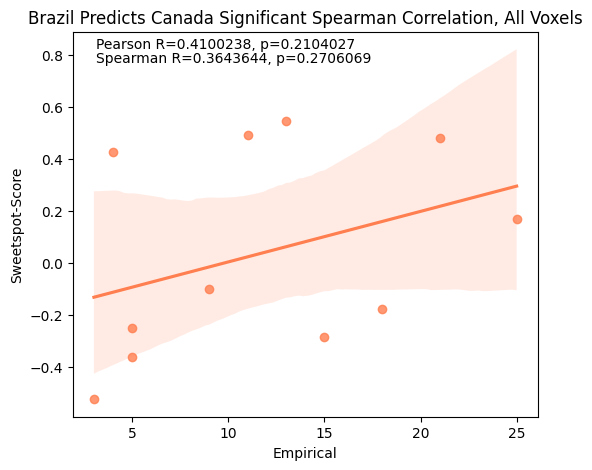

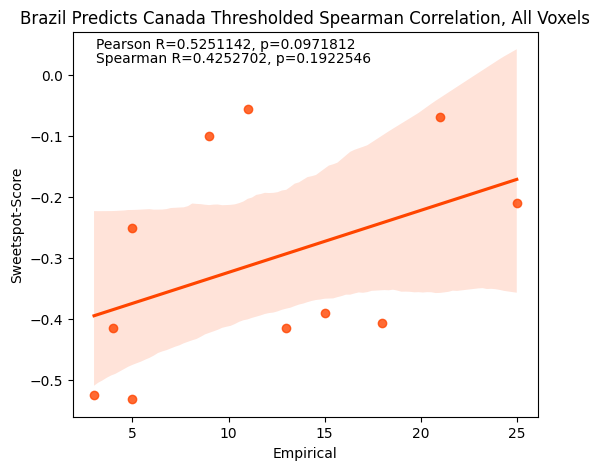

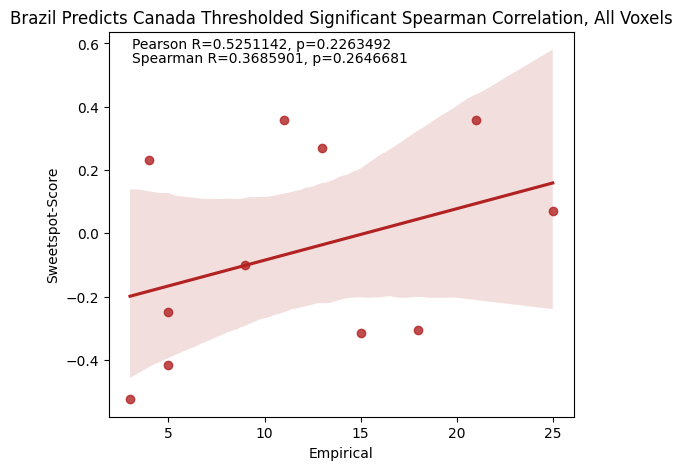

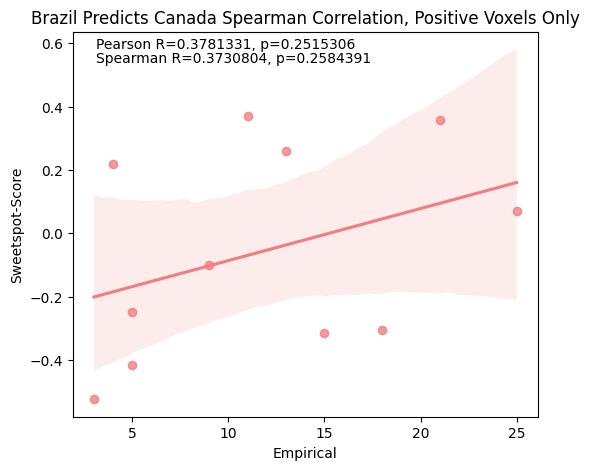

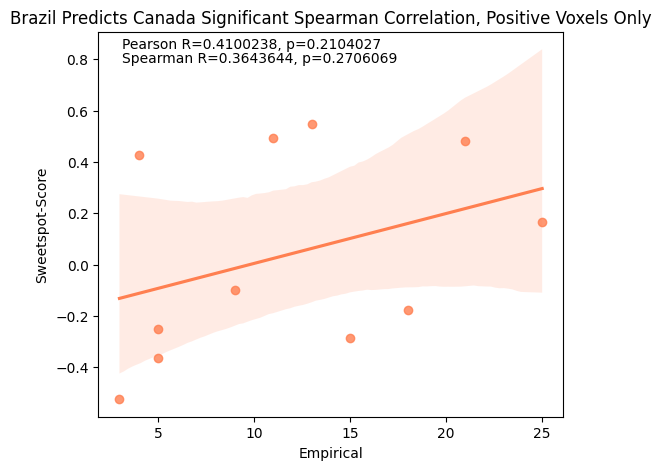

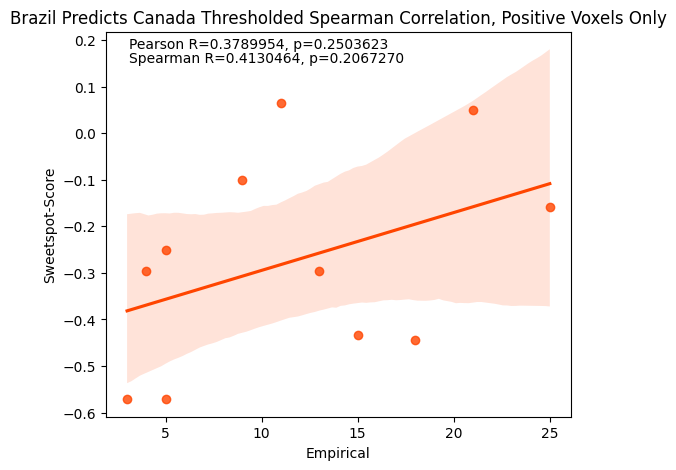

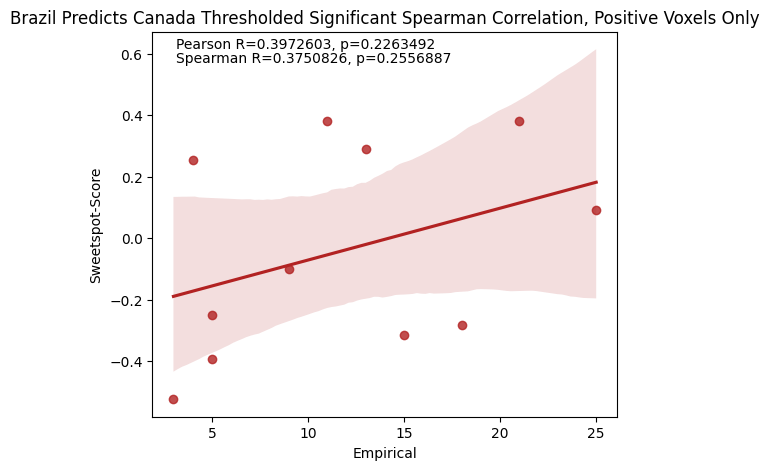

In [13]:
#spearman analysis for brazil predicts canada, absolute, all voxels and positive voxels only
def plot_spearman_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    plt.show()

plot_spearman_analysis(canada_df, spearman_sweetspot_corr, 'Brazil Predicts Canada Spearman Correlation, All Voxels', spearman_r_val, spearman_p_val, p_spearman_r_val, p_spearman_p_val, 'lightcoral')
plot_spearman_analysis(canada_df, sig_spearman_sweetspot_corr, 'Brazil Predicts Canada Significant Spearman Correlation, All Voxels',sig_spearman_r_val, sig_spearman_p_val, p_sig_spearman_r_val, p_sig_spearman_p_val, 'coral')
plot_spearman_analysis(canada_df, thresholded_spearman_sweetspot_corr, 'Brazil Predicts Canada Thresholded Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_spearman_p_val, p_thresholded_spearman_r_val, p_thresholded_spearman_p_val, 'orangered')
plot_spearman_analysis(canada_df, thresholded_sig_spearman_sweetspot_corr, 'Brazil Predicts Canada Thresholded Significant Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_sig_spearman_p_val, p_thresholded_sig_spearman_r_val, p_thresholded_sig_spearman_p_val, 'firebrick')

#positive only
plot_spearman_analysis(canada_df, pos_spearman_sweetspot_corr, 'Brazil Predicts Canada Spearman Correlation, Positive Voxels Only', pos_spearman_r_val, pos_spearman_p_val, pos_p_spearman_r_val, pos_p_spearman_p_val, 'lightcoral')
plot_spearman_analysis(canada_df, pos_sig_spearman_sweetspot_corr, 'Brazil Predicts Canada Significant Spearman Correlation, Positive Voxels Only',pos_sig_spearman_r_val, pos_sig_spearman_p_val, pos_p_sig_spearman_r_val, pos_p_sig_spearman_p_val, 'coral')
plot_spearman_analysis(canada_df, pos_thresholded_spearman_sweetspot_corr, 'Brazil Predicts Canada Thresholded Spearman Correlation, Positive Voxels Only',pos_thresholded_spearman_r_val, pos_thresholded_spearman_p_val, pos_p_thresholded_spearman_r_val, pos_p_thresholded_spearman_p_val, 'orangered')
plot_spearman_analysis(canada_df, pos_thresholded_sig_spearman_sweetspot_corr, 'Brazil Predicts Canada Thresholded Significant Spearman Correlation, Positive Voxels Only',pos_thresholded_sig_spearman_r_val, pos_thresholded_sig_spearman_p_val, pos_p_thresholded_sig_spearman_r_val, pos_p_thresholded_sig_spearman_p_val, 'firebrick')

# Brazil and SCT Predict Canada

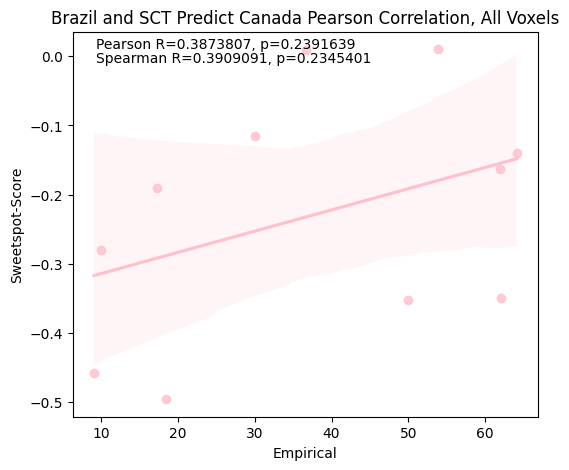

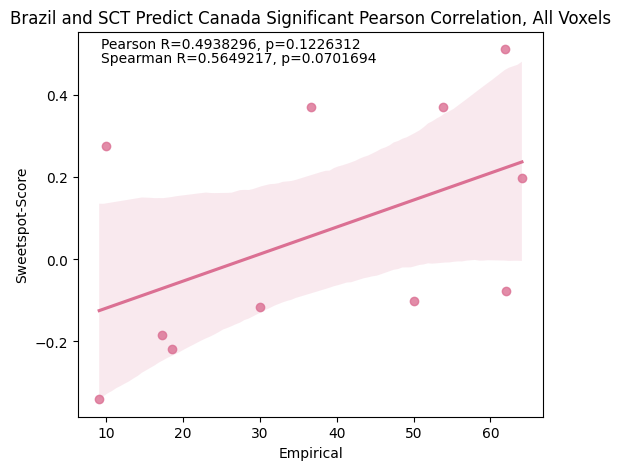

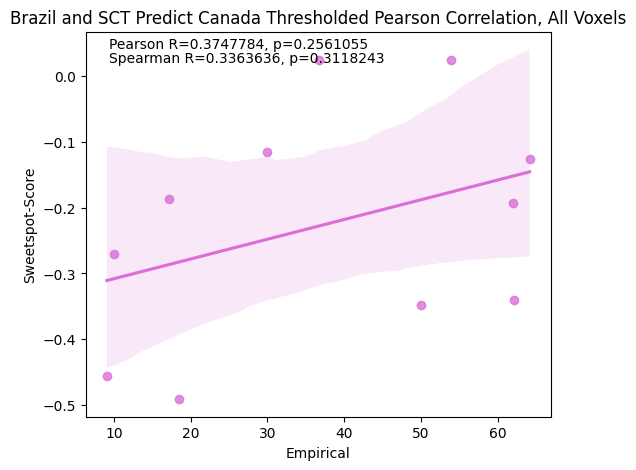

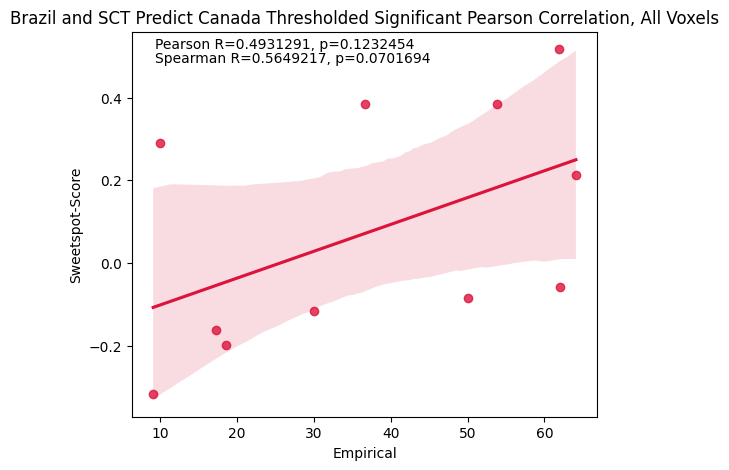

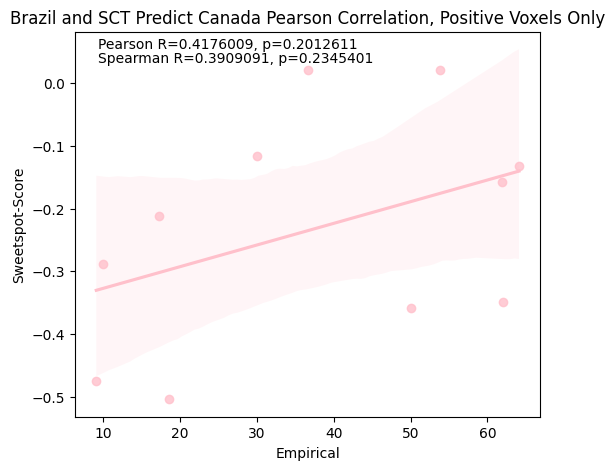

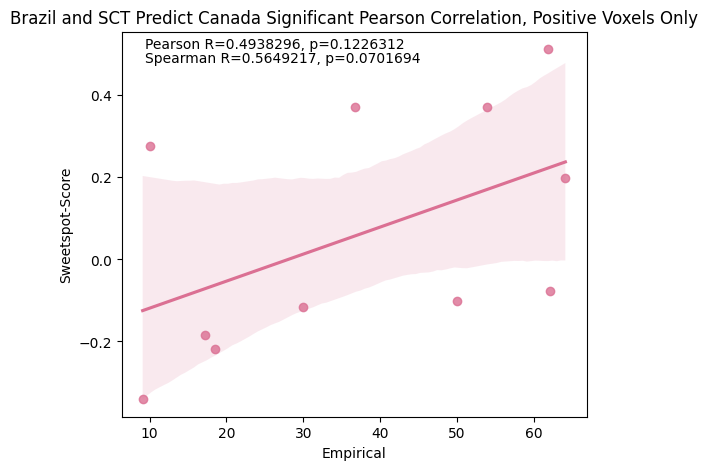

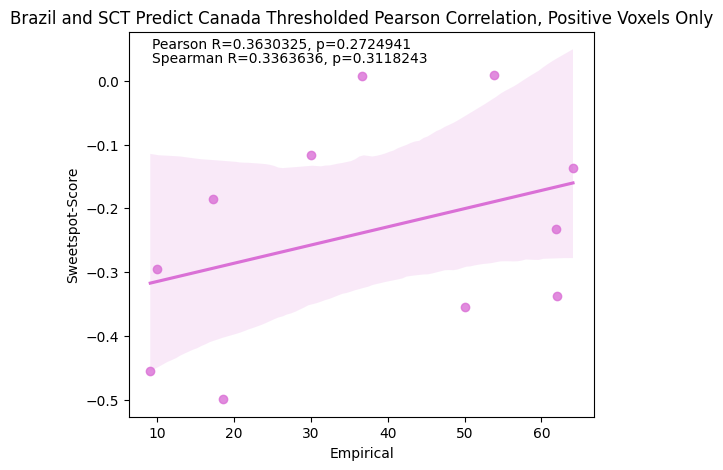

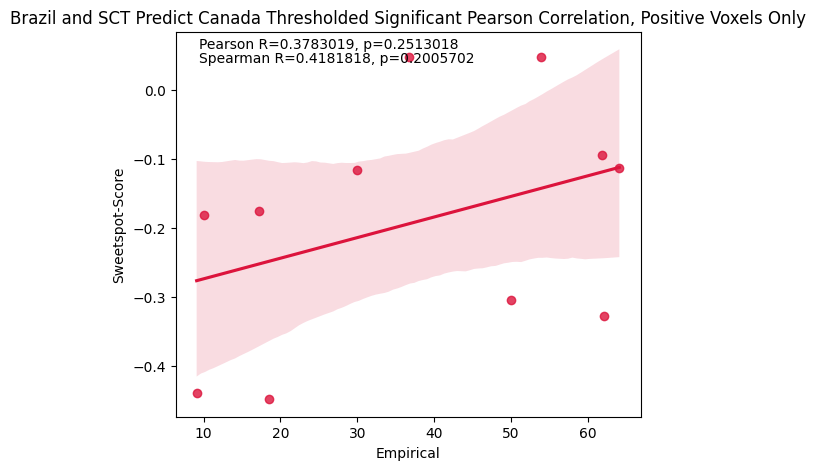

In [34]:
#pearson analysis for brazil and sct predict canada, relative, all voxels and positive voxels only
def plot_pearson_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color, save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_pearson_analysis(canada_df, pearson_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation, All Voxels', pearson_r_val, pearson_p_val, s_pearson_r_val, s_pearson_p_val, 'pink','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/relative/pearson_all.png')
plot_pearson_analysis(canada_df, sig_pearson_sweetspot_corr, 'Brazil and SCT Predict Canada Significant Pearson Correlation, All Voxels',sig_pearson_r_val, sig_pearson_p_val, s_sig_pearson_r_val, s_sig_pearson_p_val, 'palevioletred','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/relative/pearson_sig_all.png')
plot_pearson_analysis(canada_df, thresholded_pearson_sweetspot_corr, 'Brazil and SCT Predict Canada Thresholded Pearson Correlation, All Voxels',thresholded_pearson_r_val, thresholded_pearson_p_val, s_thresholded_pearson_r_val, s_thresholded_pearson_p_val, 'orchid','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/relative/pearson_thresholded_all.png')
plot_pearson_analysis(canada_df, thresholded_sig_pearson_sweetspot_corr, 'Brazil and SCT Predict Canada Thresholded Significant Pearson Correlation, All Voxels',thresholded_sig_pearson_r_val, thresholded_sig_pearson_p_val, s_thresholded_sig_pearson_r_val, s_thresholded_sig_pearson_p_val, 'crimson','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/relative/pearson_sig_thresholded_all.png')

#positive only
plot_pearson_analysis(canada_df, pos_pearson_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation, Positive Voxels Only', pos_pearson_r_val, pos_pearson_p_val, pos_s_pearson_r_val, pos_s_pearson_p_val, 'pink','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/relative/pearson_pos.png')
plot_pearson_analysis(canada_df, pos_sig_pearson_sweetspot_corr, 'Brazil and SCT Predict Canada Significant Pearson Correlation, Positive Voxels Only',pos_sig_pearson_r_val, pos_sig_pearson_p_val, pos_s_sig_pearson_r_val, pos_s_sig_pearson_p_val, 'palevioletred','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/relative/pearson_sig_pos.png')
plot_pearson_analysis(canada_df, pos_thresholded_pearson_sweetspot_corr, 'Brazil and SCT Predict Canada Thresholded Pearson Correlation, Positive Voxels Only',pos_thresholded_pearson_r_val, pos_thresholded_pearson_p_val, pos_s_thresholded_pearson_r_val, pos_s_thresholded_pearson_p_val, 'orchid','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/relative/pearson_thresholded_pos.png')
plot_pearson_analysis(canada_df, pos_thresholded_sig_pearson_sweetspot_corr, 'Brazil and SCT Predict Canada Thresholded Significant Pearson Correlation, Positive Voxels Only',pos_thresholded_sig_pearson_r_val, pos_thresholded_sig_pearson_p_val, pos_s_thresholded_sig_pearson_r_val, pos_s_thresholded_sig_pearson_p_val, 'crimson','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/relative/pearson_sig_thresholded_pos.png')

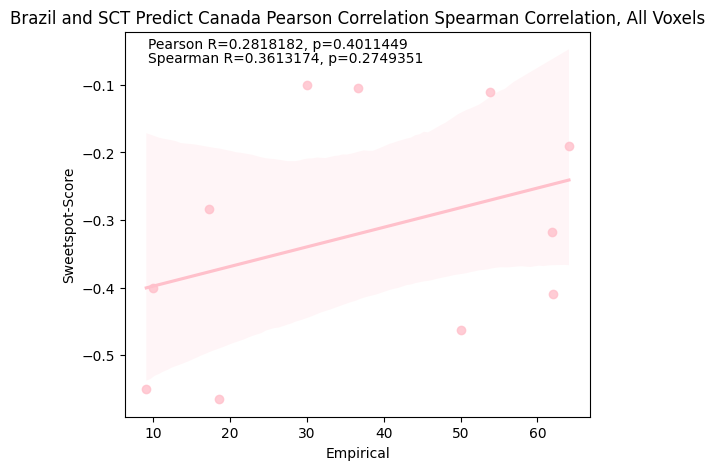

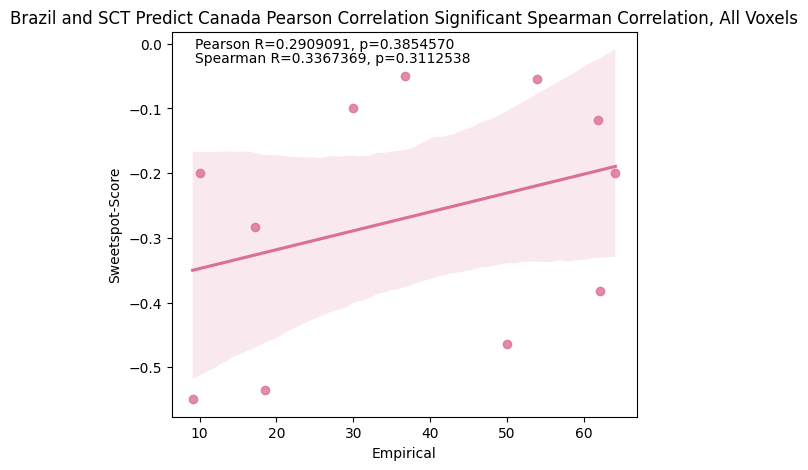

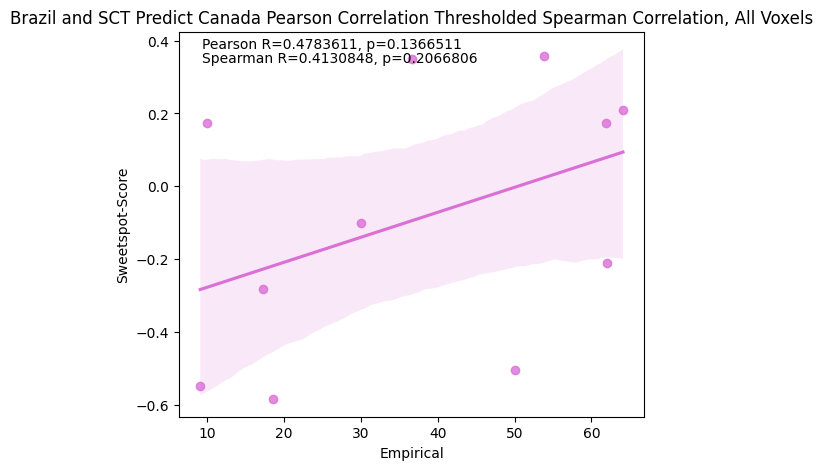

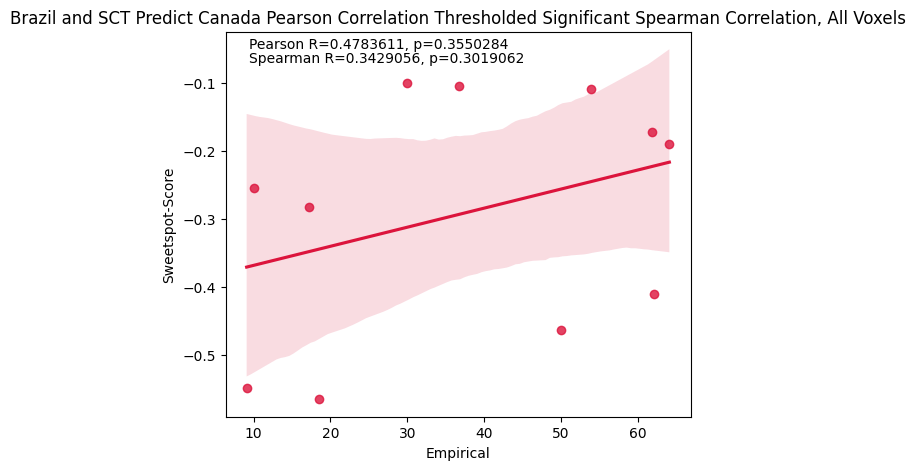

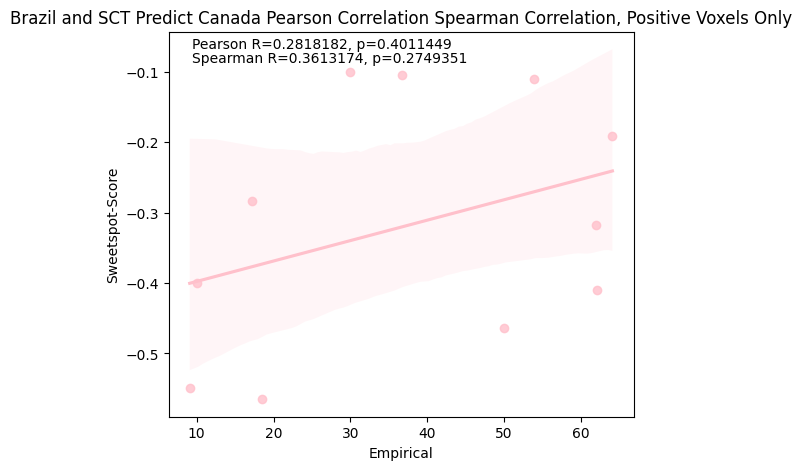

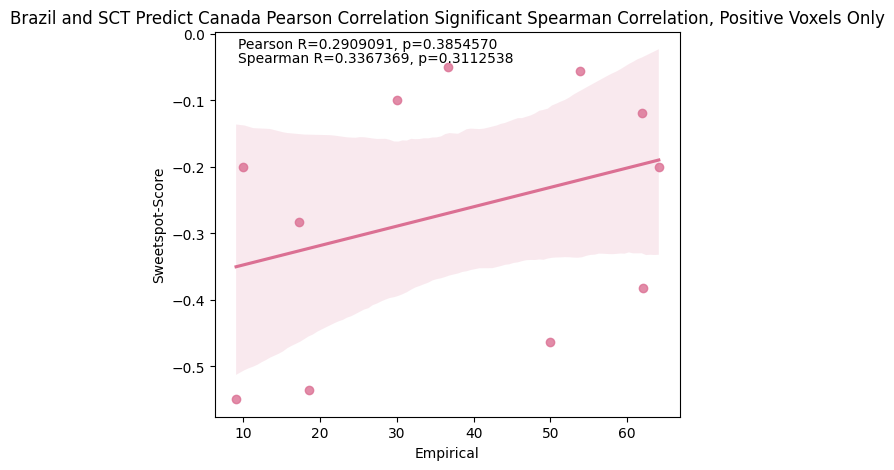

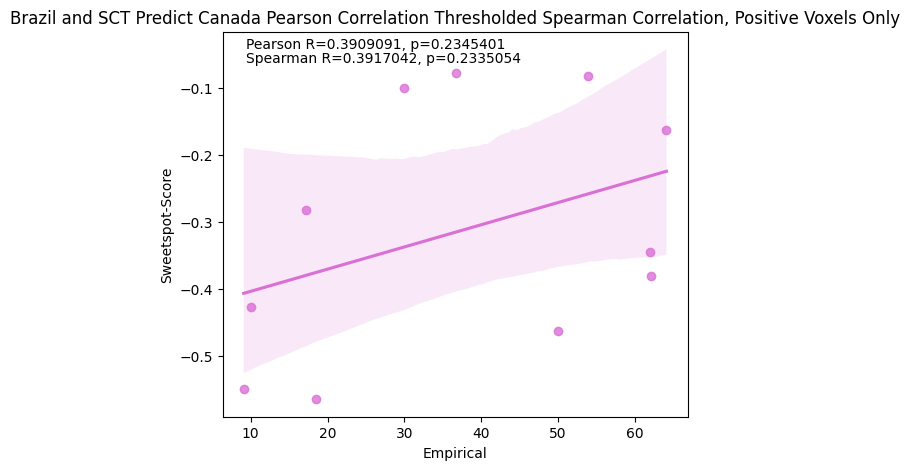

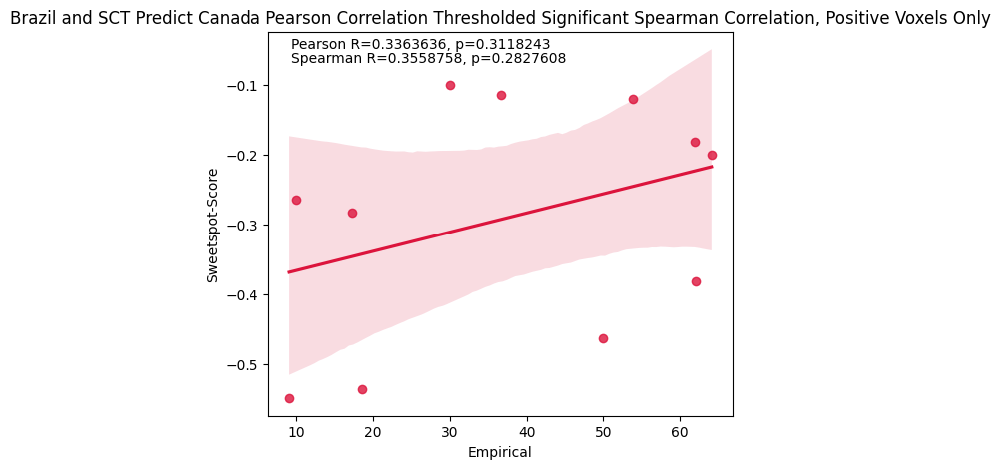

In [36]:
#spearman analysis for brazil and sct predict canada, relative, all voxels, positive voxels only
def plot_spearman_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_spearman_analysis(canada_df, spearman_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation Spearman Correlation, All Voxels', spearman_r_val, spearman_p_val, p_spearman_r_val, p_spearman_p_val, 'pink','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/relative/spearman_all.png')
plot_spearman_analysis(canada_df, sig_spearman_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation Significant Spearman Correlation, All Voxels',sig_spearman_r_val, sig_spearman_p_val, p_sig_spearman_r_val, p_sig_spearman_p_val, 'palevioletred','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/relative/spearman_sig_all.png')
plot_spearman_analysis(canada_df, thresholded_spearman_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation Thresholded Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_spearman_p_val, p_thresholded_spearman_r_val, p_thresholded_spearman_p_val, 'orchid','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/relative/spearman_thresholded_all.png')
plot_spearman_analysis(canada_df, thresholded_sig_spearman_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation Thresholded Significant Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_sig_spearman_p_val, p_thresholded_sig_spearman_r_val, p_thresholded_sig_spearman_p_val, 'crimson','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/relative/spearman_sig_thresholded_all.png')

#positive voxels
plot_spearman_analysis(canada_df, pos_spearman_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation Spearman Correlation, Positive Voxels Only', pos_spearman_r_val, pos_spearman_p_val, pos_p_spearman_r_val, pos_p_spearman_p_val, 'pink','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/relative/spearman_pos.png')
plot_spearman_analysis(canada_df, pos_sig_spearman_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation Significant Spearman Correlation, Positive Voxels Only',pos_sig_spearman_r_val, pos_sig_spearman_p_val, pos_p_sig_spearman_r_val, pos_p_sig_spearman_p_val, 'palevioletred','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/relative/spearman_sig_pos.png')
plot_spearman_analysis(canada_df, pos_thresholded_spearman_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation Thresholded Spearman Correlation, Positive Voxels Only',pos_thresholded_spearman_r_val, pos_thresholded_spearman_p_val, pos_p_thresholded_spearman_r_val, pos_p_thresholded_spearman_p_val, 'orchid','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/relative/spearman_thresholded_pos.png')
plot_spearman_analysis(canada_df, pos_thresholded_sig_spearman_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation Thresholded Significant Spearman Correlation, Positive Voxels Only',pos_thresholded_sig_spearman_r_val, pos_thresholded_sig_spearman_p_val, pos_p_thresholded_sig_spearman_r_val, pos_p_thresholded_sig_spearman_p_val, 'crimson','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/relative/spearman_sig_thresholded_pos.png')

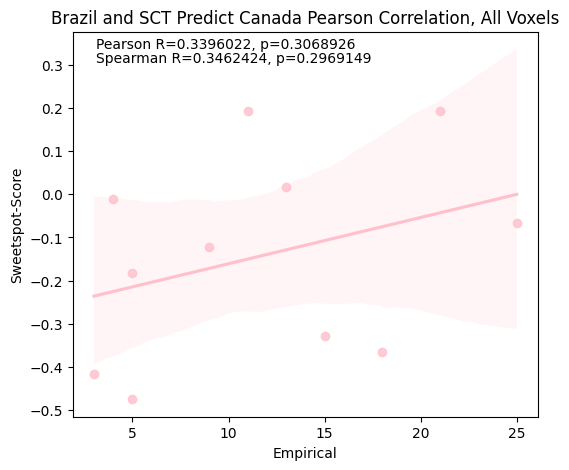

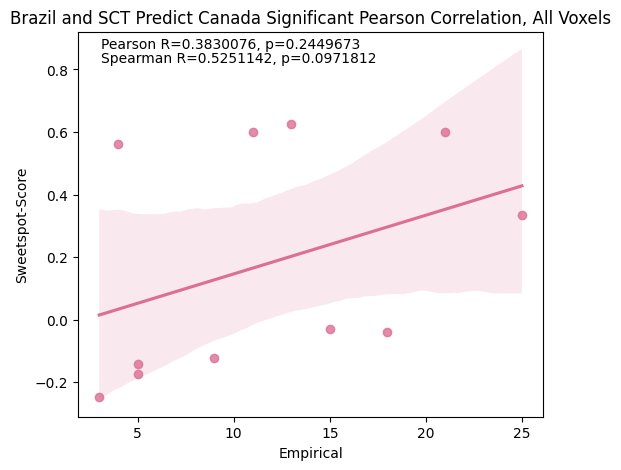

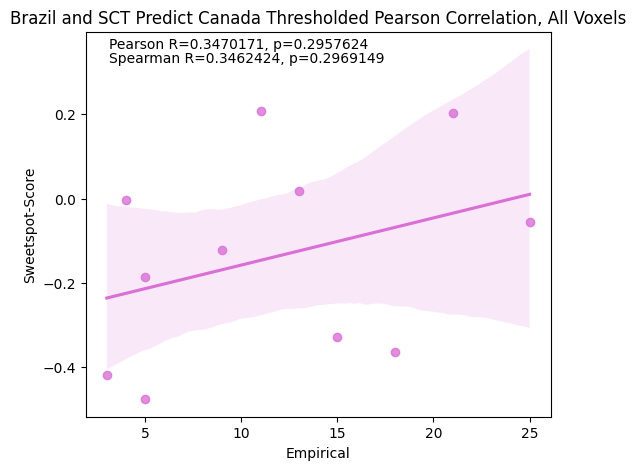

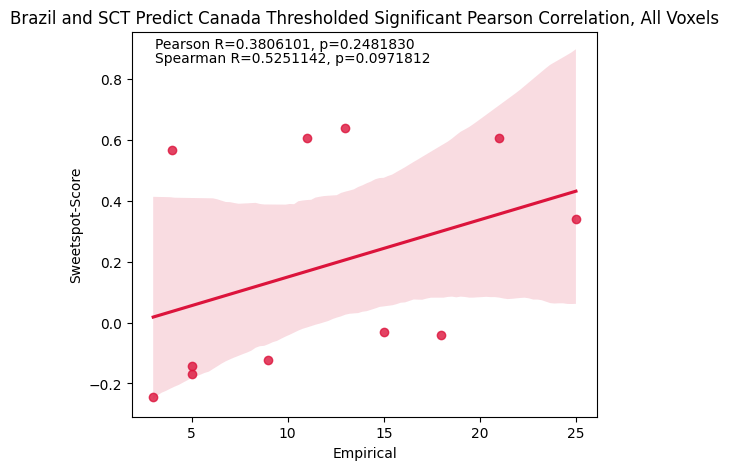

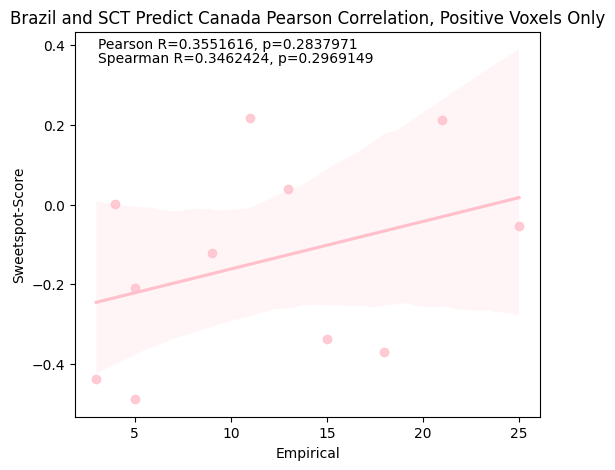

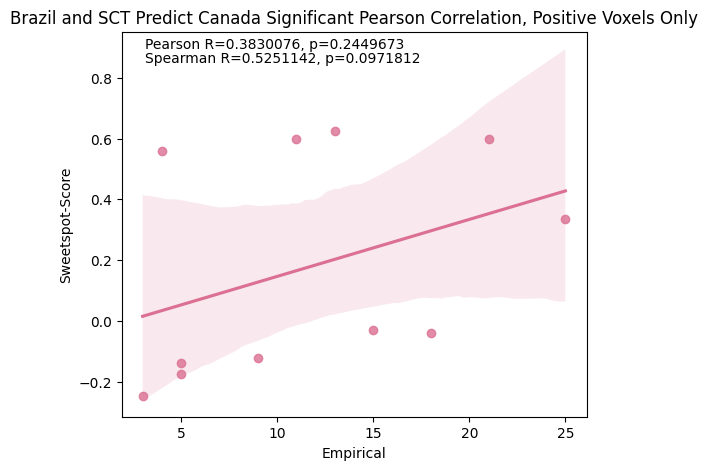

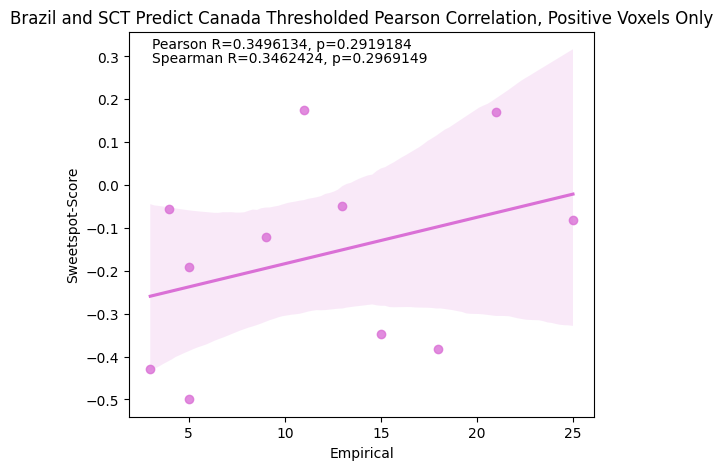

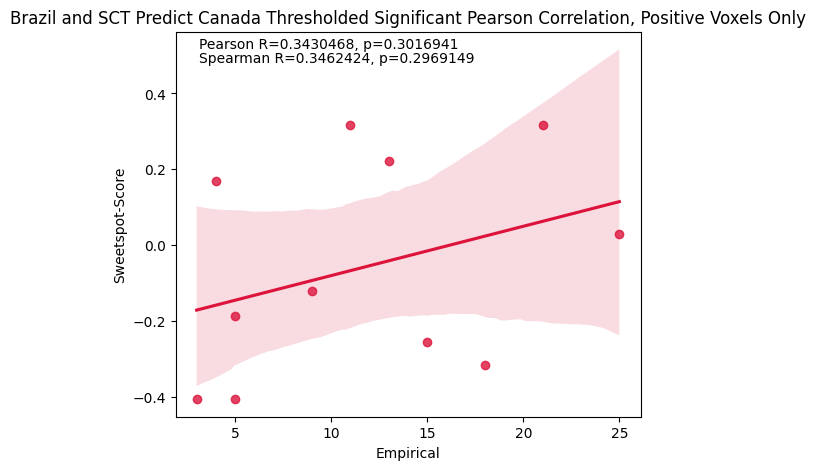

In [40]:
#pearson analysis for brazil and sct predict canada, absolute, all voxels and positive voxels only
def plot_pearson_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color, save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_pearson_analysis(canada_df, pearson_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation, All Voxels', pearson_r_val, pearson_p_val, s_pearson_r_val, s_pearson_p_val, 'pink','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/absolute/pearson_all.png')
plot_pearson_analysis(canada_df, sig_pearson_sweetspot_corr, 'Brazil and SCT Predict Canada Significant Pearson Correlation, All Voxels',sig_pearson_r_val, sig_pearson_p_val, s_sig_pearson_r_val, s_sig_pearson_p_val, 'palevioletred','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/absolute/pearson_sig_all.png')
plot_pearson_analysis(canada_df, thresholded_pearson_sweetspot_corr, 'Brazil and SCT Predict Canada Thresholded Pearson Correlation, All Voxels',thresholded_pearson_r_val, thresholded_pearson_p_val, s_thresholded_pearson_r_val, s_thresholded_pearson_p_val, 'orchid','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/absolute/pearson_thresholded_all.png')
plot_pearson_analysis(canada_df, thresholded_sig_pearson_sweetspot_corr, 'Brazil and SCT Predict Canada Thresholded Significant Pearson Correlation, All Voxels',thresholded_sig_pearson_r_val, thresholded_sig_pearson_p_val, s_thresholded_sig_pearson_r_val, s_thresholded_sig_pearson_p_val, 'crimson','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/absolute/pearson_sig_thresholded_all.png')

#positive only
plot_pearson_analysis(canada_df, pos_pearson_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation, Positive Voxels Only', pos_pearson_r_val, pos_pearson_p_val, pos_s_pearson_r_val, pos_s_pearson_p_val, 'pink','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/absolute/pearson_pos.png')
plot_pearson_analysis(canada_df, pos_sig_pearson_sweetspot_corr, 'Brazil and SCT Predict Canada Significant Pearson Correlation, Positive Voxels Only',pos_sig_pearson_r_val, pos_sig_pearson_p_val, pos_s_sig_pearson_r_val, pos_s_sig_pearson_p_val, 'palevioletred','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/absolute/pearson_sig_pos.png')
plot_pearson_analysis(canada_df, pos_thresholded_pearson_sweetspot_corr, 'Brazil and SCT Predict Canada Thresholded Pearson Correlation, Positive Voxels Only',pos_thresholded_pearson_r_val, pos_thresholded_pearson_p_val, pos_s_thresholded_pearson_r_val, pos_s_thresholded_pearson_p_val, 'orchid','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/absolute/pearson_thresholded_pos.png')
plot_pearson_analysis(canada_df, pos_thresholded_sig_pearson_sweetspot_corr, 'Brazil and SCT Predict Canada Thresholded Significant Pearson Correlation, Positive Voxels Only',pos_thresholded_sig_pearson_r_val, pos_thresholded_sig_pearson_p_val, pos_s_thresholded_sig_pearson_r_val, pos_s_thresholded_sig_pearson_p_val, 'crimson','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/absolute/pearson_sig_thresholded_pos.png')

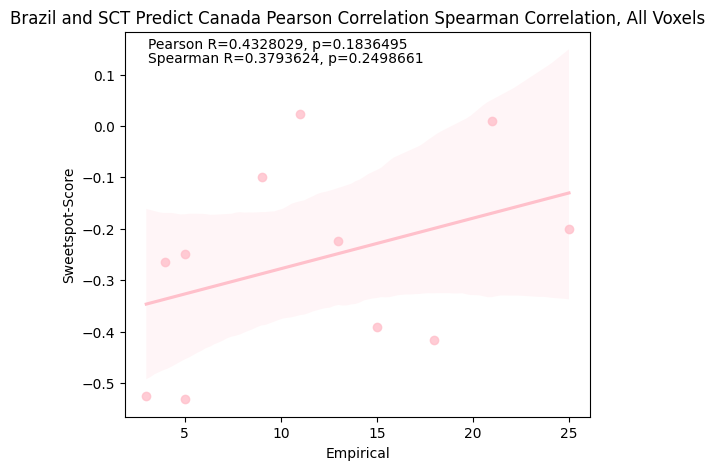

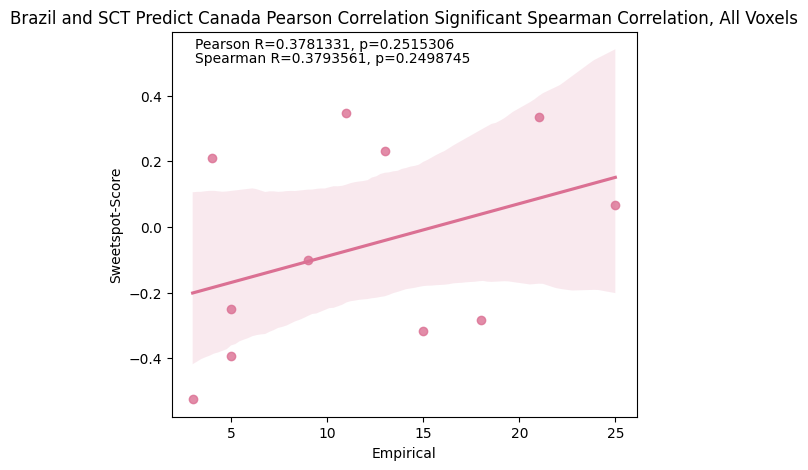

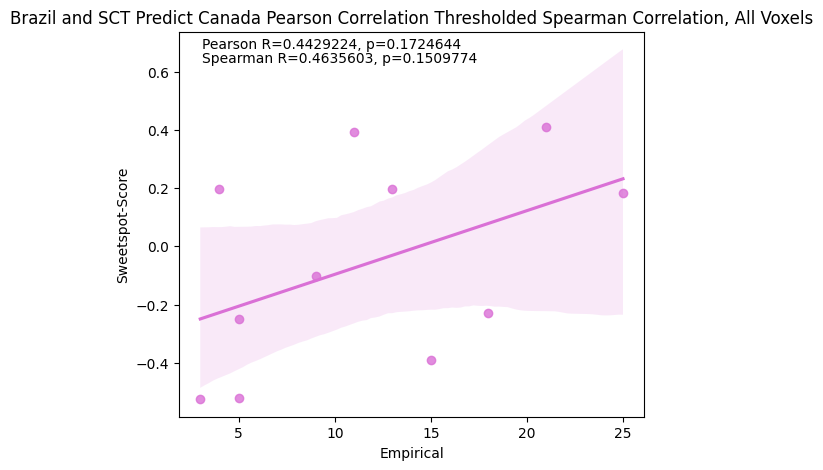

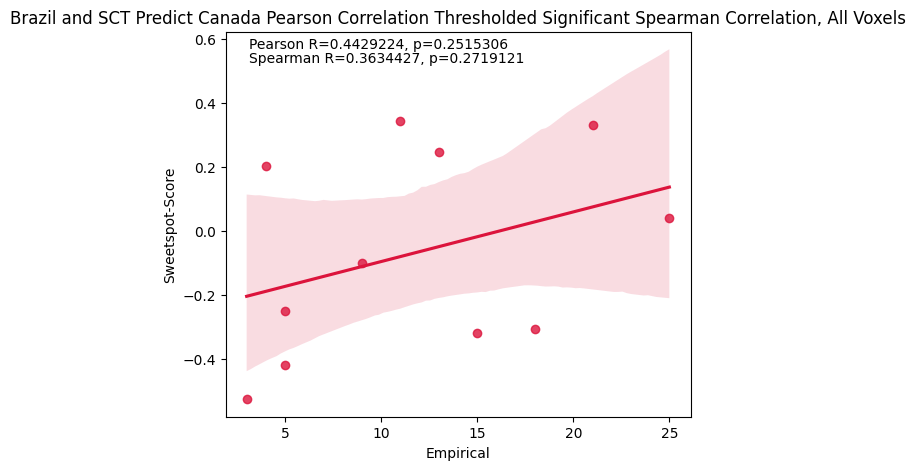

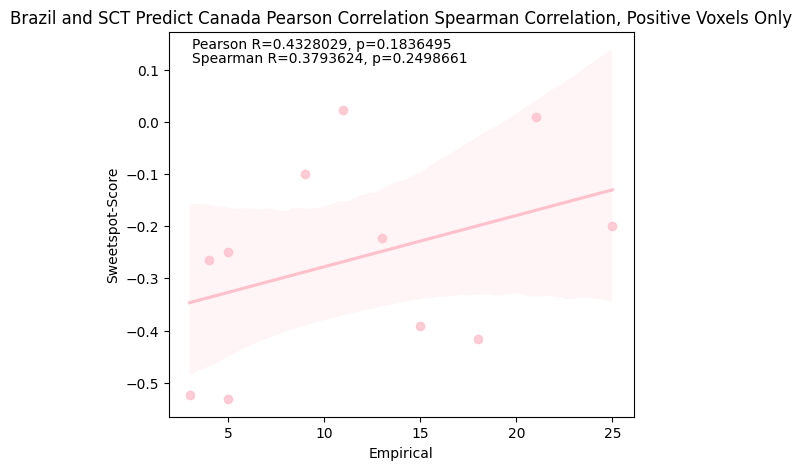

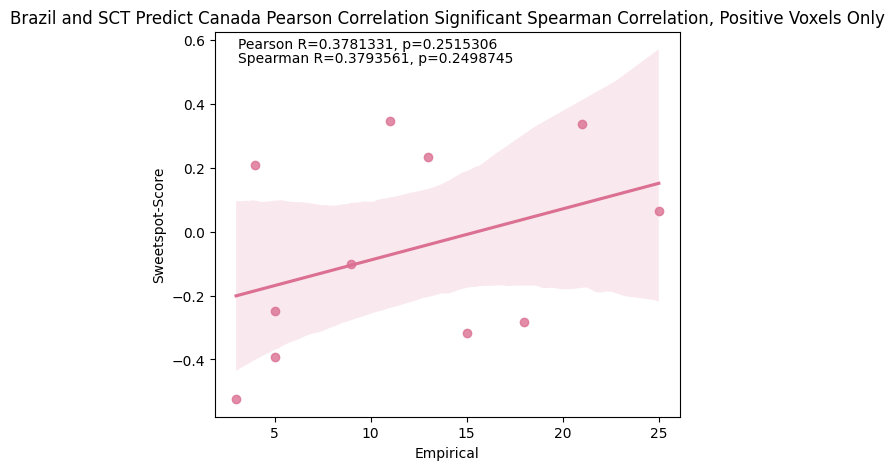

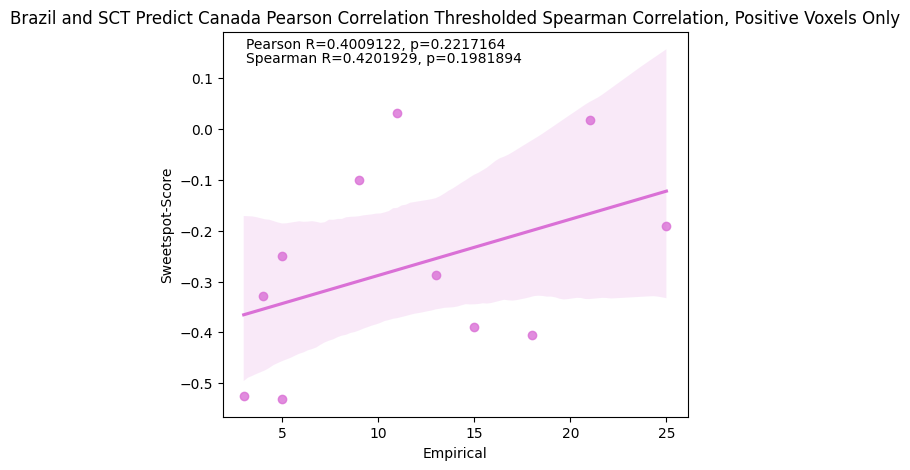

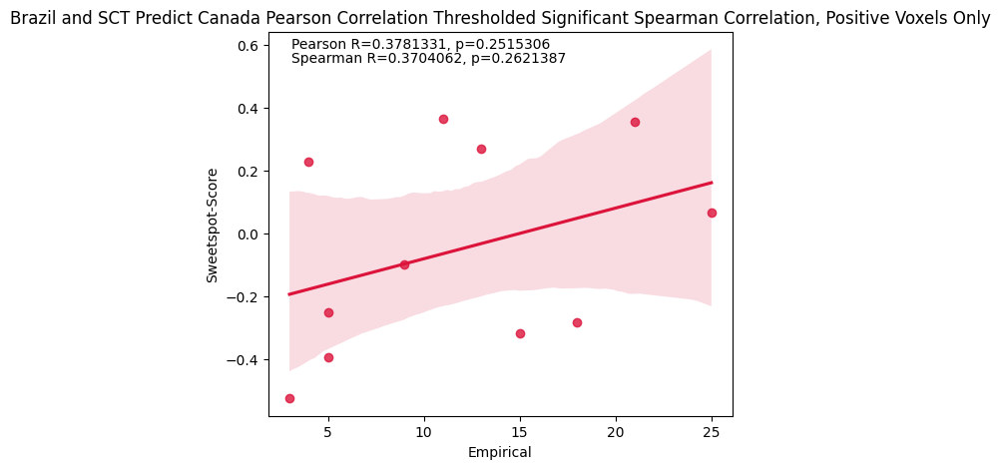

In [41]:
#spearman analysis for brazil and sct predict canada, absolute, all voxels, positive voxels only
def plot_spearman_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_spearman_analysis(canada_df, spearman_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation Spearman Correlation, All Voxels', spearman_r_val, spearman_p_val, p_spearman_r_val, p_spearman_p_val, 'pink','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/absolute/spearman_all.png')
plot_spearman_analysis(canada_df, sig_spearman_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation Significant Spearman Correlation, All Voxels',sig_spearman_r_val, sig_spearman_p_val, p_sig_spearman_r_val, p_sig_spearman_p_val, 'palevioletred','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/absolute/spearman_sig_all.png')
plot_spearman_analysis(canada_df, thresholded_spearman_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation Thresholded Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_spearman_p_val, p_thresholded_spearman_r_val, p_thresholded_spearman_p_val, 'orchid','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/absolute/spearman_thresholded_all.png')
plot_spearman_analysis(canada_df, thresholded_sig_spearman_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation Thresholded Significant Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_sig_spearman_p_val, p_thresholded_sig_spearman_r_val, p_thresholded_sig_spearman_p_val, 'crimson','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/absolute/spearman_sig_thresholded_all.png')

#positive voxels
plot_spearman_analysis(canada_df, pos_spearman_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation Spearman Correlation, Positive Voxels Only', pos_spearman_r_val, pos_spearman_p_val, pos_p_spearman_r_val, pos_p_spearman_p_val, 'pink','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/absolute/spearman_pos.png')
plot_spearman_analysis(canada_df, pos_sig_spearman_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation Significant Spearman Correlation, Positive Voxels Only',pos_sig_spearman_r_val, pos_sig_spearman_p_val, pos_p_sig_spearman_r_val, pos_p_sig_spearman_p_val, 'palevioletred','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/absolute/spearman_sig_pos.png')
plot_spearman_analysis(canada_df, pos_thresholded_spearman_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation Thresholded Spearman Correlation, Positive Voxels Only',pos_thresholded_spearman_r_val, pos_thresholded_spearman_p_val, pos_p_thresholded_spearman_r_val, pos_p_thresholded_spearman_p_val, 'orchid','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/absolute/spearman_thresholded_pos.png')
plot_spearman_analysis(canada_df, pos_thresholded_sig_spearman_sweetspot_corr, 'Brazil and SCT Predict Canada Pearson Correlation Thresholded Significant Spearman Correlation, Positive Voxels Only',pos_thresholded_sig_spearman_r_val, pos_thresholded_sig_spearman_p_val, pos_p_thresholded_sig_spearman_r_val, pos_p_thresholded_sig_spearman_p_val, 'crimson','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil&sct predict canada/absolute/spearman_sig_thresholded_pos.png')

# Canada Predicts Brazil and SCT

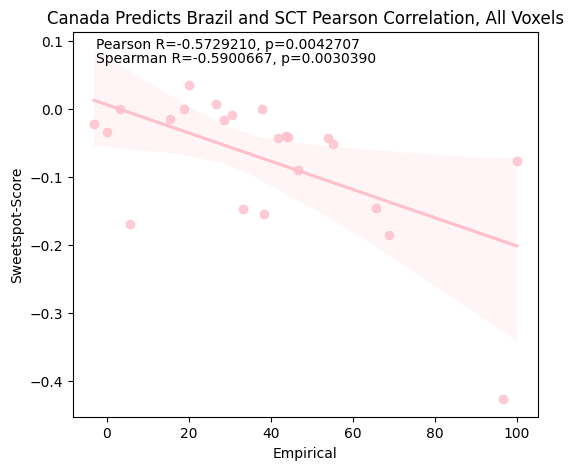

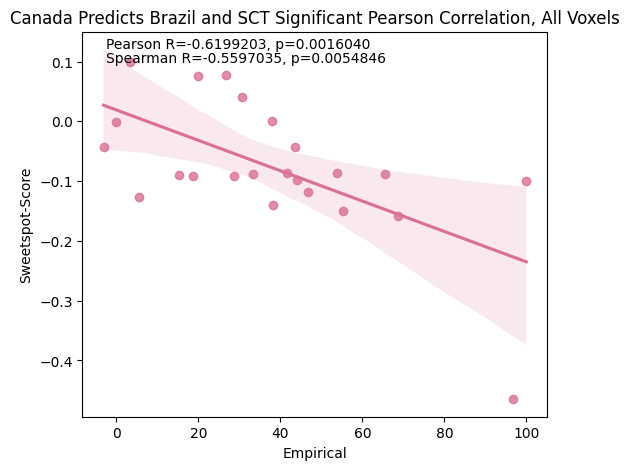

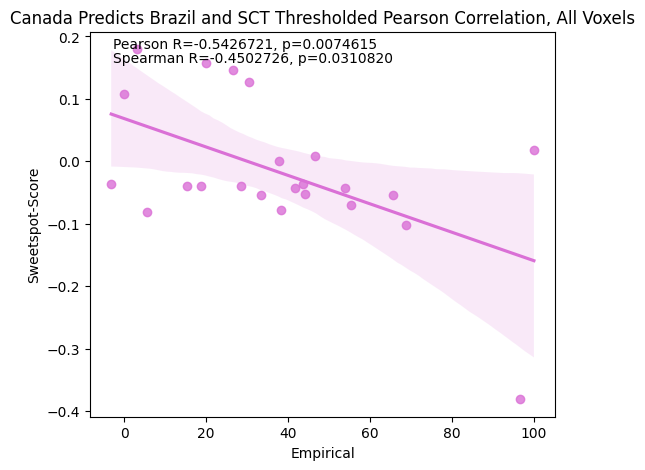

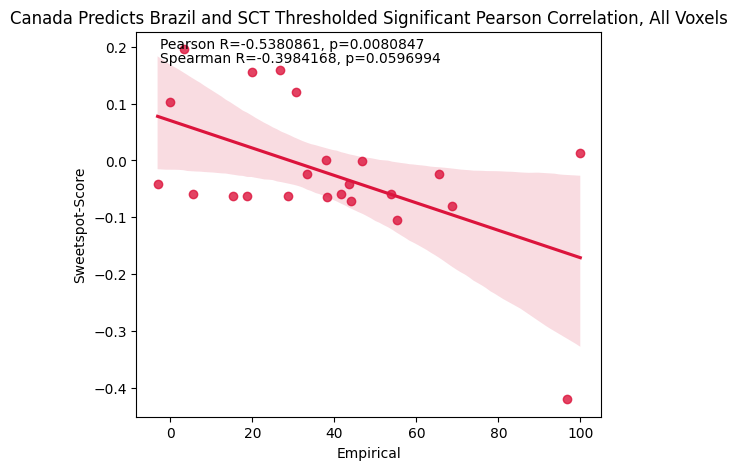

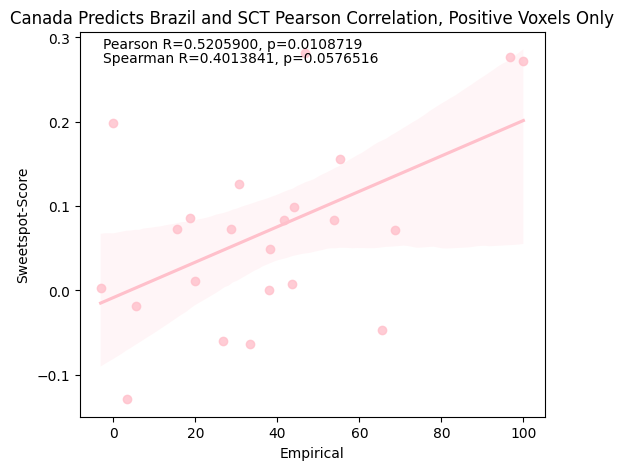

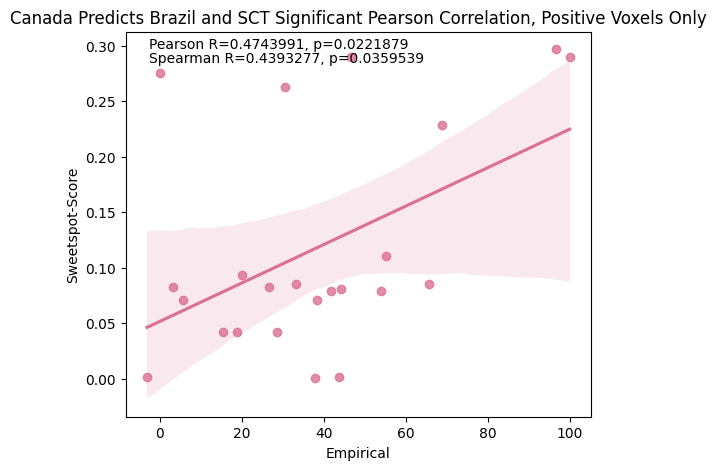

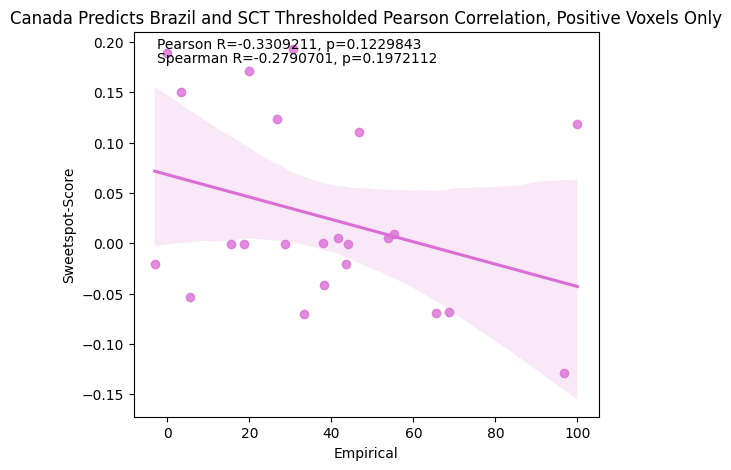

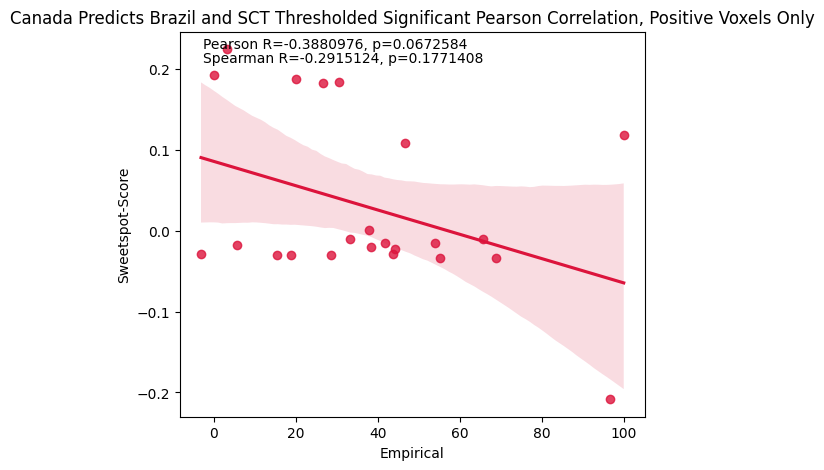

In [26]:
#pearson analysis for canada predicts brazil and sct, relative, all voxels and positive voxels only
def plot_pearson_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color, save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_pearson_analysis(brazil_sct_df, pearson_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation, All Voxels', pearson_r_val, pearson_p_val, s_pearson_r_val, s_pearson_p_val, 'pink','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/relative/pearson_all.png')
plot_pearson_analysis(brazil_sct_df, sig_pearson_sweetspot_corr, 'Canada Predicts Brazil and SCT Significant Pearson Correlation, All Voxels',sig_pearson_r_val, sig_pearson_p_val, s_sig_pearson_r_val, s_sig_pearson_p_val, 'palevioletred','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/relative/pearson_sig_all.png')
plot_pearson_analysis(brazil_sct_df, thresholded_pearson_sweetspot_corr, 'Canada Predicts Brazil and SCT Thresholded Pearson Correlation, All Voxels',thresholded_pearson_r_val, thresholded_pearson_p_val, s_thresholded_pearson_r_val, s_thresholded_pearson_p_val, 'orchid','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/relative/pearson_thresholded_all.png')
plot_pearson_analysis(brazil_sct_df, thresholded_sig_pearson_sweetspot_corr, 'Canada Predicts Brazil and SCT Thresholded Significant Pearson Correlation, All Voxels',thresholded_sig_pearson_r_val, thresholded_sig_pearson_p_val, s_thresholded_sig_pearson_r_val, s_thresholded_sig_pearson_p_val, 'crimson','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/relative/pearson_sig_thresholded_all.png')

#positive only
plot_pearson_analysis(brazil_sct_df, pos_pearson_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation, Positive Voxels Only', pos_pearson_r_val, pos_pearson_p_val, pos_s_pearson_r_val, pos_s_pearson_p_val, 'pink','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/relative/pearson_pos.png')
plot_pearson_analysis(brazil_sct_df, pos_sig_pearson_sweetspot_corr, 'Canada Predicts Brazil and SCT Significant Pearson Correlation, Positive Voxels Only',pos_sig_pearson_r_val, pos_sig_pearson_p_val, pos_s_sig_pearson_r_val, pos_s_sig_pearson_p_val, 'palevioletred','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/relative/pearson_sig_pos.png')
plot_pearson_analysis(brazil_sct_df, pos_thresholded_pearson_sweetspot_corr, 'Canada Predicts Brazil and SCT Thresholded Pearson Correlation, Positive Voxels Only',pos_thresholded_pearson_r_val, pos_thresholded_pearson_p_val, pos_s_thresholded_pearson_r_val, pos_s_thresholded_pearson_p_val, 'orchid','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/relative/pearson_thresholded_pos.png')
plot_pearson_analysis(brazil_sct_df, pos_thresholded_sig_pearson_sweetspot_corr, 'Canada Predicts Brazil and SCT Thresholded Significant Pearson Correlation, Positive Voxels Only',pos_thresholded_sig_pearson_r_val, pos_thresholded_sig_pearson_p_val, pos_s_thresholded_sig_pearson_r_val, pos_s_thresholded_sig_pearson_p_val, 'crimson','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/relative/pearson_sig_thresholded_pos.png')

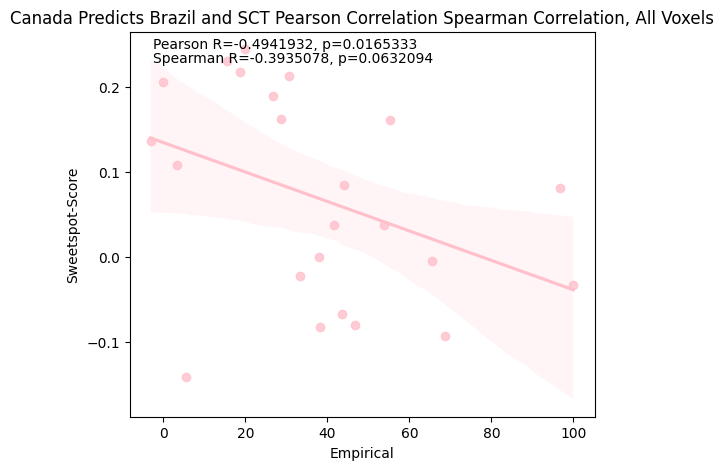

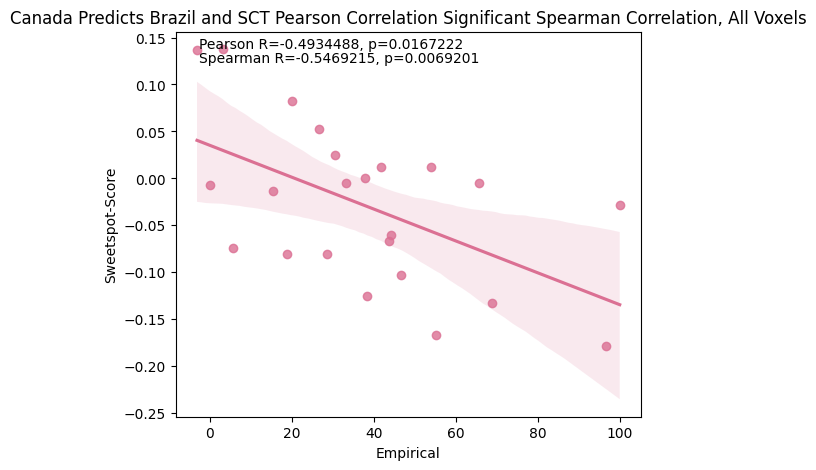

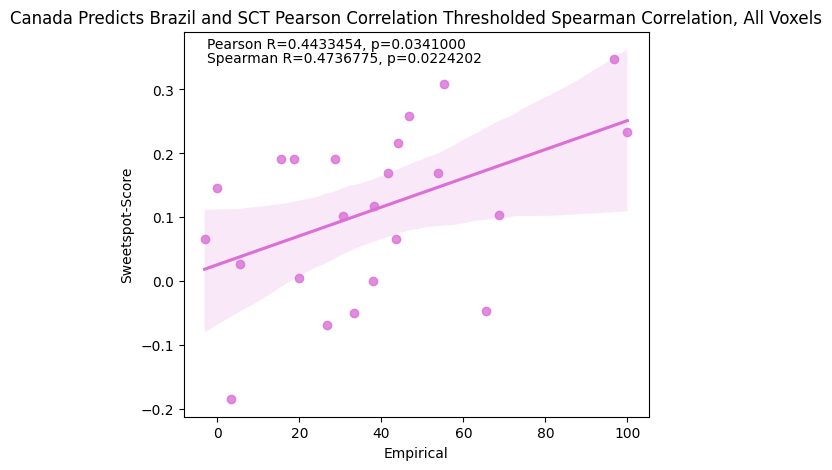

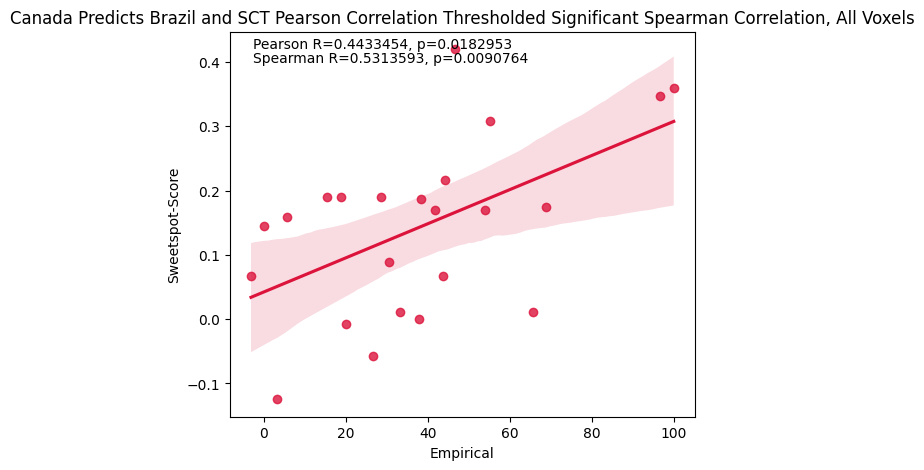

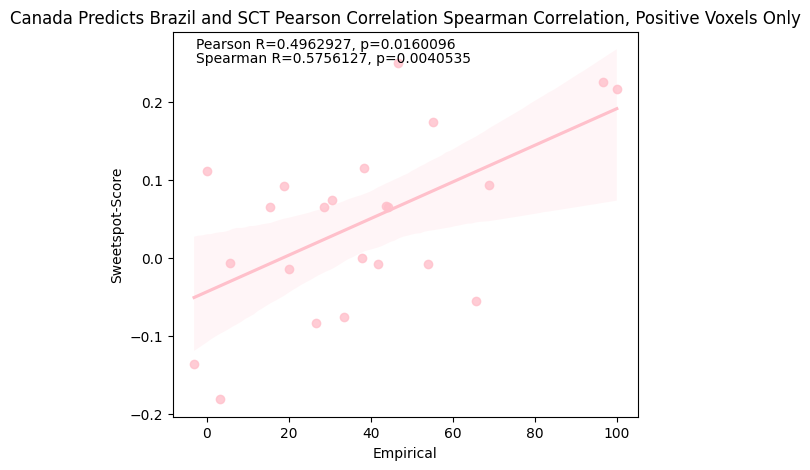

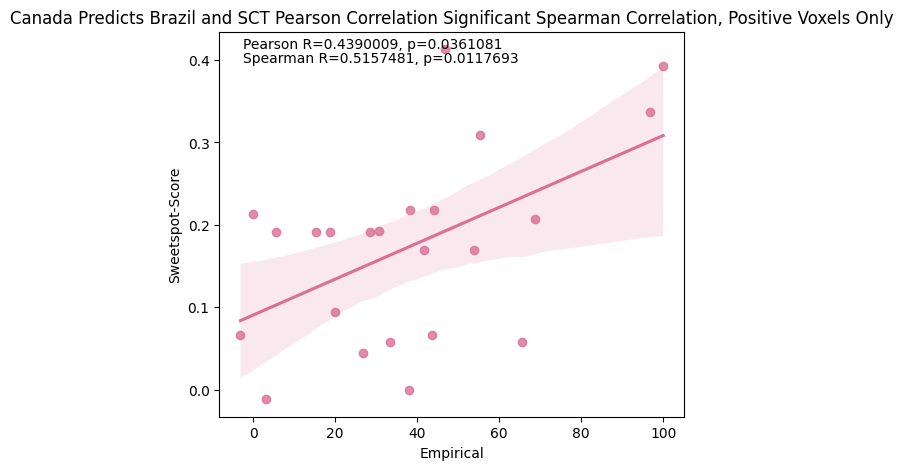

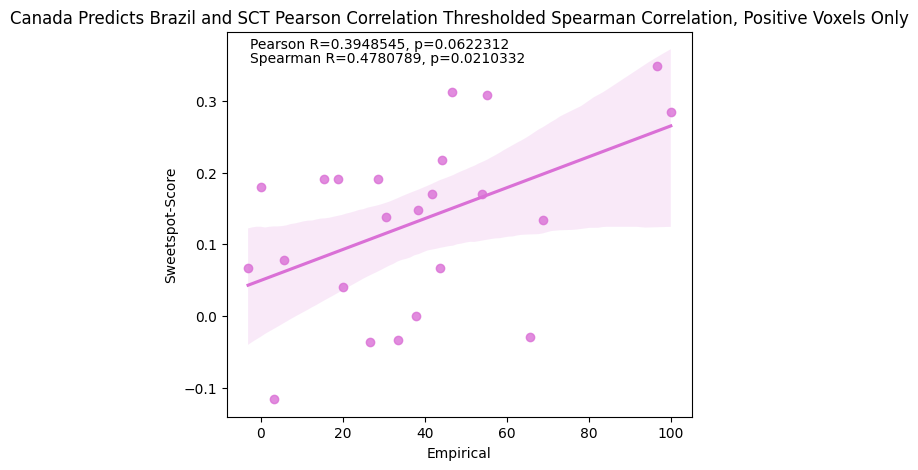

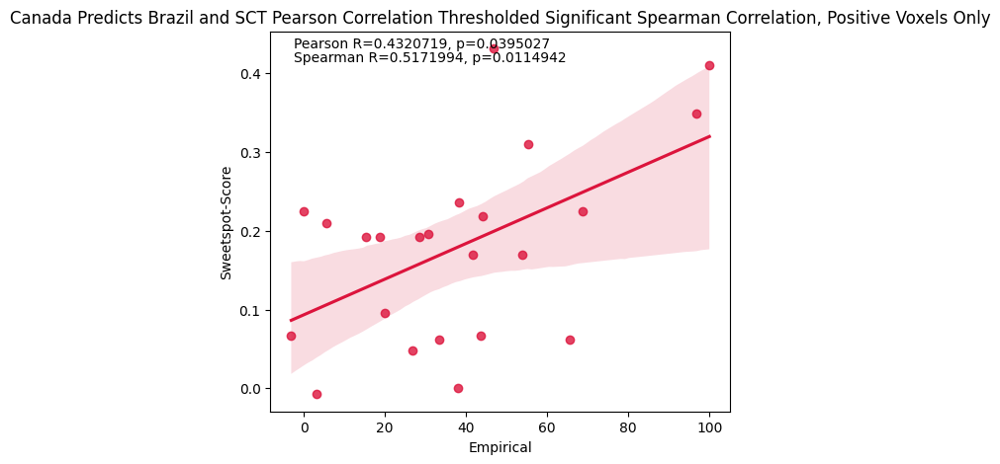

In [27]:
#spearman analysis for canada predicts brazil and sct, relative, all voxels, positive voxels only
def plot_spearman_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_spearman_analysis(brazil_sct_df, spearman_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation Spearman Correlation, All Voxels', spearman_r_val, spearman_p_val, p_spearman_r_val, p_spearman_p_val, 'pink','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/relative/spearman_all.png')
plot_spearman_analysis(brazil_sct_df, sig_spearman_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation Significant Spearman Correlation, All Voxels',sig_spearman_r_val, sig_spearman_p_val, p_sig_spearman_r_val, p_sig_spearman_p_val, 'palevioletred','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/relative/spearman_sig_all.png')
plot_spearman_analysis(brazil_sct_df, thresholded_spearman_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation Thresholded Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_spearman_p_val, p_thresholded_spearman_r_val, p_thresholded_spearman_p_val, 'orchid','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/relative/spearman_thresholded_all.png')
plot_spearman_analysis(brazil_sct_df, thresholded_sig_spearman_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation Thresholded Significant Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_sig_spearman_p_val, p_thresholded_sig_spearman_r_val, p_thresholded_sig_spearman_p_val, 'crimson','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/relative/spearman_sig_thresholded_all.png')

#positive voxels
plot_spearman_analysis(brazil_sct_df, pos_spearman_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation Spearman Correlation, Positive Voxels Only', pos_spearman_r_val, pos_spearman_p_val, pos_p_spearman_r_val, pos_p_spearman_p_val, 'pink','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/relative/spearman_pos.png')
plot_spearman_analysis(brazil_sct_df, pos_sig_spearman_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation Significant Spearman Correlation, Positive Voxels Only',pos_sig_spearman_r_val, pos_sig_spearman_p_val, pos_p_sig_spearman_r_val, pos_p_sig_spearman_p_val, 'palevioletred','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/relative/spearman_sig_pos.png')
plot_spearman_analysis(brazil_sct_df, pos_thresholded_spearman_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation Thresholded Spearman Correlation, Positive Voxels Only',pos_thresholded_spearman_r_val, pos_thresholded_spearman_p_val, pos_p_thresholded_spearman_r_val, pos_p_thresholded_spearman_p_val, 'orchid','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/relative/spearman_thresholded_pos.png')
plot_spearman_analysis(brazil_sct_df, pos_thresholded_sig_spearman_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation Thresholded Significant Spearman Correlation, Positive Voxels Only',pos_thresholded_sig_spearman_r_val, pos_thresholded_sig_spearman_p_val, pos_p_thresholded_sig_spearman_r_val, pos_p_thresholded_sig_spearman_p_val, 'crimson','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/relative/spearman_sig_thresholded_pos.png')

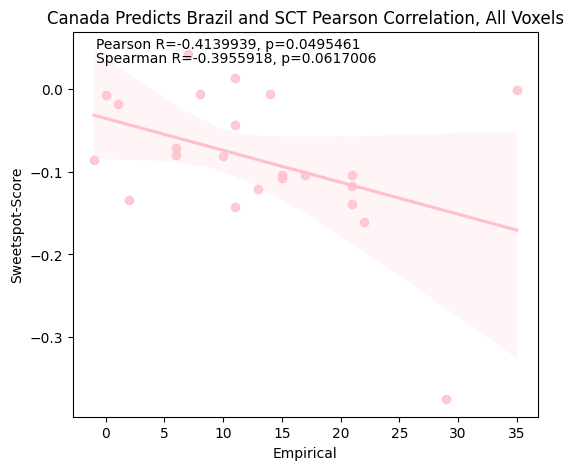

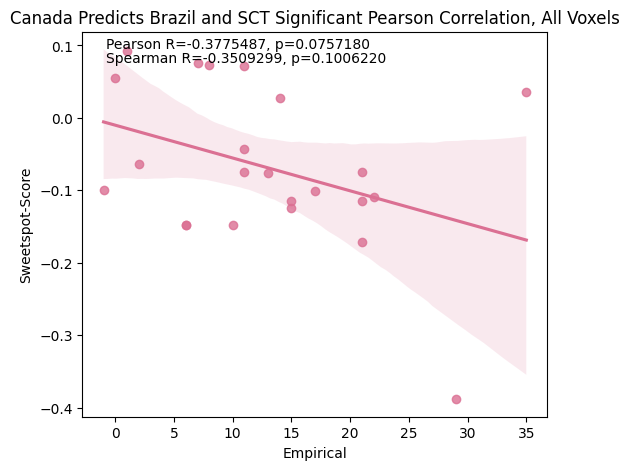

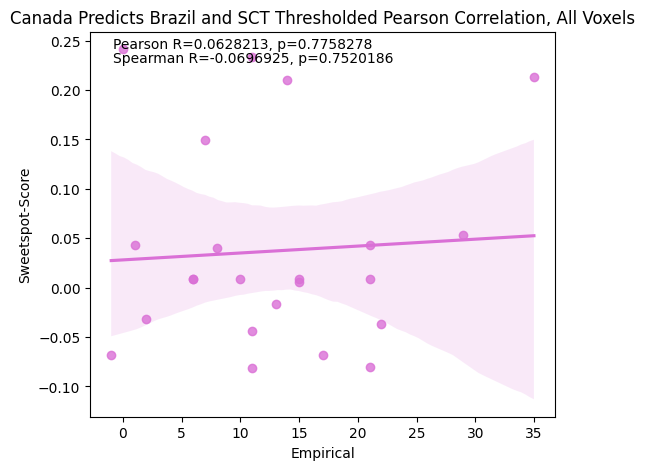

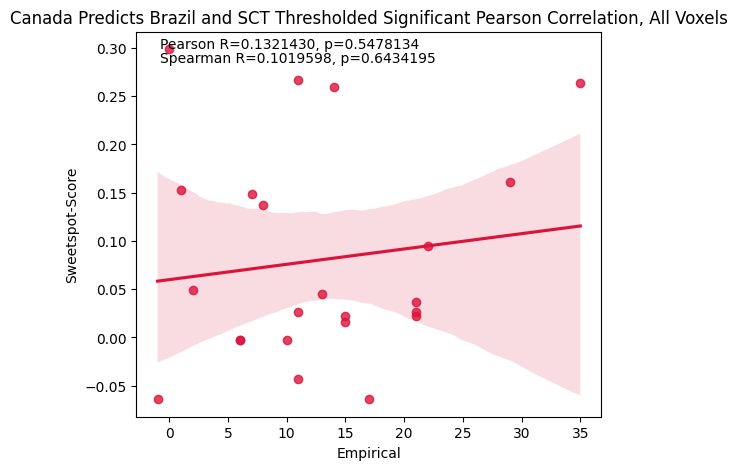

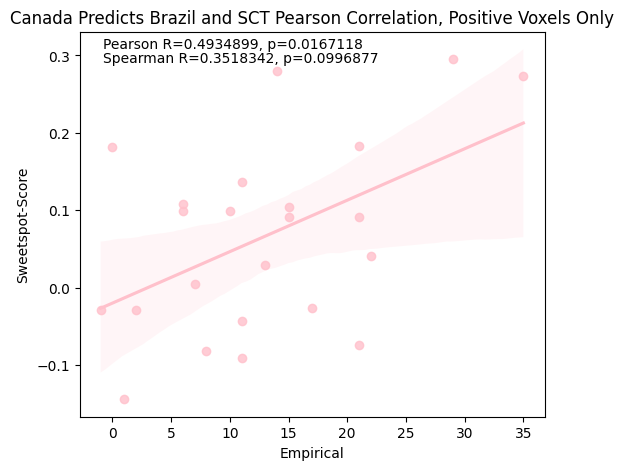

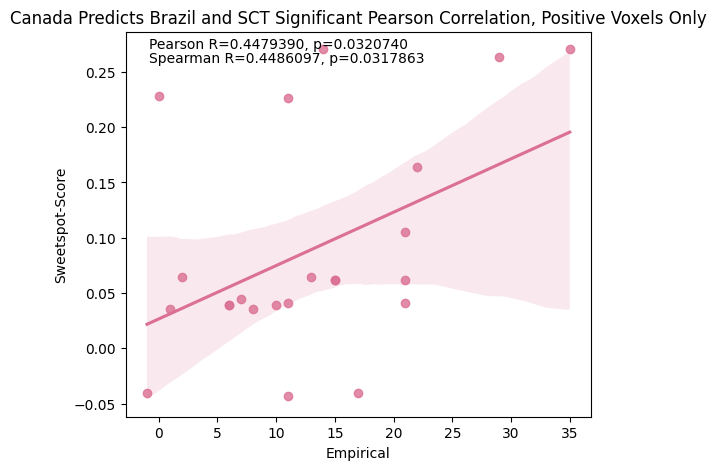

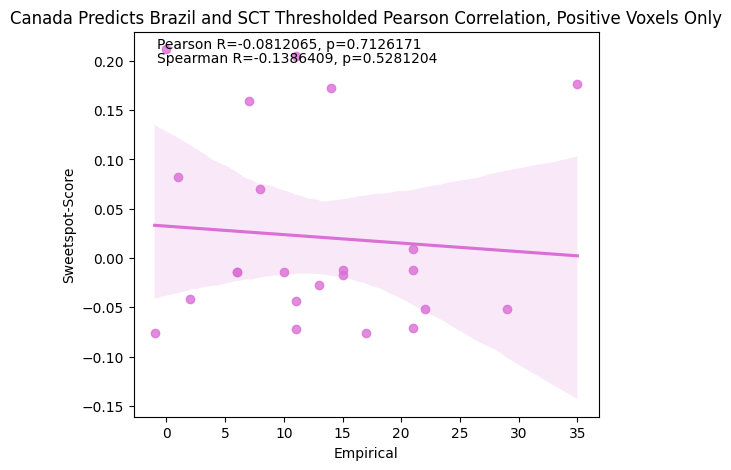

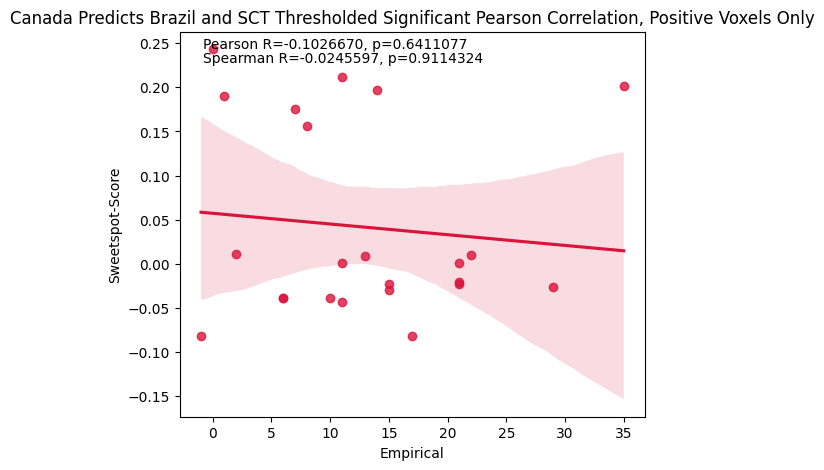

In [21]:
#pearson analysis for canada predicts brazil and sct, absolute, all voxels and positive voxels only
def plot_pearson_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color, save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_pearson_analysis(brazil_sct_df, pearson_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation, All Voxels', pearson_r_val, pearson_p_val, s_pearson_r_val, s_pearson_p_val, 'pink','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/absolute/pearson_all.png')
plot_pearson_analysis(brazil_sct_df, sig_pearson_sweetspot_corr, 'Canada Predicts Brazil and SCT Significant Pearson Correlation, All Voxels',sig_pearson_r_val, sig_pearson_p_val, s_sig_pearson_r_val, s_sig_pearson_p_val, 'palevioletred','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/absolute/pearson_sig_all.png')
plot_pearson_analysis(brazil_sct_df, thresholded_pearson_sweetspot_corr, 'Canada Predicts Brazil and SCT Thresholded Pearson Correlation, All Voxels',thresholded_pearson_r_val, thresholded_pearson_p_val, s_thresholded_pearson_r_val, s_thresholded_pearson_p_val, 'orchid','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/absolute/pearson_thresholded_all.png')
plot_pearson_analysis(brazil_sct_df, thresholded_sig_pearson_sweetspot_corr, 'Canada Predicts Brazil and SCT Thresholded Significant Pearson Correlation, All Voxels',thresholded_sig_pearson_r_val, thresholded_sig_pearson_p_val, s_thresholded_sig_pearson_r_val, s_thresholded_sig_pearson_p_val, 'crimson','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/absolute/pearson_sig_thresholded_all.png')

#positive only
plot_pearson_analysis(brazil_sct_df, pos_pearson_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation, Positive Voxels Only', pos_pearson_r_val, pos_pearson_p_val, pos_s_pearson_r_val, pos_s_pearson_p_val, 'pink','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/absolute/pearson_pos.png')
plot_pearson_analysis(brazil_sct_df, pos_sig_pearson_sweetspot_corr, 'Canada Predicts Brazil and SCT Significant Pearson Correlation, Positive Voxels Only',pos_sig_pearson_r_val, pos_sig_pearson_p_val, pos_s_sig_pearson_r_val, pos_s_sig_pearson_p_val, 'palevioletred','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/absolute/pearson_sig_pos.png')
plot_pearson_analysis(brazil_sct_df, pos_thresholded_pearson_sweetspot_corr, 'Canada Predicts Brazil and SCT Thresholded Pearson Correlation, Positive Voxels Only',pos_thresholded_pearson_r_val, pos_thresholded_pearson_p_val, pos_s_thresholded_pearson_r_val, pos_s_thresholded_pearson_p_val, 'orchid','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/absolute/pearson_thresholded_pos.png')
plot_pearson_analysis(brazil_sct_df, pos_thresholded_sig_pearson_sweetspot_corr, 'Canada Predicts Brazil and SCT Thresholded Significant Pearson Correlation, Positive Voxels Only',pos_thresholded_sig_pearson_r_val, pos_thresholded_sig_pearson_p_val, pos_s_thresholded_sig_pearson_r_val, pos_s_thresholded_sig_pearson_p_val, 'crimson','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/absolute/pearson_sig_thresholded_pos.png')

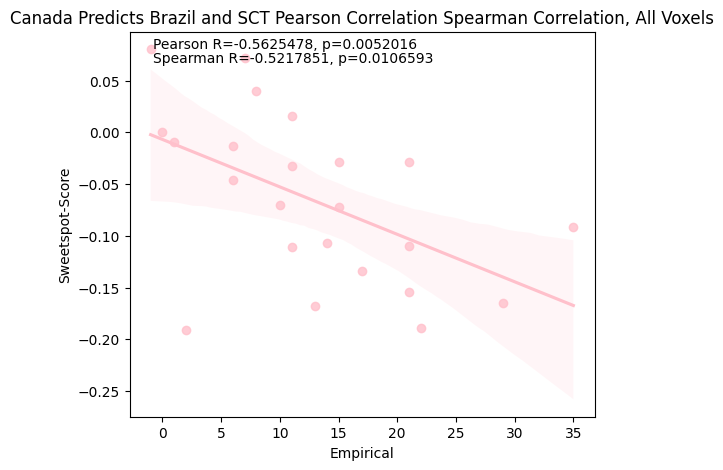

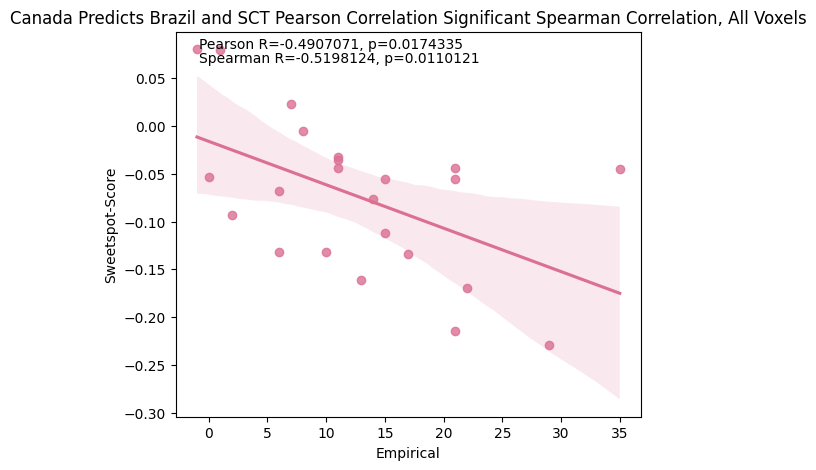

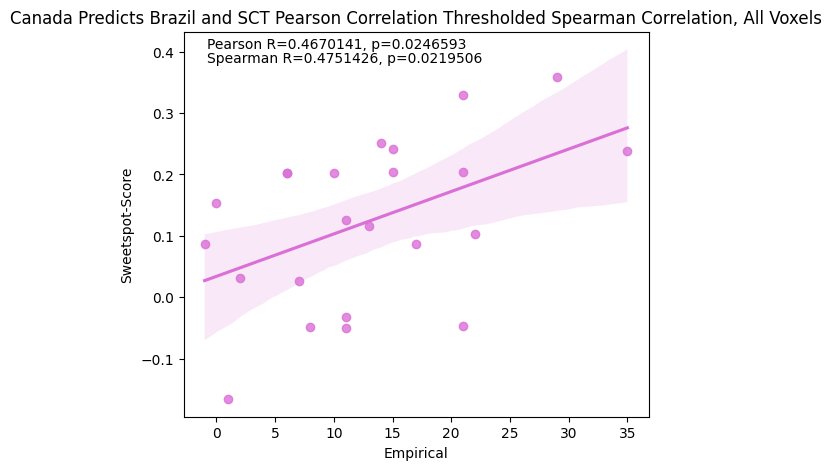

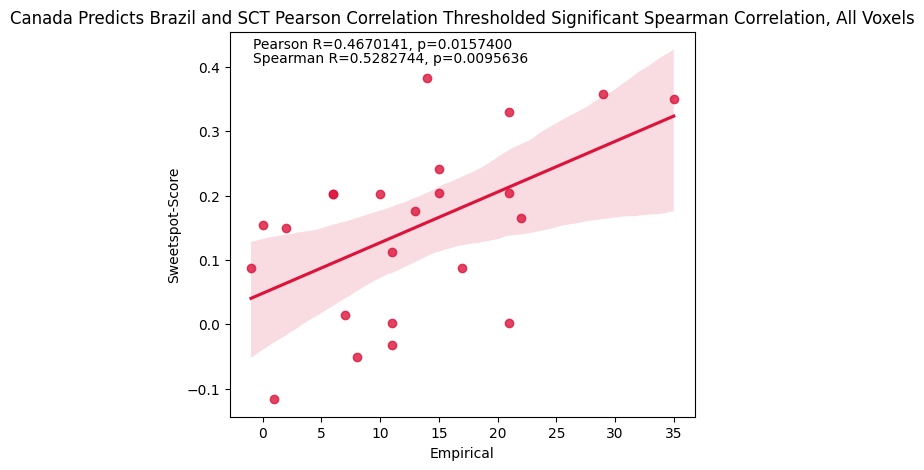

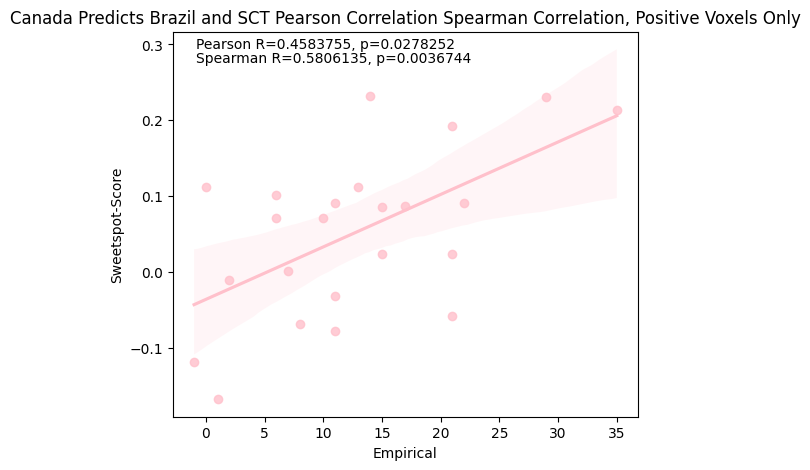

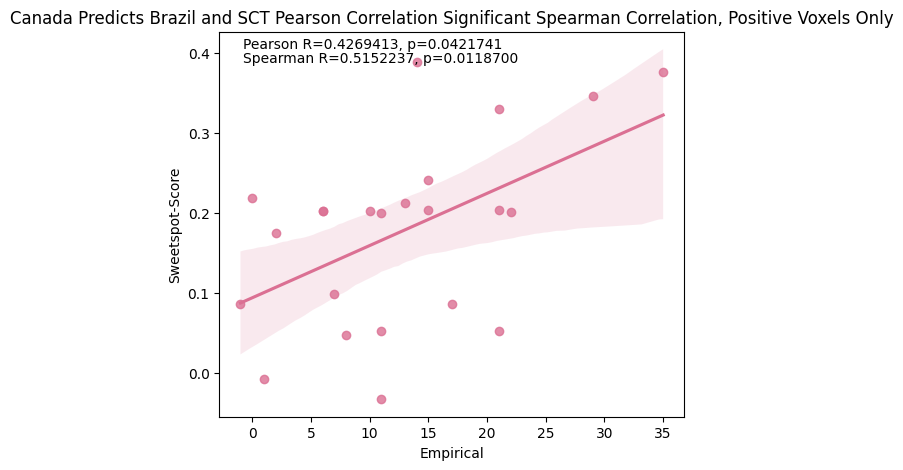

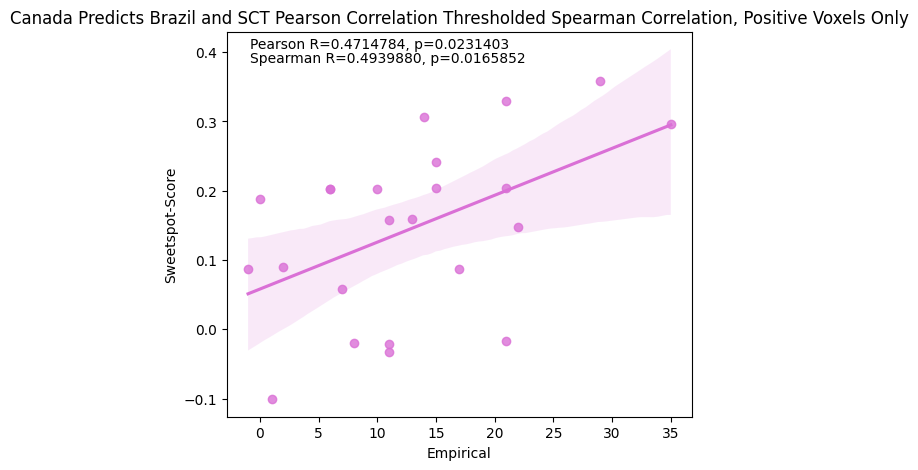

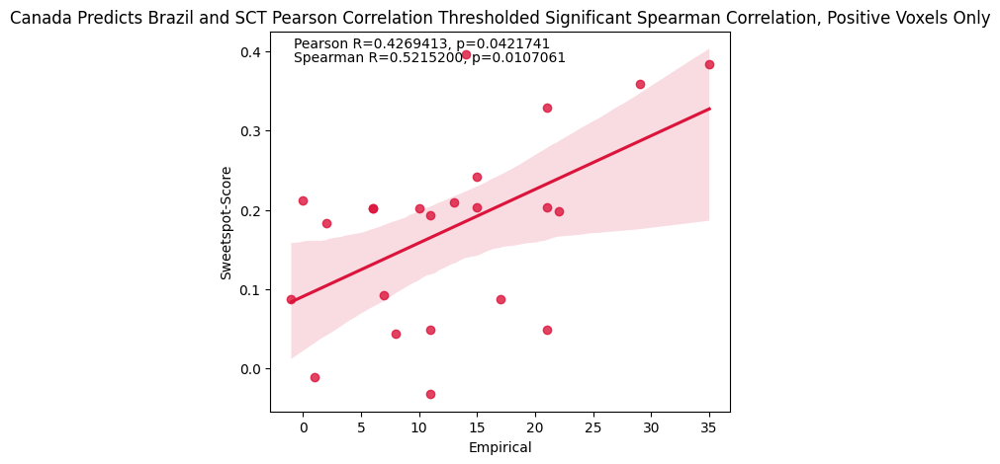

In [22]:
#spearman analysis for canada predicts brazil and sct, absolute, all voxels, positive voxels only
def plot_spearman_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_spearman_analysis(brazil_sct_df, spearman_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation Spearman Correlation, All Voxels', spearman_r_val, spearman_p_val, p_spearman_r_val, p_spearman_p_val, 'pink','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/absolute/spearman_all.png')
plot_spearman_analysis(brazil_sct_df, sig_spearman_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation Significant Spearman Correlation, All Voxels',sig_spearman_r_val, sig_spearman_p_val, p_sig_spearman_r_val, p_sig_spearman_p_val, 'palevioletred','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/absolute/spearman_sig_all.png')
plot_spearman_analysis(brazil_sct_df, thresholded_spearman_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation Thresholded Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_spearman_p_val, p_thresholded_spearman_r_val, p_thresholded_spearman_p_val, 'orchid','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/absolute/spearman_thresholded_all.png')
plot_spearman_analysis(brazil_sct_df, thresholded_sig_spearman_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation Thresholded Significant Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_sig_spearman_p_val, p_thresholded_sig_spearman_r_val, p_thresholded_sig_spearman_p_val, 'crimson','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/absolute/spearman_sig_thresholded_all.png')

#positive voxels
plot_spearman_analysis(brazil_sct_df, pos_spearman_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation Spearman Correlation, Positive Voxels Only', pos_spearman_r_val, pos_spearman_p_val, pos_p_spearman_r_val, pos_p_spearman_p_val, 'pink','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/absolute/spearman_pos.png')
plot_spearman_analysis(brazil_sct_df, pos_sig_spearman_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation Significant Spearman Correlation, Positive Voxels Only',pos_sig_spearman_r_val, pos_sig_spearman_p_val, pos_p_sig_spearman_r_val, pos_p_sig_spearman_p_val, 'palevioletred','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/absolute/spearman_sig_pos.png')
plot_spearman_analysis(brazil_sct_df, pos_thresholded_spearman_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation Thresholded Spearman Correlation, Positive Voxels Only',pos_thresholded_spearman_r_val, pos_thresholded_spearman_p_val, pos_p_thresholded_spearman_r_val, pos_p_thresholded_spearman_p_val, 'orchid','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/absolute/spearman_thresholded_pos.png')
plot_spearman_analysis(brazil_sct_df, pos_thresholded_sig_spearman_sweetspot_corr, 'Canada Predicts Brazil and SCT Pearson Correlation Thresholded Significant Spearman Correlation, Positive Voxels Only',pos_thresholded_sig_spearman_r_val, pos_thresholded_sig_spearman_p_val, pos_p_thresholded_sig_spearman_r_val, pos_p_thresholded_sig_spearman_p_val, 'crimson','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada predicts brazil&sct/absolute/spearman_sig_thresholded_pos.png')

# Canada and SCT Predict Brazil

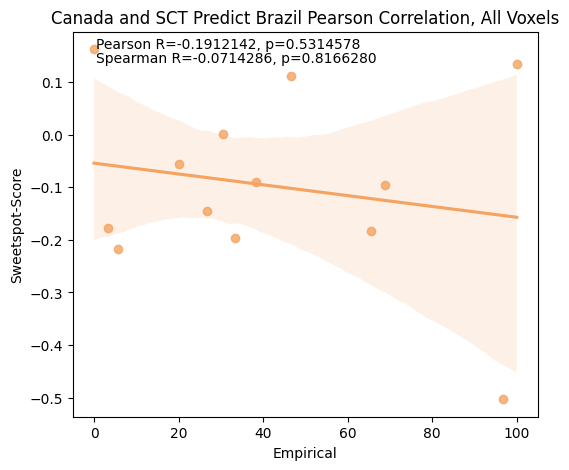

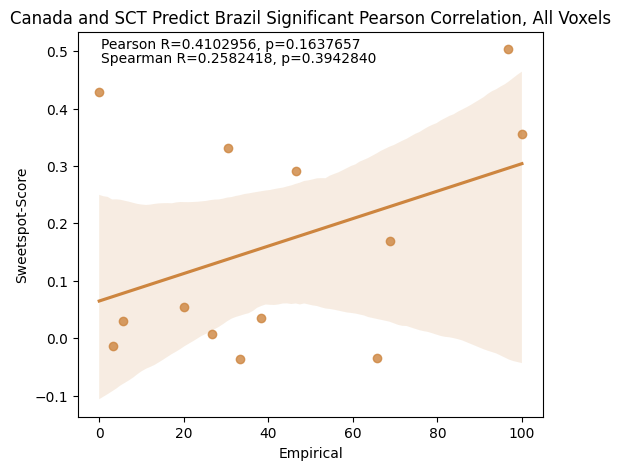

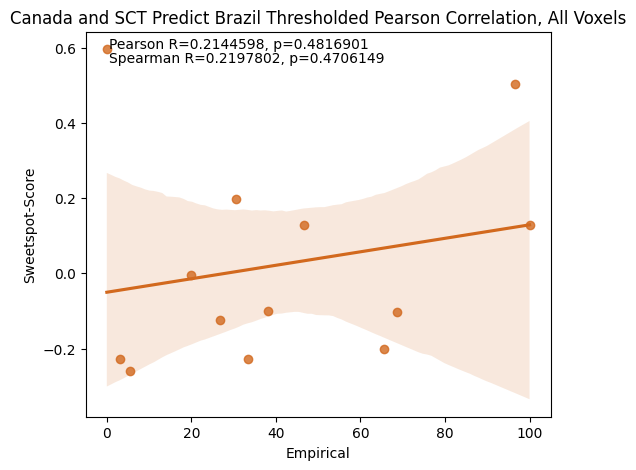

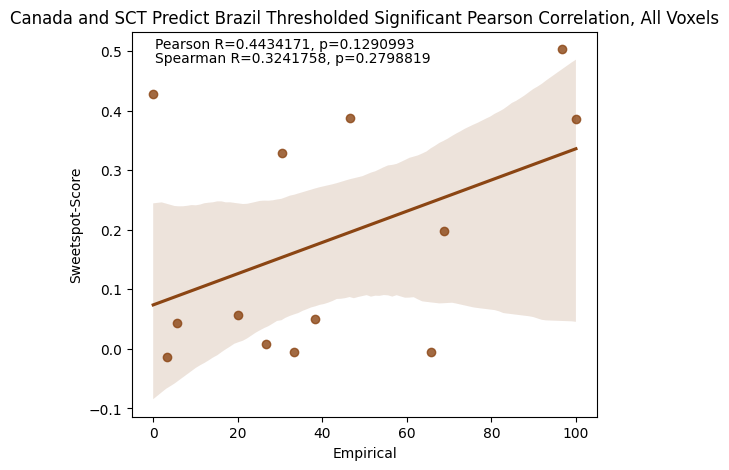

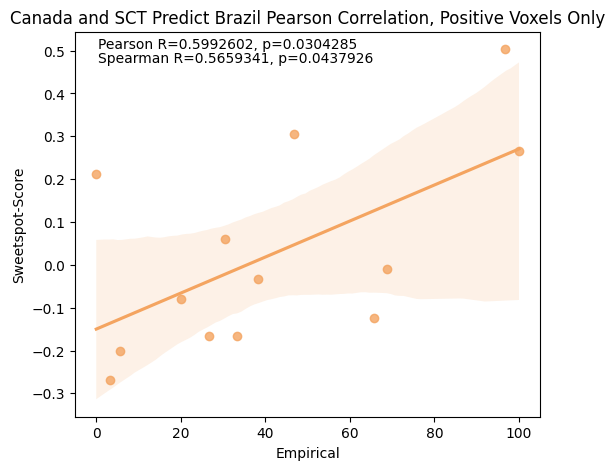

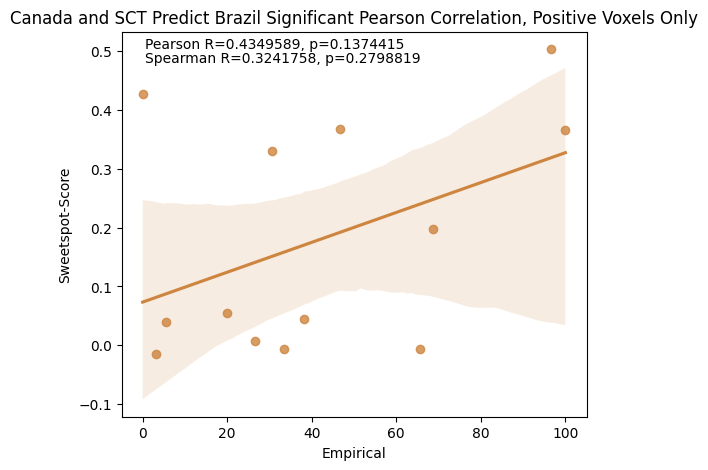

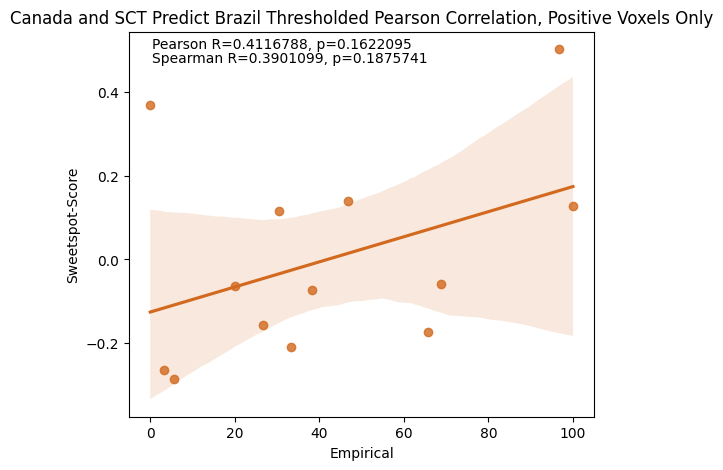

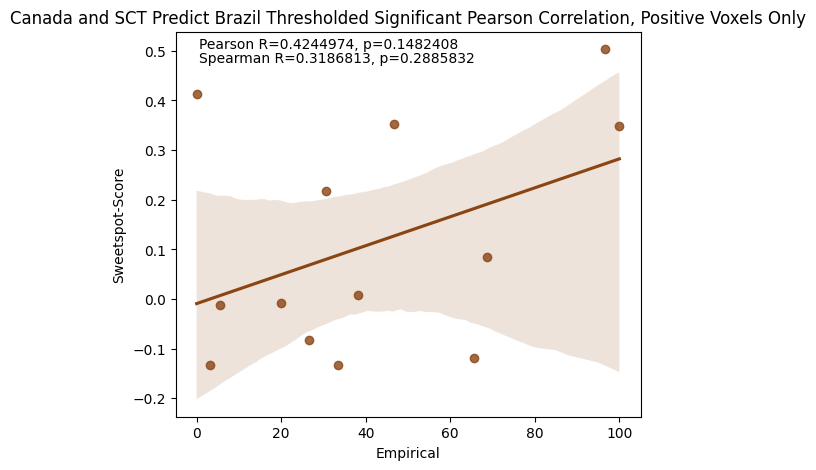

In [245]:
#pearson analysis for canada and sct predict brazil, relative, all voxels and positive voxels only
def plot_pearson_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color, save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_pearson_analysis(brazil_df, pearson_sweetspot_corr, 'Canada and SCT Predict Brazil Pearson Correlation, All Voxels', pearson_r_val, pearson_p_val, s_pearson_r_val, s_pearson_p_val, 'sandybrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/pearson_all.png')
plot_pearson_analysis(brazil_df, sig_pearson_sweetspot_corr, 'Canada and SCT Predict Brazil Significant Pearson Correlation, All Voxels',sig_pearson_r_val, sig_pearson_p_val, s_sig_pearson_r_val, s_sig_pearson_p_val, 'peru','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/pearson_sig_all.png')
plot_pearson_analysis(brazil_df, thresholded_pearson_sweetspot_corr, 'Canada and SCT Predict Brazil Thresholded Pearson Correlation, All Voxels',thresholded_pearson_r_val, thresholded_pearson_p_val, s_thresholded_pearson_r_val, s_thresholded_pearson_p_val, 'chocolate','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/pearson_thresholded_all.png')
plot_pearson_analysis(brazil_df, thresholded_sig_pearson_sweetspot_corr, 'Canada and SCT Predict Brazil Thresholded Significant Pearson Correlation, All Voxels',thresholded_sig_pearson_r_val, thresholded_sig_pearson_p_val, s_thresholded_sig_pearson_r_val, s_thresholded_sig_pearson_p_val, 'saddlebrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/pearson_sig_thresholded_all.png')

#positive only
plot_pearson_analysis(brazil_df, pos_pearson_sweetspot_corr, 'Canada and SCT Predict Brazil Pearson Correlation, Positive Voxels Only', pos_pearson_r_val, pos_pearson_p_val, pos_s_pearson_r_val, pos_s_pearson_p_val, 'sandybrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/pearson_pos.png')
plot_pearson_analysis(brazil_df, pos_sig_pearson_sweetspot_corr, 'Canada and SCT Predict Brazil Significant Pearson Correlation, Positive Voxels Only',pos_sig_pearson_r_val, pos_sig_pearson_p_val, pos_s_sig_pearson_r_val, pos_s_sig_pearson_p_val, 'peru','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/pearson_sig_pos.png')
plot_pearson_analysis(brazil_df, pos_thresholded_pearson_sweetspot_corr, 'Canada and SCT Predict Brazil Thresholded Pearson Correlation, Positive Voxels Only',pos_thresholded_pearson_r_val, pos_thresholded_pearson_p_val, pos_s_thresholded_pearson_r_val, pos_s_thresholded_pearson_p_val, 'chocolate','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/pearson_thresholded_pos.png')
plot_pearson_analysis(brazil_df, pos_thresholded_sig_pearson_sweetspot_corr, 'Canada and SCT Predict Brazil Thresholded Significant Pearson Correlation, Positive Voxels Only',pos_thresholded_sig_pearson_r_val, pos_thresholded_sig_pearson_p_val, pos_s_thresholded_sig_pearson_r_val, pos_s_thresholded_sig_pearson_p_val, 'saddlebrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/pearson_sig_thresholded_pos.png')

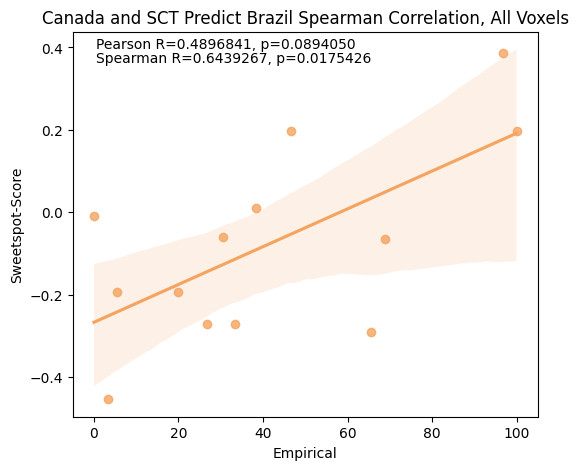

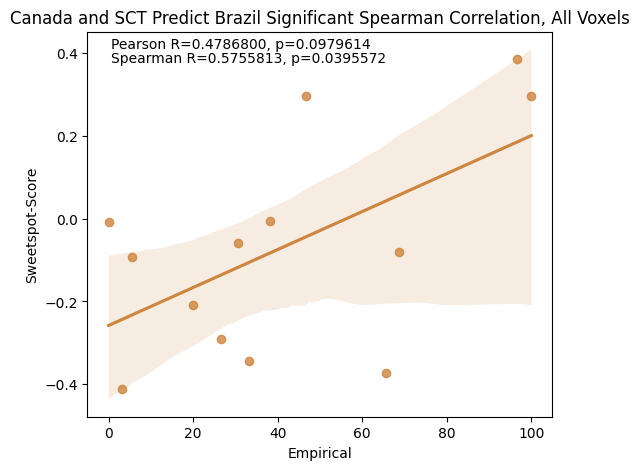

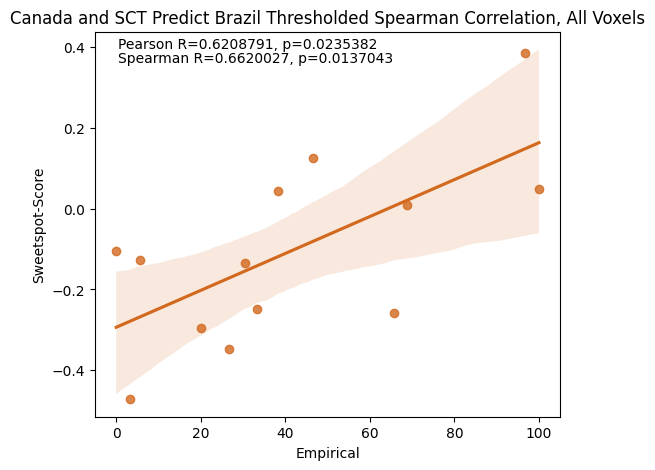

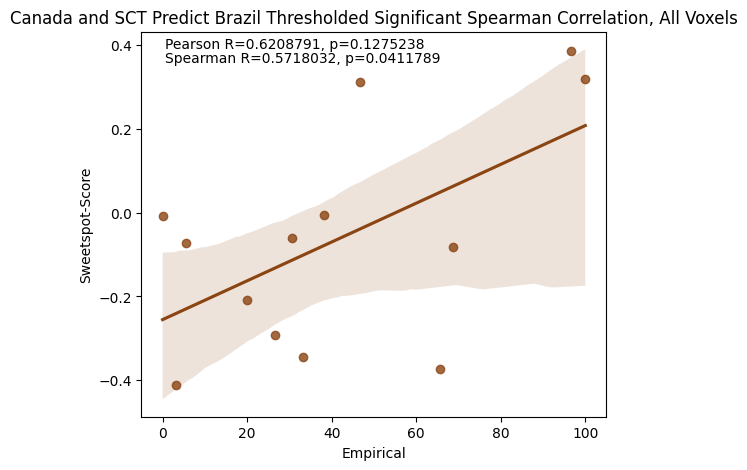

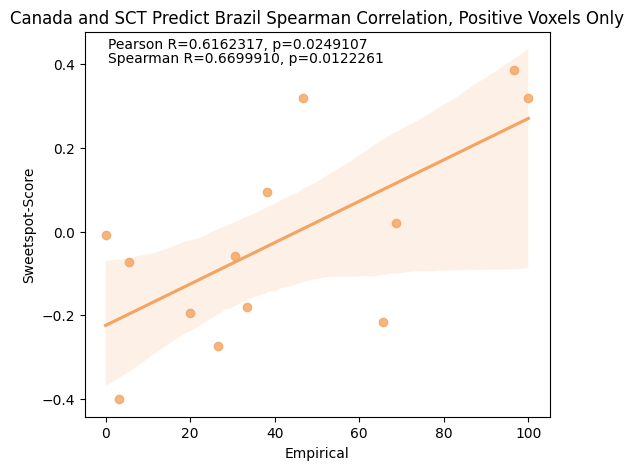

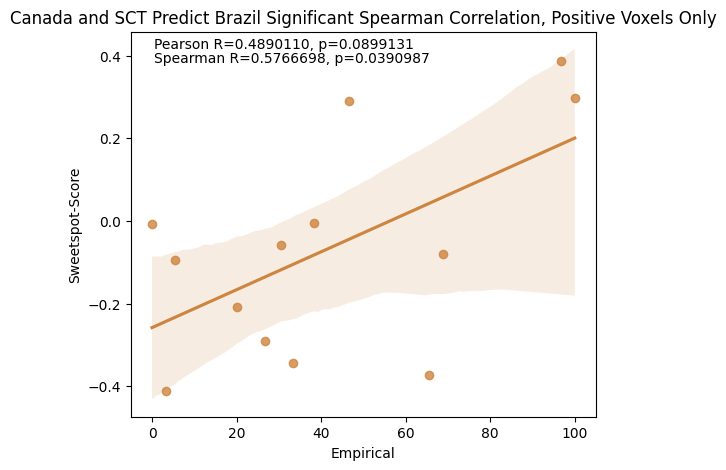

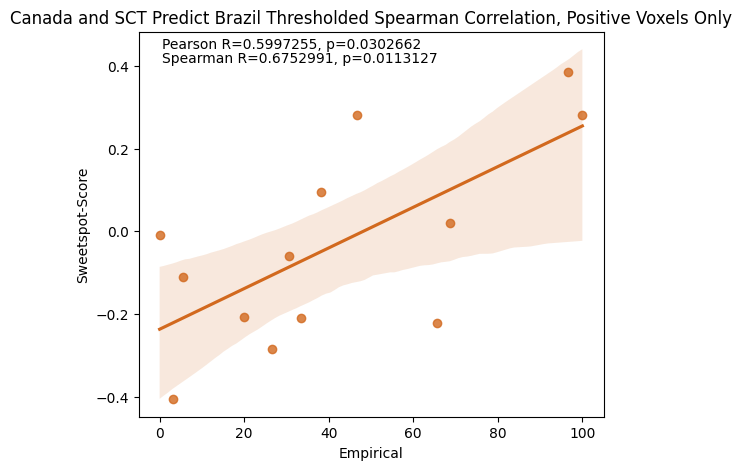

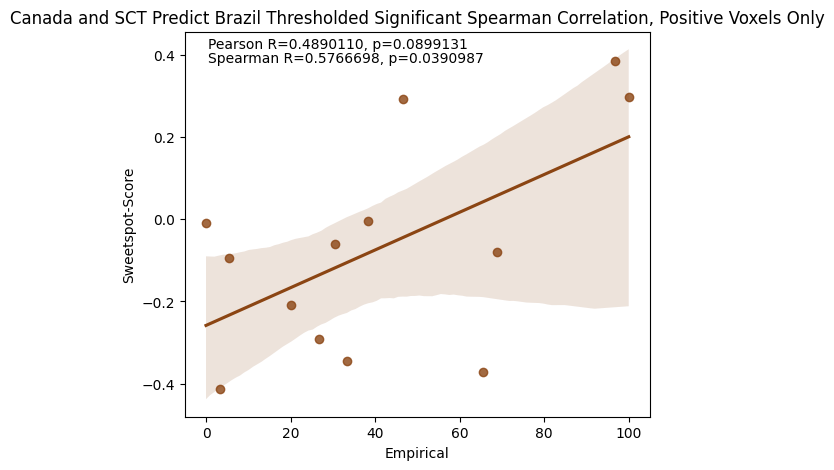

In [247]:
#spearman analysis for canada and sct predict brazil, relative, all voxels, positive voxels only
def plot_spearman_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_spearman_analysis(brazil_df, spearman_sweetspot_corr, 'Canada and SCT Predict Brazil Spearman Correlation, All Voxels', spearman_r_val, spearman_p_val, p_spearman_r_val, p_spearman_p_val, 'sandybrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/spearman_all.png')
plot_spearman_analysis(brazil_df, sig_spearman_sweetspot_corr, 'Canada and SCT Predict Brazil Significant Spearman Correlation, All Voxels',sig_spearman_r_val, sig_spearman_p_val, p_sig_spearman_r_val, p_sig_spearman_p_val, 'peru','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/spearman_sig_all.png')
plot_spearman_analysis(brazil_df, thresholded_spearman_sweetspot_corr, 'Canada and SCT Predict Brazil Thresholded Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_spearman_p_val, p_thresholded_spearman_r_val, p_thresholded_spearman_p_val, 'chocolate','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/spearman_thresholded_all.png')
plot_spearman_analysis(brazil_df, thresholded_sig_spearman_sweetspot_corr, 'Canada and SCT Predict Brazil Thresholded Significant Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_sig_spearman_p_val, p_thresholded_sig_spearman_r_val, p_thresholded_sig_spearman_p_val, 'saddlebrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/spearman_sig_thresholded_all.png')

#positive voxels
plot_spearman_analysis(brazil_df, pos_spearman_sweetspot_corr, 'Canada and SCT Predict Brazil Spearman Correlation, Positive Voxels Only', pos_spearman_r_val, pos_spearman_p_val, pos_p_spearman_r_val, pos_p_spearman_p_val, 'sandybrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/spearman_pos.png')
plot_spearman_analysis(brazil_df, pos_sig_spearman_sweetspot_corr, 'Canada and SCT Predict Brazil Significant Spearman Correlation, Positive Voxels Only',pos_sig_spearman_r_val, pos_sig_spearman_p_val, pos_p_sig_spearman_r_val, pos_p_sig_spearman_p_val, 'peru','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/spearman_sig_pos.png')
plot_spearman_analysis(brazil_df, pos_thresholded_spearman_sweetspot_corr, 'Canada and SCT Predict Brazil Thresholded Spearman Correlation, Positive Voxels Only',pos_thresholded_spearman_r_val, pos_thresholded_spearman_p_val, pos_p_thresholded_spearman_r_val, pos_p_thresholded_spearman_p_val, 'chocolate','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/spearman_thresholded_pos.png')
plot_spearman_analysis(brazil_df, pos_thresholded_sig_spearman_sweetspot_corr, 'Canada and SCT Predict Brazil Thresholded Significant Spearman Correlation, Positive Voxels Only',pos_thresholded_sig_spearman_r_val, pos_thresholded_sig_spearman_p_val, pos_p_thresholded_sig_spearman_r_val, pos_p_thresholded_sig_spearman_p_val, 'saddlebrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/spearman_sig_thresholded_pos.png')

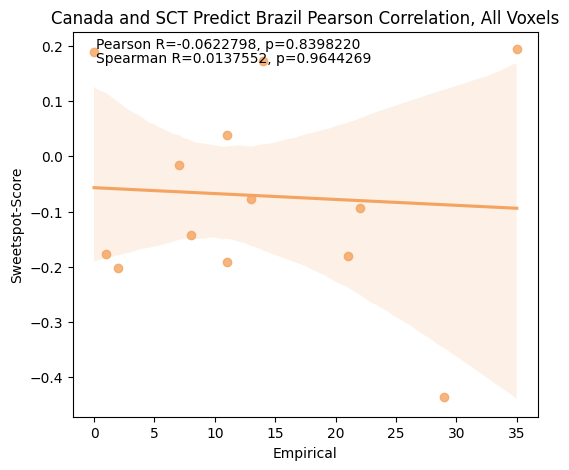

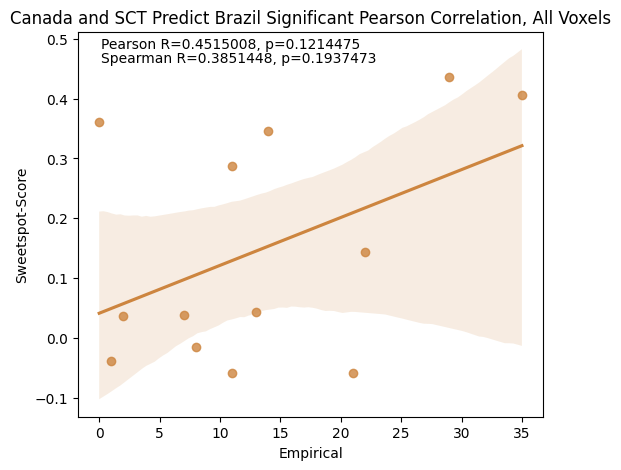

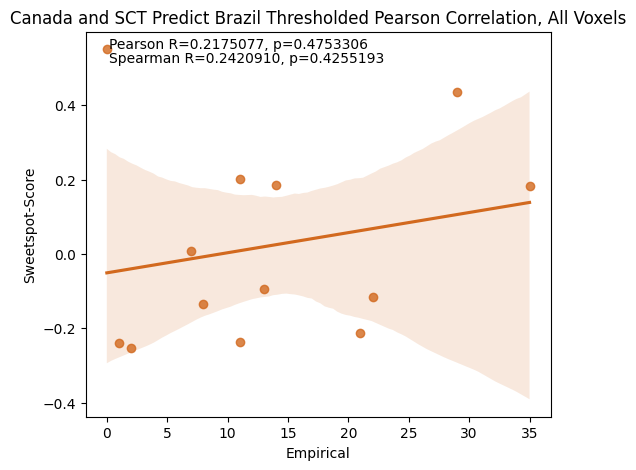

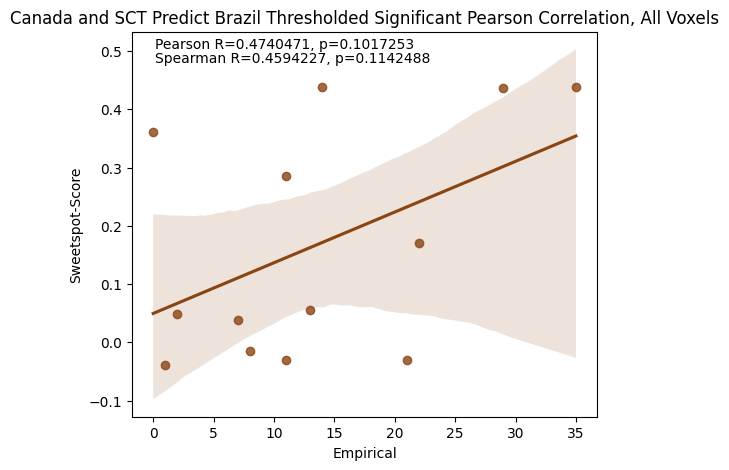

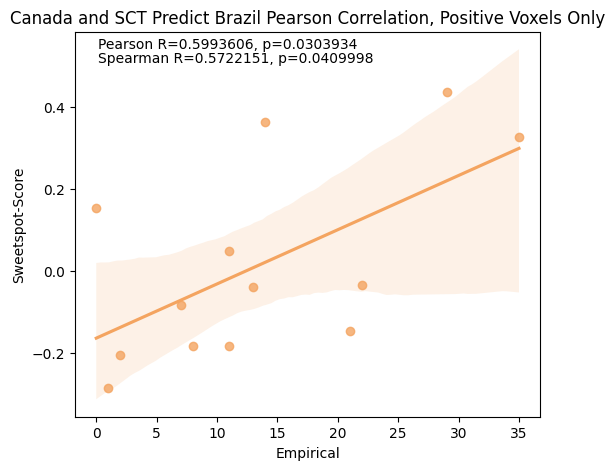

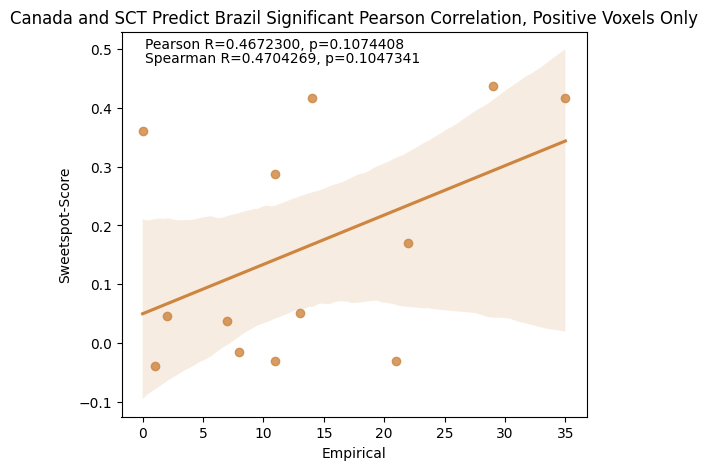

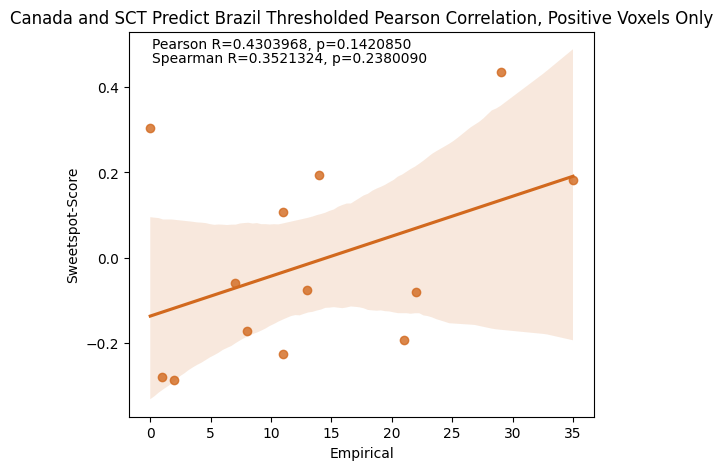

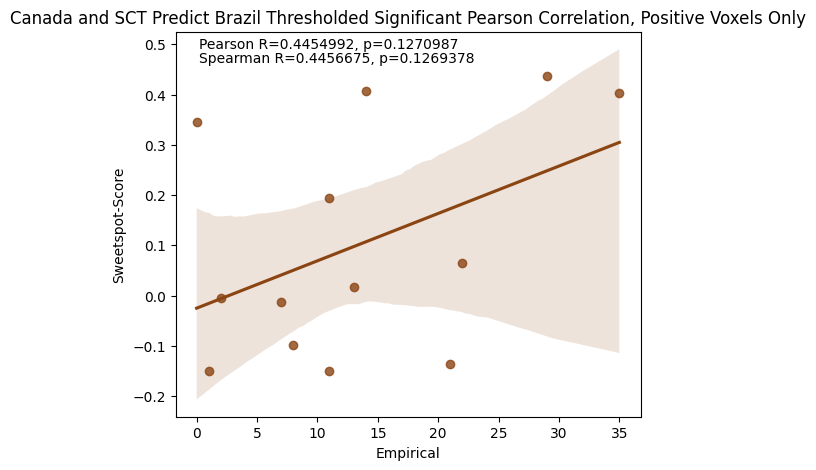

In [240]:
#pearson analysis for canada and sct predict brazil, absolute, all voxels and positive voxels only
def plot_pearson_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color, save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_pearson_analysis(brazil_df, pearson_sweetspot_corr, 'Canada and SCT Predict Brazil Pearson Correlation, All Voxels', pearson_r_val, pearson_p_val, s_pearson_r_val, s_pearson_p_val, 'sandybrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/relative/pearson_all.png')
plot_pearson_analysis(brazil_df, sig_pearson_sweetspot_corr, 'Canada and SCT Predict Brazil Significant Pearson Correlation, All Voxels',sig_pearson_r_val, sig_pearson_p_val, s_sig_pearson_r_val, s_sig_pearson_p_val, 'peru','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/absolute/pearson_sig_all.png')
plot_pearson_analysis(brazil_df, thresholded_pearson_sweetspot_corr, 'Canada and SCT Predict Brazil Thresholded Pearson Correlation, All Voxels',thresholded_pearson_r_val, thresholded_pearson_p_val, s_thresholded_pearson_r_val, s_thresholded_pearson_p_val, 'chocolate','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/absolute/pearson_thresholded_all.png')
plot_pearson_analysis(brazil_df, thresholded_sig_pearson_sweetspot_corr, 'Canada and SCT Predict Brazil Thresholded Significant Pearson Correlation, All Voxels',thresholded_sig_pearson_r_val, thresholded_sig_pearson_p_val, s_thresholded_sig_pearson_r_val, s_thresholded_sig_pearson_p_val, 'saddlebrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/absolute/pearson_sig_thresholded_all.png')

#positive only
plot_pearson_analysis(brazil_df, pos_pearson_sweetspot_corr, 'Canada and SCT Predict Brazil Pearson Correlation, Positive Voxels Only', pos_pearson_r_val, pos_pearson_p_val, pos_s_pearson_r_val, pos_s_pearson_p_val, 'sandybrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/absolute/pearson_pos.png')
plot_pearson_analysis(brazil_df, pos_sig_pearson_sweetspot_corr, 'Canada and SCT Predict Brazil Significant Pearson Correlation, Positive Voxels Only',pos_sig_pearson_r_val, pos_sig_pearson_p_val, pos_s_sig_pearson_r_val, pos_s_sig_pearson_p_val, 'peru','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/absolute/pearson_sig_pos.png')
plot_pearson_analysis(brazil_df, pos_thresholded_pearson_sweetspot_corr, 'Canada and SCT Predict Brazil Thresholded Pearson Correlation, Positive Voxels Only',pos_thresholded_pearson_r_val, pos_thresholded_pearson_p_val, pos_s_thresholded_pearson_r_val, pos_s_thresholded_pearson_p_val, 'chocolate','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/absolute/pearson_thresholded_pos.png')
plot_pearson_analysis(brazil_df, pos_thresholded_sig_pearson_sweetspot_corr, 'Canada and SCT Predict Brazil Thresholded Significant Pearson Correlation, Positive Voxels Only',pos_thresholded_sig_pearson_r_val, pos_thresholded_sig_pearson_p_val, pos_s_thresholded_sig_pearson_r_val, pos_s_thresholded_sig_pearson_p_val, 'saddlebrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/absolute/pearson_sig_thresholded_pos.png')

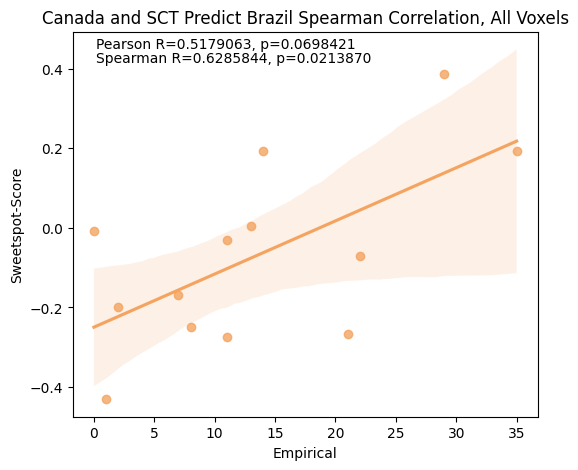

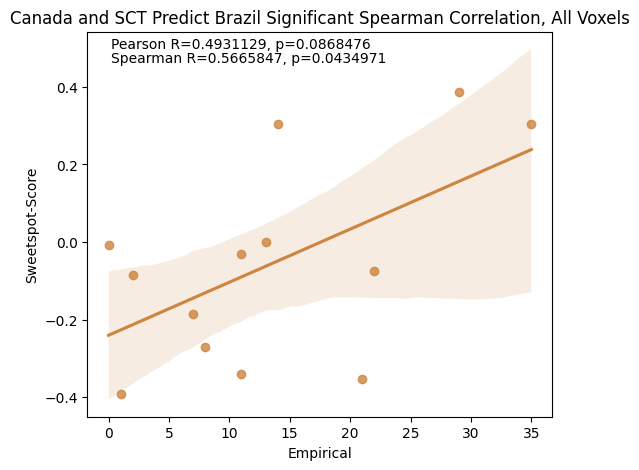

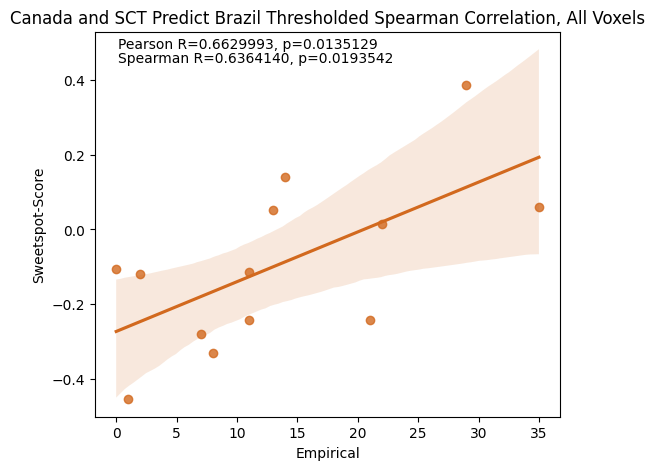

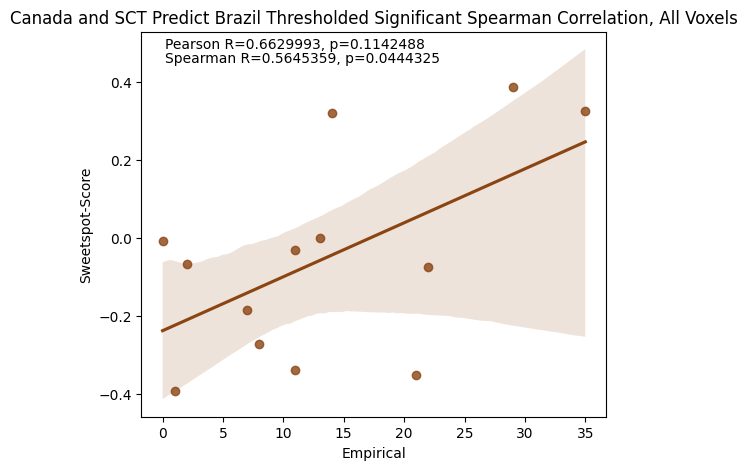

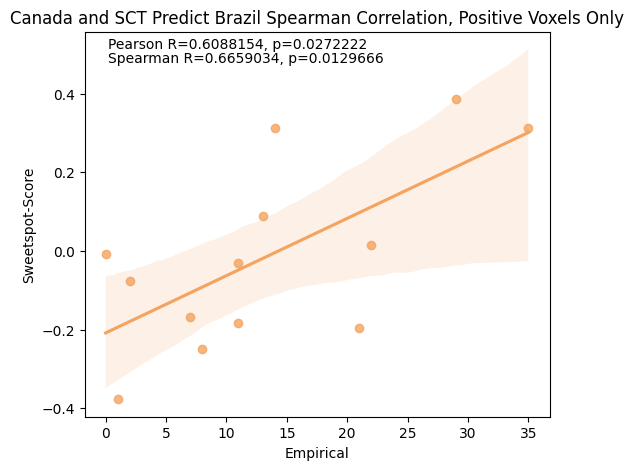

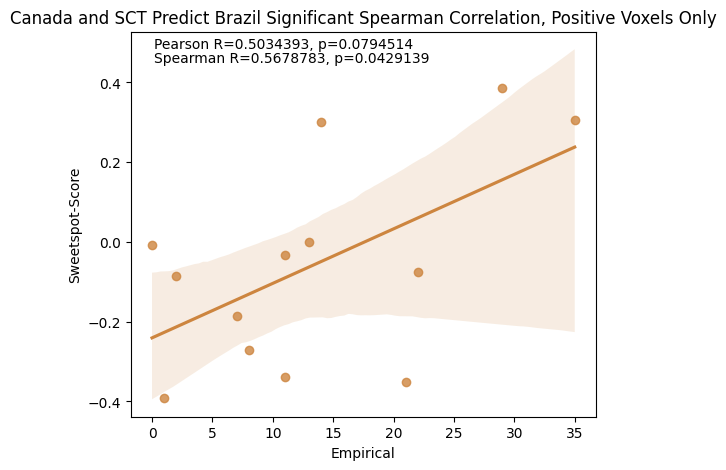

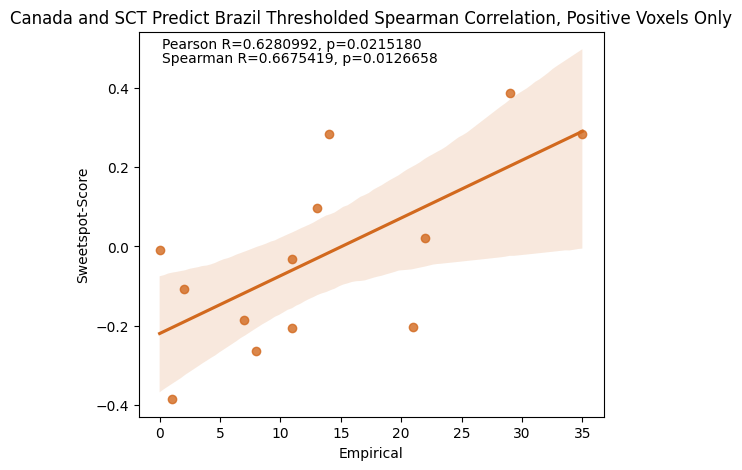

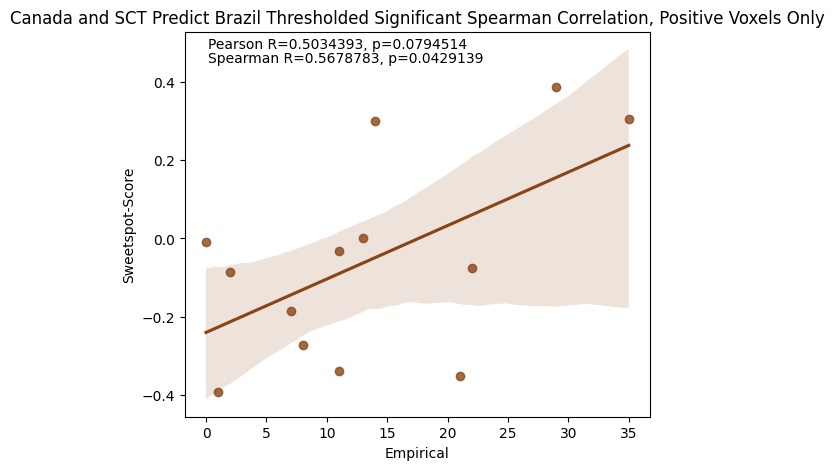

In [251]:
#spearman analysis for canada and sct predict brazil, absolute, all voxels, positive voxels only
def plot_spearman_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_spearman_analysis(brazil_df, spearman_sweetspot_corr, 'Canada and SCT Predict Brazil Spearman Correlation, All Voxels', spearman_r_val, spearman_p_val, p_spearman_r_val, p_spearman_p_val, 'sandybrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/absolute/spearman_all.png')
plot_spearman_analysis(brazil_df, sig_spearman_sweetspot_corr, 'Canada and SCT Predict Brazil Significant Spearman Correlation, All Voxels',sig_spearman_r_val, sig_spearman_p_val, p_sig_spearman_r_val, p_sig_spearman_p_val, 'peru','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/absolute/spearman_sig_all.png')
plot_spearman_analysis(brazil_df, thresholded_spearman_sweetspot_corr, 'Canada and SCT Predict Brazil Thresholded Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_spearman_p_val, p_thresholded_spearman_r_val, p_thresholded_spearman_p_val, 'chocolate','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/absolute/spearman_thresholded_all.png')
plot_spearman_analysis(brazil_df, thresholded_sig_spearman_sweetspot_corr, 'Canada and SCT Predict Brazil Thresholded Significant Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_sig_spearman_p_val, p_thresholded_sig_spearman_r_val, p_thresholded_sig_spearman_p_val, 'saddlebrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/absolute/spearman_sig_thresholded_all.png')

#positive voxels
plot_spearman_analysis(brazil_df, pos_spearman_sweetspot_corr, 'Canada and SCT Predict Brazil Spearman Correlation, Positive Voxels Only', pos_spearman_r_val, pos_spearman_p_val, pos_p_spearman_r_val, pos_p_spearman_p_val, 'sandybrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/absolute/spearman_pos.png')
plot_spearman_analysis(brazil_df, pos_sig_spearman_sweetspot_corr, 'Canada and SCT Predict Brazil Significant Spearman Correlation, Positive Voxels Only',pos_sig_spearman_r_val, pos_sig_spearman_p_val, pos_p_sig_spearman_r_val, pos_p_sig_spearman_p_val, 'peru','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/absolute/spearman_sig_pos.png')
plot_spearman_analysis(brazil_df, pos_thresholded_spearman_sweetspot_corr, 'Canada and SCT Predict Brazil Thresholded Spearman Correlation, Positive Voxels Only',pos_thresholded_spearman_r_val, pos_thresholded_spearman_p_val, pos_p_thresholded_spearman_r_val, pos_p_thresholded_spearman_p_val, 'chocolate','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/absolute/spearman_thresholded_pos.png')
plot_spearman_analysis(brazil_df, pos_thresholded_sig_spearman_sweetspot_corr, 'Canada and SCT Predict Brazil Thresholded Significant Spearman Correlation, Positive Voxels Only',pos_thresholded_sig_spearman_r_val, pos_thresholded_sig_spearman_p_val, pos_p_thresholded_sig_spearman_r_val, pos_p_thresholded_sig_spearman_p_val, 'saddlebrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/canada&sct predict brazil/absolute/spearman_sig_thresholded_pos.png')

# Brazil Predicts Canada and SCT

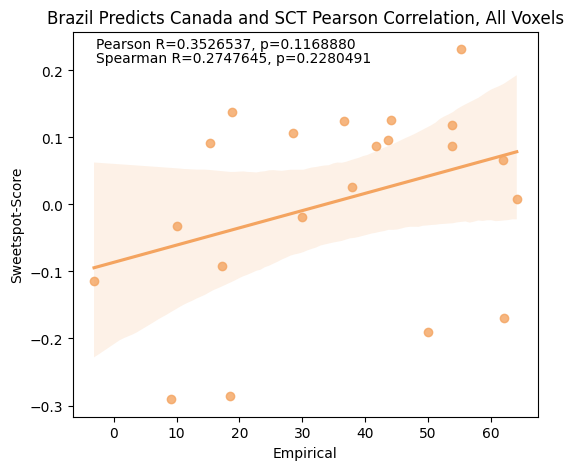

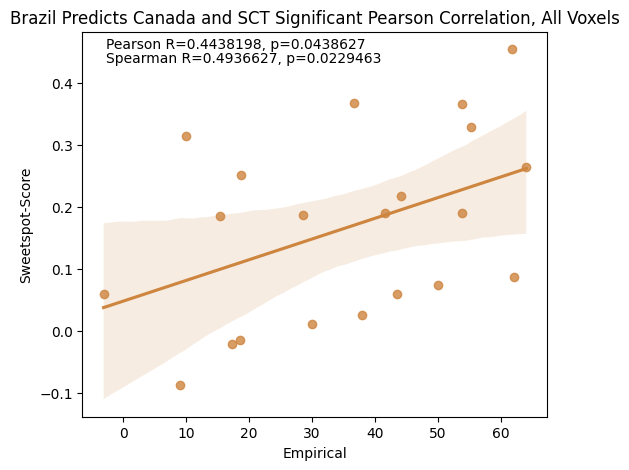

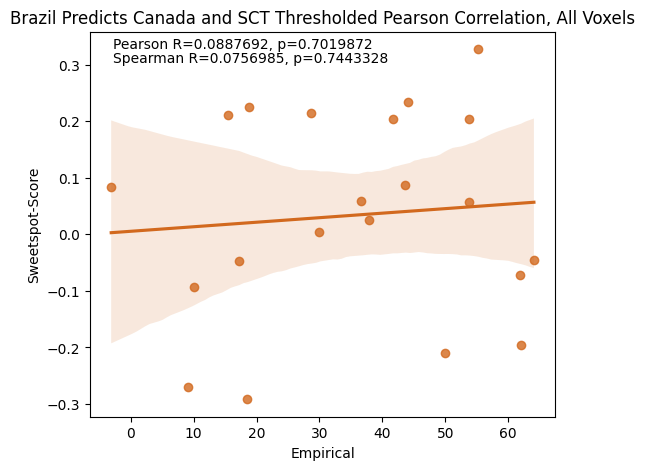

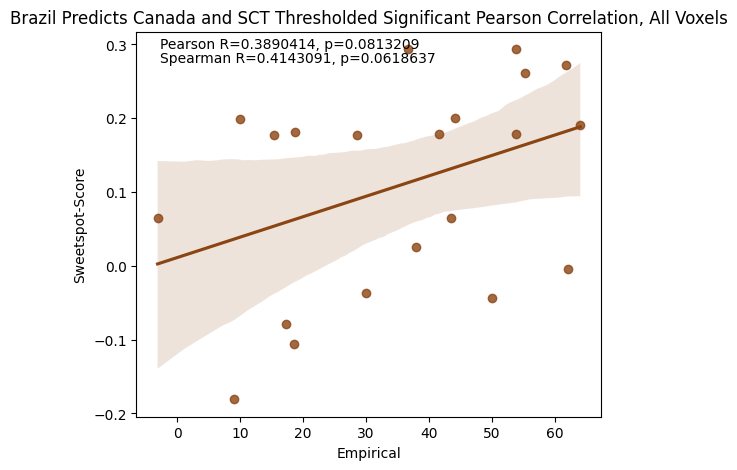

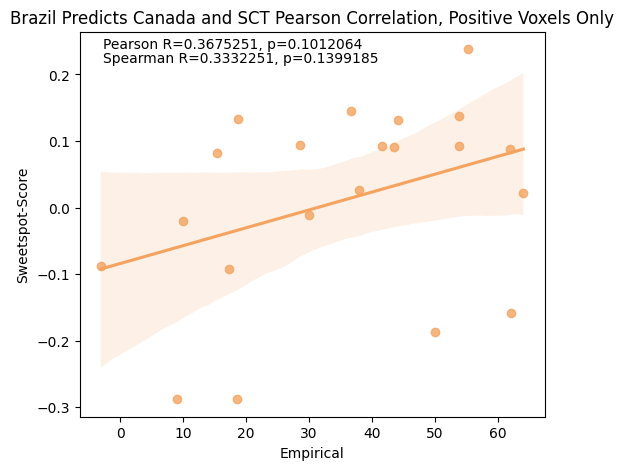

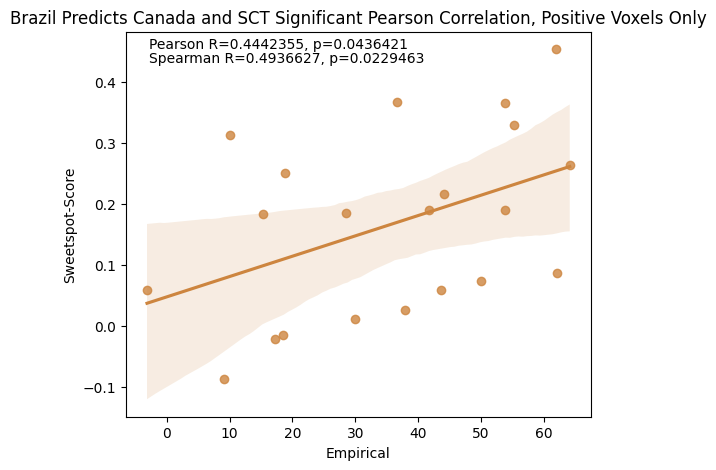

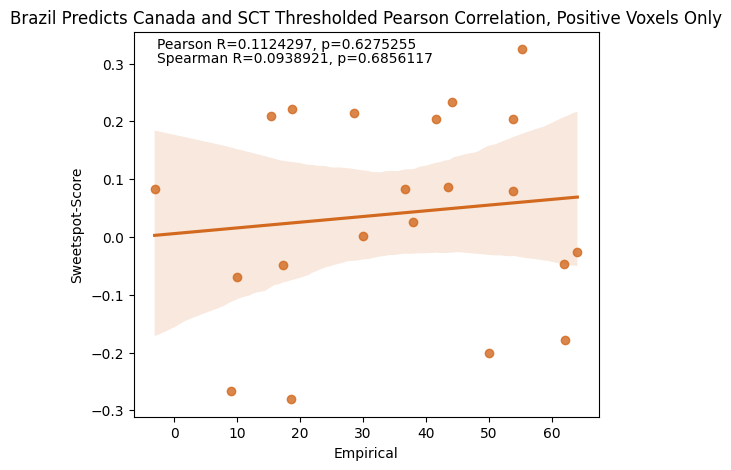

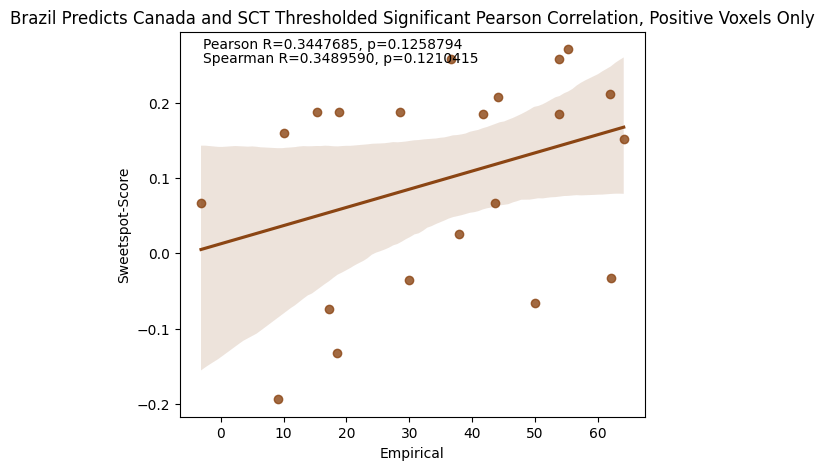

In [231]:
#pearson analysis for brazil predicts canada and sct, relative, all voxels and positive voxels only
def plot_pearson_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color, save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_pearson_analysis(canada_sct_df, pearson_sweetspot_corr, 'Brazil Predicts Canada and SCT Pearson Correlation, All Voxels', pearson_r_val, pearson_p_val, s_pearson_r_val, s_pearson_p_val, 'sandybrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/relative/pearson_all.png')
plot_pearson_analysis(canada_sct_df, sig_pearson_sweetspot_corr, 'Brazil Predicts Canada and SCT Significant Pearson Correlation, All Voxels',sig_pearson_r_val, sig_pearson_p_val, s_sig_pearson_r_val, s_sig_pearson_p_val, 'peru','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/relative/pearson_sig_all.png')
plot_pearson_analysis(canada_sct_df, thresholded_pearson_sweetspot_corr, 'Brazil Predicts Canada and SCT Thresholded Pearson Correlation, All Voxels',thresholded_pearson_r_val, thresholded_pearson_p_val, s_thresholded_pearson_r_val, s_thresholded_pearson_p_val, 'chocolate','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/relative/pearson_thresholded_all.png')
plot_pearson_analysis(canada_sct_df, thresholded_sig_pearson_sweetspot_corr, 'Brazil Predicts Canada and SCT Thresholded Significant Pearson Correlation, All Voxels',thresholded_sig_pearson_r_val, thresholded_sig_pearson_p_val, s_thresholded_sig_pearson_r_val, s_thresholded_sig_pearson_p_val, 'saddlebrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/relative/pearson_sig_thresholded_all.png')

#positive only
plot_pearson_analysis(canada_sct_df, pos_pearson_sweetspot_corr, 'Brazil Predicts Canada and SCT Pearson Correlation, Positive Voxels Only', pos_pearson_r_val, pos_pearson_p_val, pos_s_pearson_r_val, pos_s_pearson_p_val, 'sandybrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/relative/pearson_pos.png')
plot_pearson_analysis(canada_sct_df, pos_sig_pearson_sweetspot_corr, 'Brazil Predicts Canada and SCT Significant Pearson Correlation, Positive Voxels Only',pos_sig_pearson_r_val, pos_sig_pearson_p_val, pos_s_sig_pearson_r_val, pos_s_sig_pearson_p_val, 'peru','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/relative/pearson_sig_pos.png')
plot_pearson_analysis(canada_sct_df, pos_thresholded_pearson_sweetspot_corr, 'Brazil Predicts Canada and SCT Thresholded Pearson Correlation, Positive Voxels Only',pos_thresholded_pearson_r_val, pos_thresholded_pearson_p_val, pos_s_thresholded_pearson_r_val, pos_s_thresholded_pearson_p_val, 'chocolate','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/relative/pearson_thresholded_pos.png')
plot_pearson_analysis(canada_sct_df, pos_thresholded_sig_pearson_sweetspot_corr, 'Brazil Predicts Canada and SCT Thresholded Significant Pearson Correlation, Positive Voxels Only',pos_thresholded_sig_pearson_r_val, pos_thresholded_sig_pearson_p_val, pos_s_thresholded_sig_pearson_r_val, pos_s_thresholded_sig_pearson_p_val, 'saddlebrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/relative/pearson_sig_thresholded_pos.png')

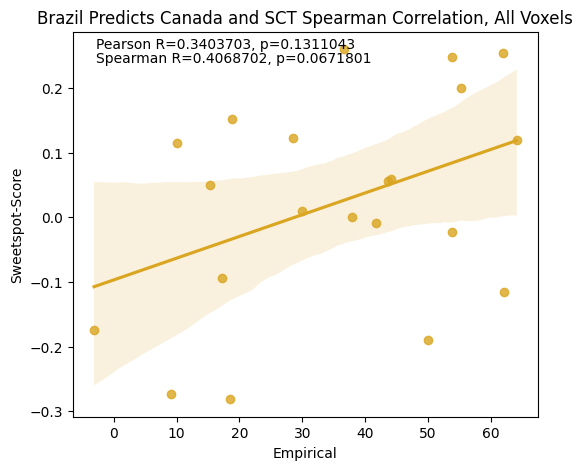

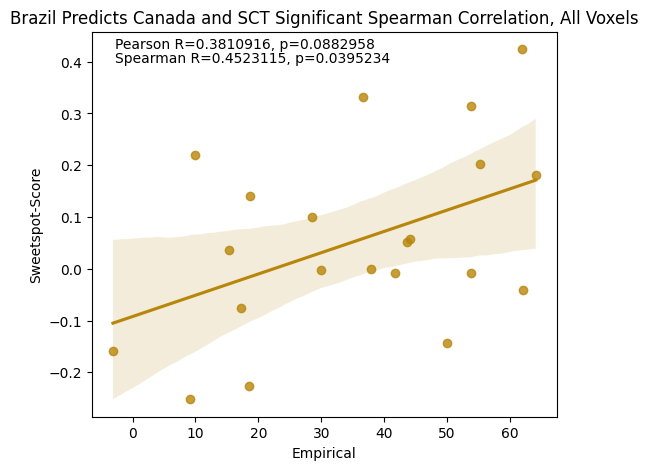

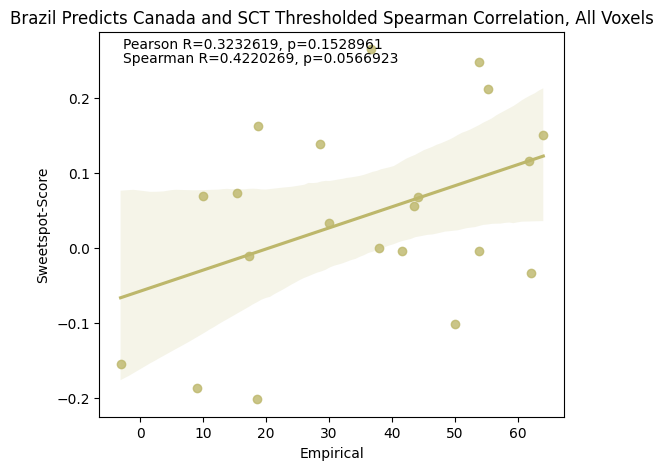

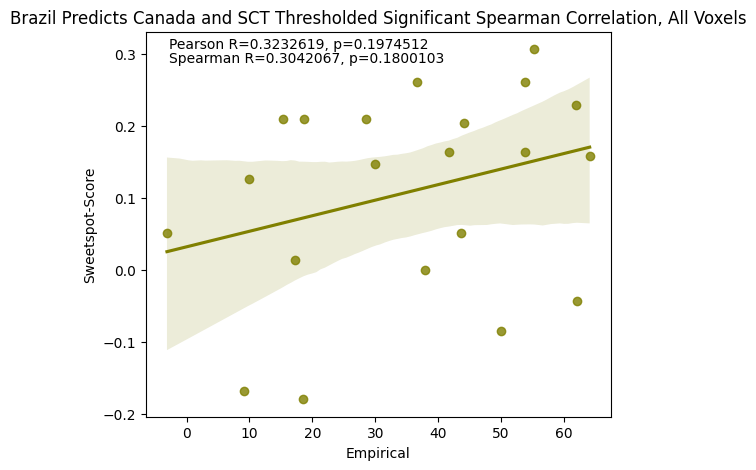

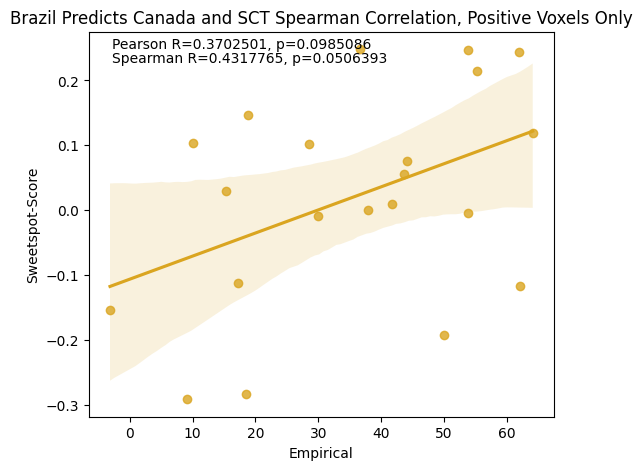

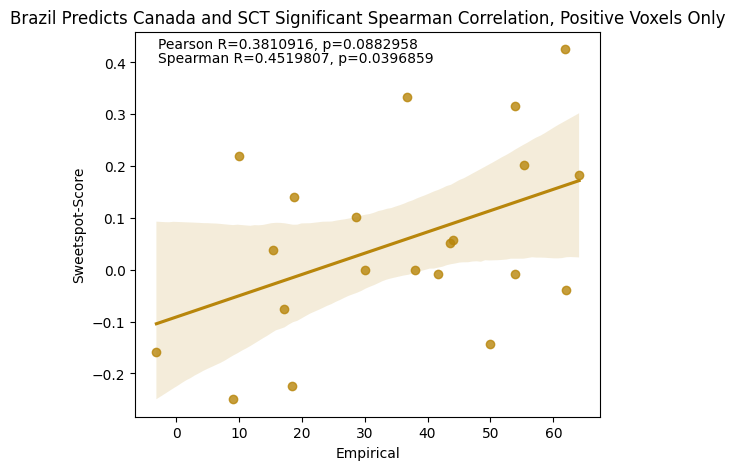

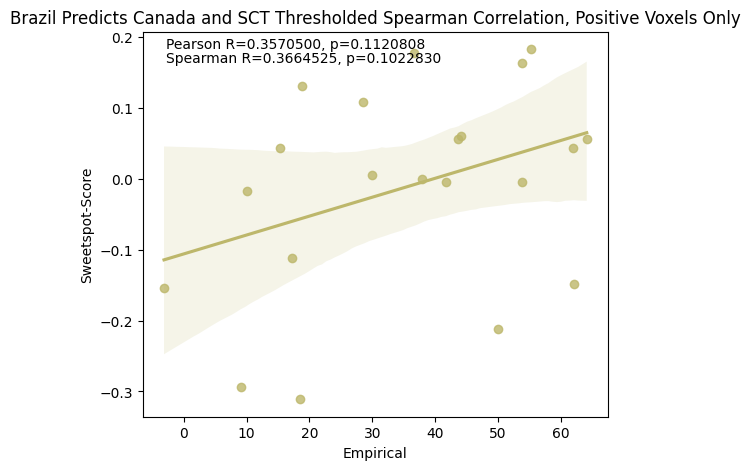

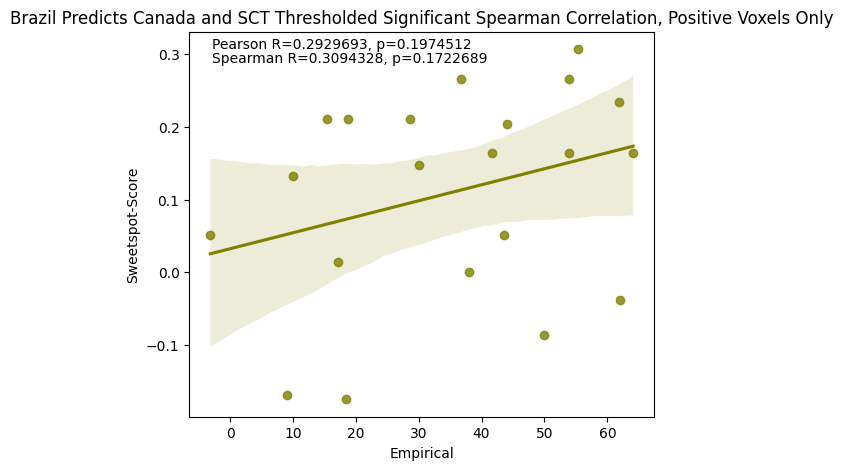

In [259]:
#spearman analysis for brazil predicts canada and sct, relative, all voxels, positive voxels only
def plot_spearman_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_spearman_analysis(canada_sct_df, spearman_sweetspot_corr, 'Brazil Predicts Canada and SCT Spearman Correlation, All Voxels', spearman_r_val, spearman_p_val, p_spearman_r_val, p_spearman_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/relative/spearman_all.png')
plot_spearman_analysis(canada_sct_df, sig_spearman_sweetspot_corr, 'Brazil Predicts Canada and SCT Significant Spearman Correlation, All Voxels',sig_spearman_r_val, sig_spearman_p_val, p_sig_spearman_r_val, p_sig_spearman_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/relative/spearman_sig_all.png')
plot_spearman_analysis(canada_sct_df, thresholded_spearman_sweetspot_corr, 'Brazil Predicts Canada and SCT Thresholded Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_spearman_p_val, p_thresholded_spearman_r_val, p_thresholded_spearman_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/relative/spearman_thresholded_all.png')
plot_spearman_analysis(canada_sct_df, thresholded_sig_spearman_sweetspot_corr, 'Brazil Predicts Canada and SCT Thresholded Significant Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_sig_spearman_p_val, p_thresholded_sig_spearman_r_val, p_thresholded_sig_spearman_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/relative/spearman_sig_thresholded_all.png')

#positive voxels
plot_spearman_analysis(canada_sct_df, pos_spearman_sweetspot_corr, 'Brazil Predicts Canada and SCT Spearman Correlation, Positive Voxels Only', pos_spearman_r_val, pos_spearman_p_val, pos_p_spearman_r_val, pos_p_spearman_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/relative/spearman_pos.png')
plot_spearman_analysis(canada_sct_df, pos_sig_spearman_sweetspot_corr, 'Brazil Predicts Canada and SCT Significant Spearman Correlation, Positive Voxels Only',pos_sig_spearman_r_val, pos_sig_spearman_p_val, pos_p_sig_spearman_r_val, pos_p_sig_spearman_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/relative/spearman_sig_pos.png')
plot_spearman_analysis(canada_sct_df, pos_thresholded_spearman_sweetspot_corr, 'Brazil Predicts Canada and SCT Thresholded Spearman Correlation, Positive Voxels Only',pos_thresholded_spearman_r_val, pos_thresholded_spearman_p_val, pos_p_thresholded_spearman_r_val, pos_p_thresholded_spearman_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/relative/spearman_thresholded_pos.png')
plot_spearman_analysis(canada_sct_df, pos_thresholded_sig_spearman_sweetspot_corr, 'Brazil Predicts Canada and SCT Thresholded Significant Spearman Correlation, Positive Voxels Only',pos_thresholded_sig_spearman_r_val, pos_thresholded_sig_spearman_p_val, pos_p_thresholded_sig_spearman_r_val, pos_p_thresholded_sig_spearman_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/relative/spearman_sig_thresholded_pos.png')

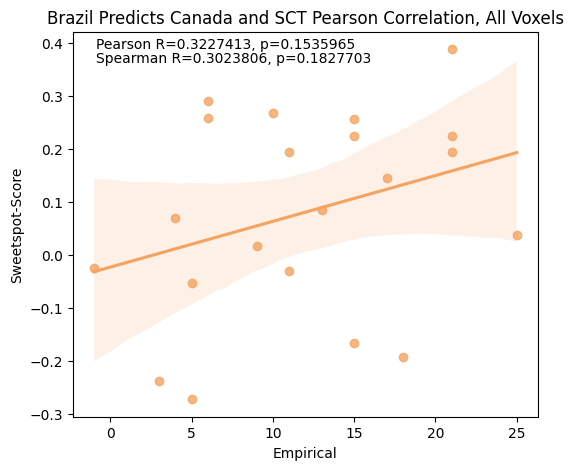

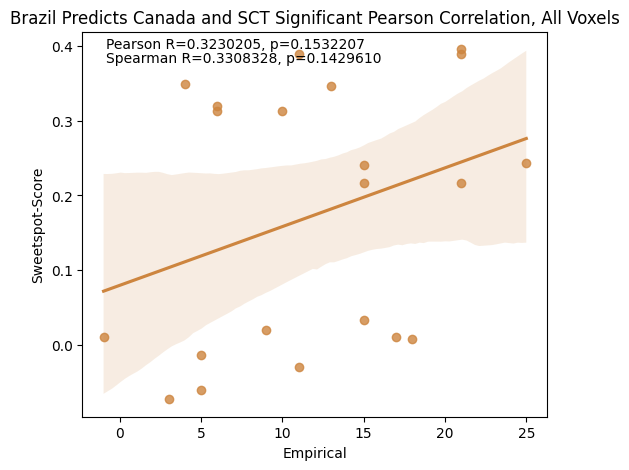

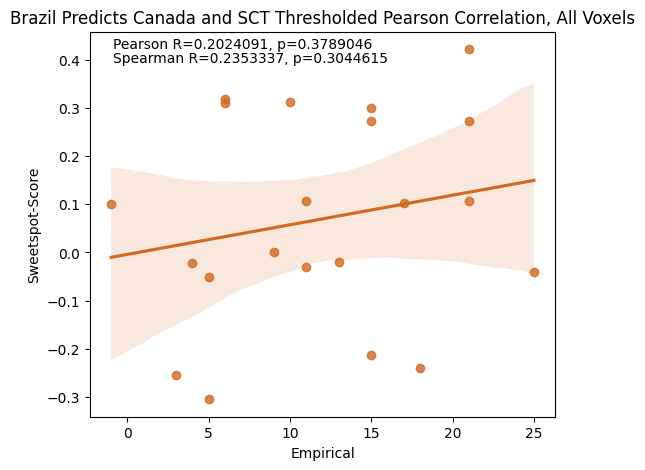

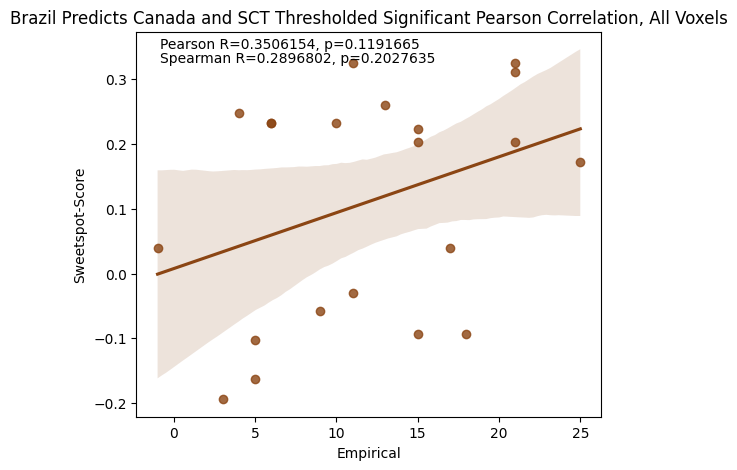

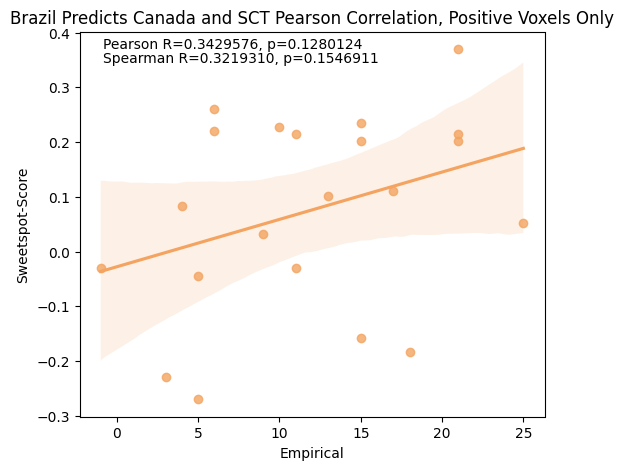

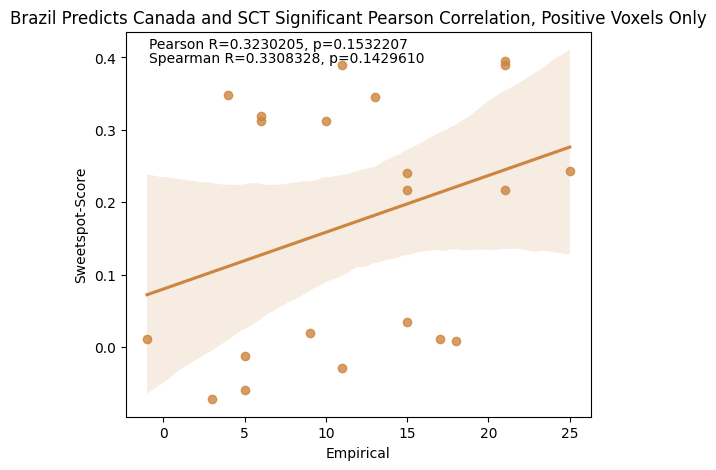

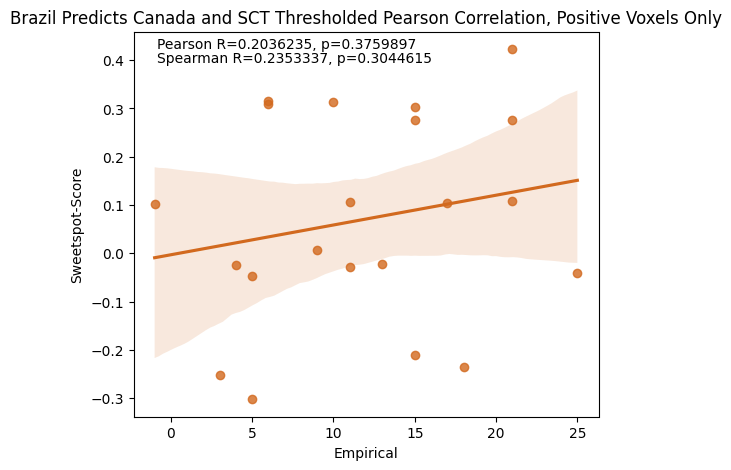

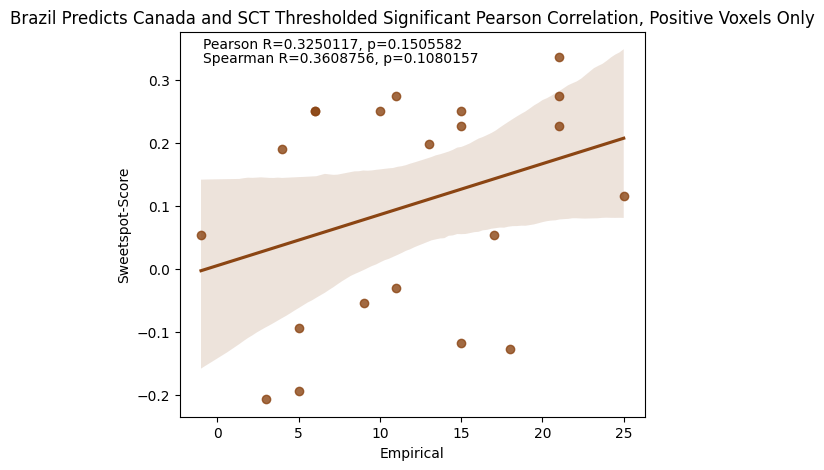

In [7]:
#pearson analysis for brazil predicts canada and sct, absolute, all voxels and positive voxels only
def plot_pearson_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color, save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_pearson_analysis(canada_sct_df, pearson_sweetspot_corr, 'Brazil Predicts Canada and SCT Pearson Correlation, All Voxels', pearson_r_val, pearson_p_val, s_pearson_r_val, s_pearson_p_val, 'sandybrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/absolute/pearson_all.png')
plot_pearson_analysis(canada_sct_df, sig_pearson_sweetspot_corr, 'Brazil Predicts Canada and SCT Significant Pearson Correlation, All Voxels',sig_pearson_r_val, sig_pearson_p_val, s_sig_pearson_r_val, s_sig_pearson_p_val, 'peru','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/absolute/pearson_sig_all.png')
plot_pearson_analysis(canada_sct_df, thresholded_pearson_sweetspot_corr, 'Brazil Predicts Canada and SCT Thresholded Pearson Correlation, All Voxels',thresholded_pearson_r_val, thresholded_pearson_p_val, s_thresholded_pearson_r_val, s_thresholded_pearson_p_val, 'chocolate','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/absolute/pearson_thresholded_all.png')
plot_pearson_analysis(canada_sct_df, thresholded_sig_pearson_sweetspot_corr, 'Brazil Predicts Canada and SCT Thresholded Significant Pearson Correlation, All Voxels',thresholded_sig_pearson_r_val, thresholded_sig_pearson_p_val, s_thresholded_sig_pearson_r_val, s_thresholded_sig_pearson_p_val, 'saddlebrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/absolute/pearson_sig_thresholded_all.png')

#positive only
plot_pearson_analysis(canada_sct_df, pos_pearson_sweetspot_corr, 'Brazil Predicts Canada and SCT Pearson Correlation, Positive Voxels Only', pos_pearson_r_val, pos_pearson_p_val, pos_s_pearson_r_val, pos_s_pearson_p_val, 'sandybrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/absolute/pearson_pos.png')
plot_pearson_analysis(canada_sct_df, pos_sig_pearson_sweetspot_corr, 'Brazil Predicts Canada and SCT Significant Pearson Correlation, Positive Voxels Only',pos_sig_pearson_r_val, pos_sig_pearson_p_val, pos_s_sig_pearson_r_val, pos_s_sig_pearson_p_val, 'peru','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/absolute/pearson_sig_pos.png')
plot_pearson_analysis(canada_sct_df, pos_thresholded_pearson_sweetspot_corr, 'Brazil Predicts Canada and SCT Thresholded Pearson Correlation, Positive Voxels Only',pos_thresholded_pearson_r_val, pos_thresholded_pearson_p_val, pos_s_thresholded_pearson_r_val, pos_s_thresholded_pearson_p_val, 'chocolate','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/absolute/pearson_thresholded_pos.png')
plot_pearson_analysis(canada_sct_df, pos_thresholded_sig_pearson_sweetspot_corr, 'Brazil Predicts Canada and SCT Thresholded Significant Pearson Correlation, Positive Voxels Only',pos_thresholded_sig_pearson_r_val, pos_thresholded_sig_pearson_p_val, pos_s_thresholded_sig_pearson_r_val, pos_s_thresholded_sig_pearson_p_val, 'saddlebrown','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/absolute/pearson_sig_thresholded_pos.png')

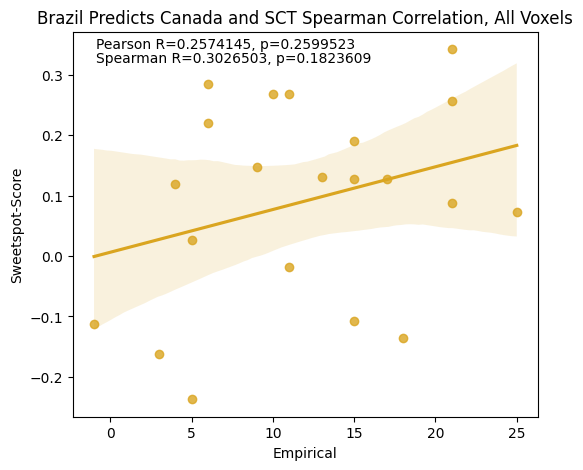

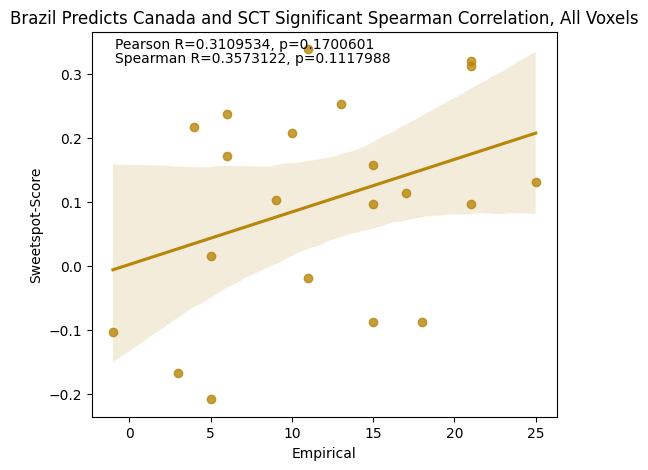

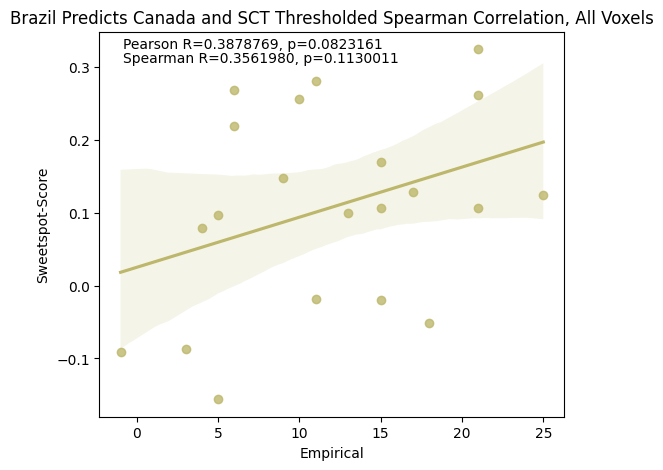

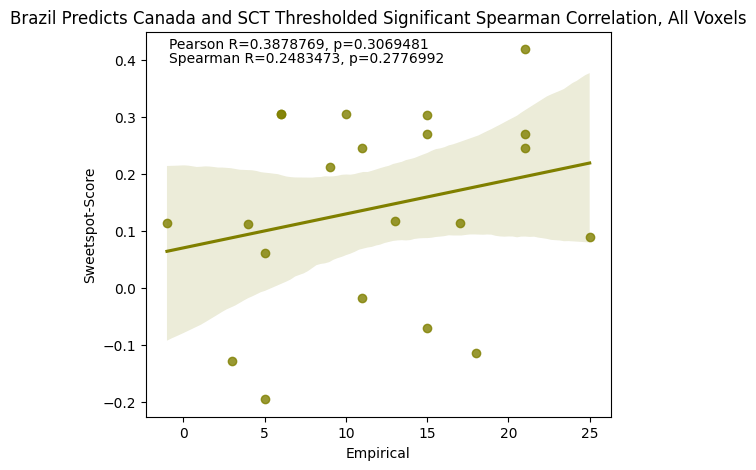

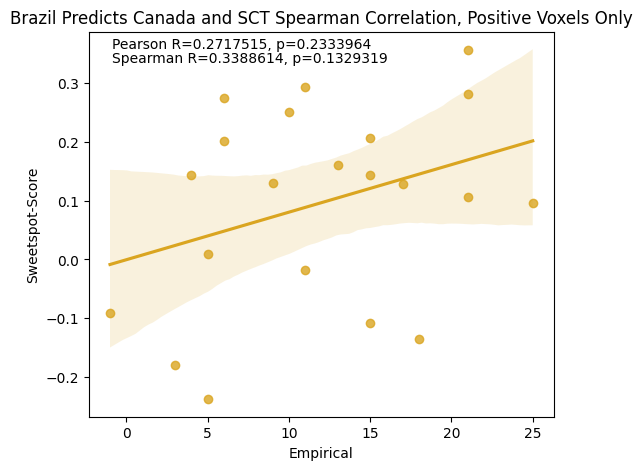

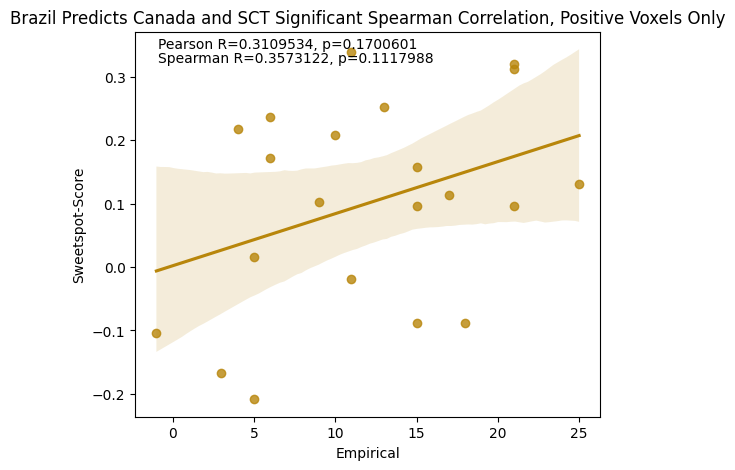

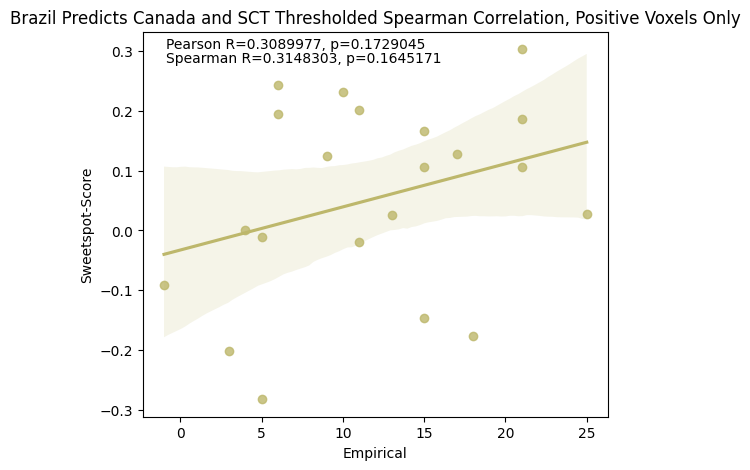

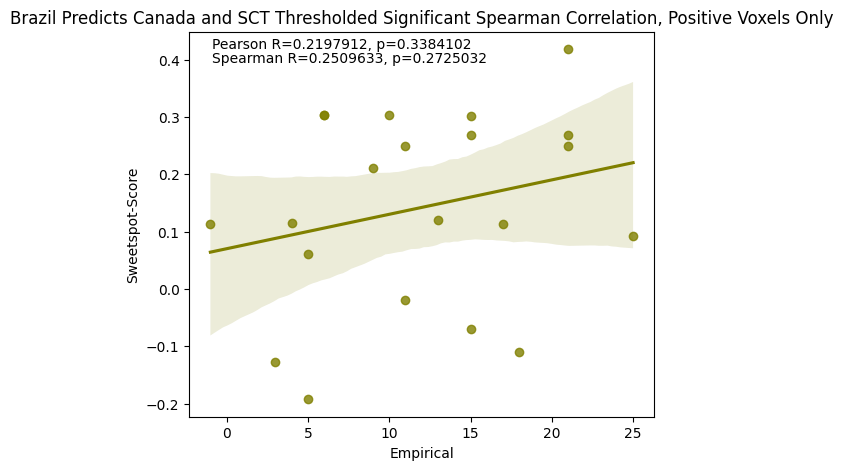

In [8]:
#spearman analysis for brazil predicts canada and sct, absolute, all voxels, positive voxels only
def plot_spearman_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_spearman_analysis(canada_sct_df, spearman_sweetspot_corr, 'Brazil Predicts Canada and SCT Spearman Correlation, All Voxels', spearman_r_val, spearman_p_val, p_spearman_r_val, p_spearman_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/absolute/spearman_all.png')
plot_spearman_analysis(canada_sct_df, sig_spearman_sweetspot_corr, 'Brazil Predicts Canada and SCT Significant Spearman Correlation, All Voxels',sig_spearman_r_val, sig_spearman_p_val, p_sig_spearman_r_val, p_sig_spearman_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/absolute/spearman_sig_all.png')
plot_spearman_analysis(canada_sct_df, thresholded_spearman_sweetspot_corr, 'Brazil Predicts Canada and SCT Thresholded Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_spearman_p_val, p_thresholded_spearman_r_val, p_thresholded_spearman_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/absolute/spearman_thresholded_all.png')
plot_spearman_analysis(canada_sct_df, thresholded_sig_spearman_sweetspot_corr, 'Brazil Predicts Canada and SCT Thresholded Significant Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_sig_spearman_p_val, p_thresholded_sig_spearman_r_val, p_thresholded_sig_spearman_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/absolute/spearman_sig_thresholded_all.png')

#positive voxels
plot_spearman_analysis(canada_sct_df, pos_spearman_sweetspot_corr, 'Brazil Predicts Canada and SCT Spearman Correlation, Positive Voxels Only', pos_spearman_r_val, pos_spearman_p_val, pos_p_spearman_r_val, pos_p_spearman_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/absolute/spearman_pos.png')
plot_spearman_analysis(canada_sct_df, pos_sig_spearman_sweetspot_corr, 'Brazil Predicts Canada and SCT Significant Spearman Correlation, Positive Voxels Only',pos_sig_spearman_r_val, pos_sig_spearman_p_val, pos_p_sig_spearman_r_val, pos_p_sig_spearman_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/absolute/spearman_sig_pos.png')
plot_spearman_analysis(canada_sct_df, pos_thresholded_spearman_sweetspot_corr, 'Brazil Predicts Canada and SCT Thresholded Spearman Correlation, Positive Voxels Only',pos_thresholded_spearman_r_val, pos_thresholded_spearman_p_val, pos_p_thresholded_spearman_r_val, pos_p_thresholded_spearman_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/absolute/spearman_thresholded_pos.png')
plot_spearman_analysis(canada_sct_df, pos_thresholded_sig_spearman_sweetspot_corr, 'Brazil Predicts Canada and SCT Thresholded Significant Spearman Correlation, Positive Voxels Only',pos_thresholded_sig_spearman_r_val, pos_thresholded_sig_spearman_p_val, pos_p_thresholded_sig_spearman_r_val, pos_p_thresholded_sig_spearman_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/brazil predicts canada&sct/absolute/spearman_sig_thresholded_pos.png')

# SCT Predicts Capsulotomy

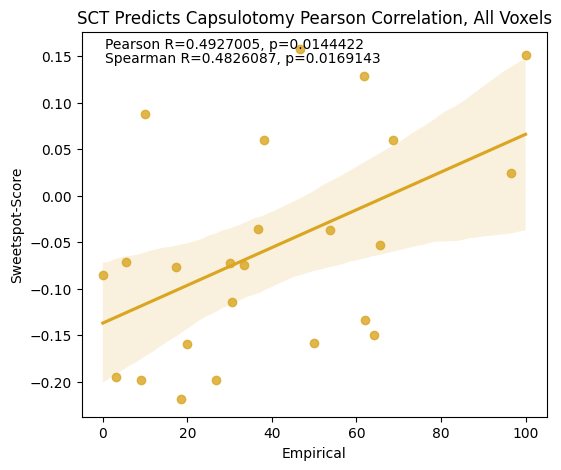

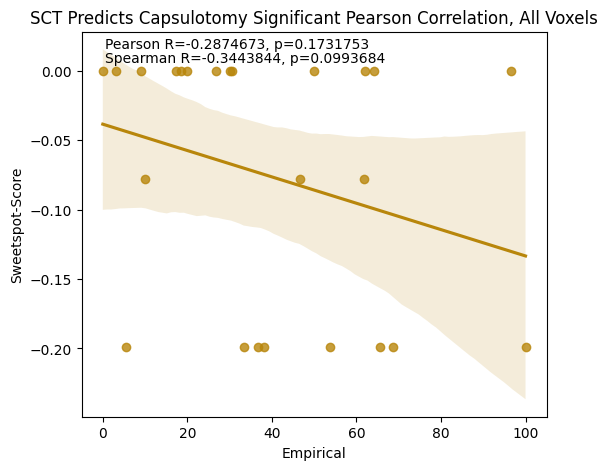

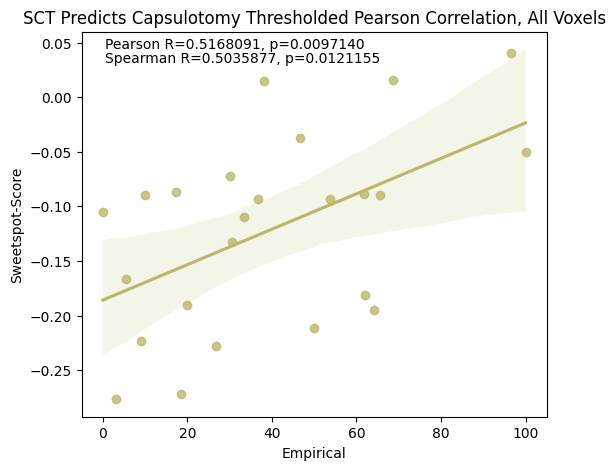

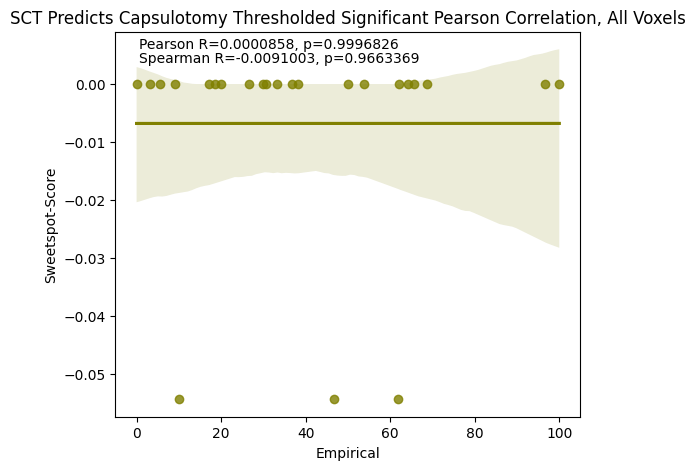

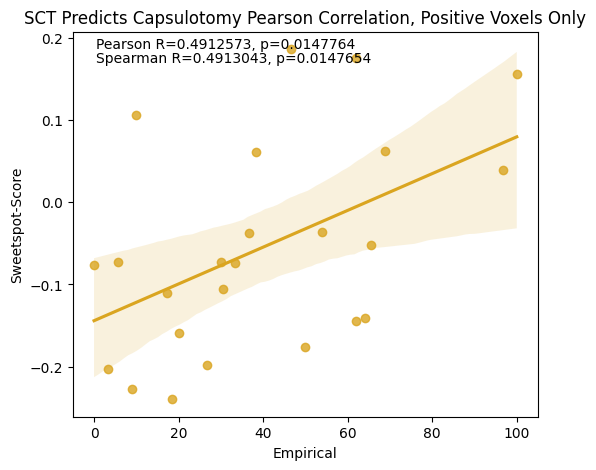

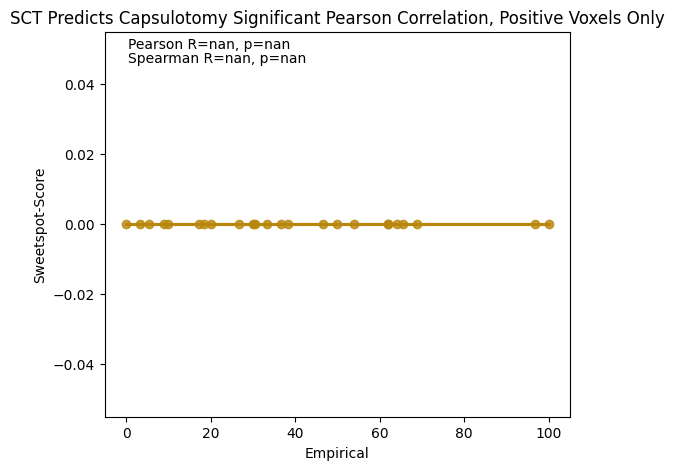

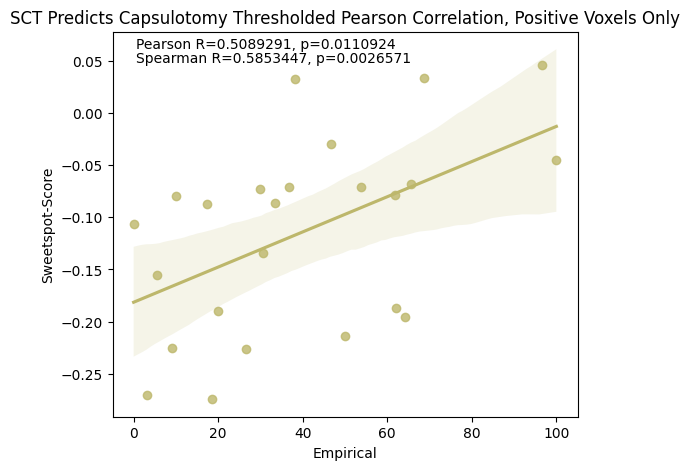

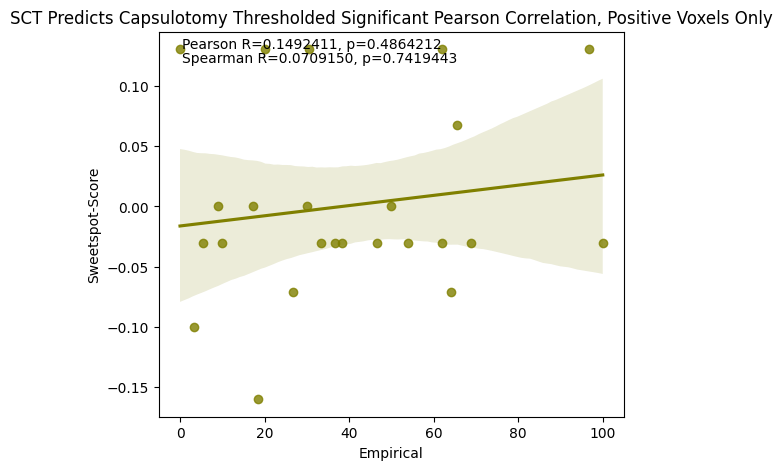

In [49]:
#pearson analysis for sct predicts capsulotomy, relative, all voxels and positive voxels only
def plot_pearson_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color, save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_pearson_analysis(brazil_canada_df, pearson_sweetspot_corr, 'SCT Predicts Capsulotomy Pearson Correlation, All Voxels', pearson_r_val, pearson_p_val, s_pearson_r_val, s_pearson_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/relative/pearson_all.png')
plot_pearson_analysis(brazil_canada_df, sig_pearson_sweetspot_corr, 'SCT Predicts Capsulotomy Significant Pearson Correlation, All Voxels',sig_pearson_r_val, sig_pearson_p_val, s_sig_pearson_r_val, s_sig_pearson_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/relative/pearson_sig_all.png')
plot_pearson_analysis(brazil_canada_df, thresholded_pearson_sweetspot_corr, 'SCT Predicts Capsulotomy Thresholded Pearson Correlation, All Voxels',thresholded_pearson_r_val, thresholded_pearson_p_val, s_thresholded_pearson_r_val, s_thresholded_pearson_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/relative/pearson_thresholded_all.png')
plot_pearson_analysis(brazil_canada_df, thresholded_sig_pearson_sweetspot_corr, 'SCT Predicts Capsulotomy Thresholded Significant Pearson Correlation, All Voxels',thresholded_sig_pearson_r_val, thresholded_sig_pearson_p_val, s_thresholded_sig_pearson_r_val, s_thresholded_sig_pearson_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/relative/pearson_sig_thresholded_all.png')

#positive only
plot_pearson_analysis(brazil_canada_df, pos_pearson_sweetspot_corr, 'SCT Predicts Capsulotomy Pearson Correlation, Positive Voxels Only', pos_pearson_r_val, pos_pearson_p_val, pos_s_pearson_r_val, pos_s_pearson_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/relative/pearson_pos.png')
plot_pearson_analysis(brazil_canada_df, pos_sig_pearson_sweetspot_corr, 'SCT Predicts Capsulotomy Significant Pearson Correlation, Positive Voxels Only',pos_sig_pearson_r_val, pos_sig_pearson_p_val, pos_s_sig_pearson_r_val, pos_s_sig_pearson_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/relative/pearson_sig_pos.png')
plot_pearson_analysis(brazil_canada_df, pos_thresholded_pearson_sweetspot_corr, 'SCT Predicts Capsulotomy Thresholded Pearson Correlation, Positive Voxels Only',pos_thresholded_pearson_r_val, pos_thresholded_pearson_p_val, pos_s_thresholded_pearson_r_val, pos_s_thresholded_pearson_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/relative/pearson_thresholded_pos.png')
plot_pearson_analysis(brazil_canada_df, pos_thresholded_sig_pearson_sweetspot_corr, 'SCT Predicts Capsulotomy Thresholded Significant Pearson Correlation, Positive Voxels Only',pos_thresholded_sig_pearson_r_val, pos_thresholded_sig_pearson_p_val, pos_s_thresholded_sig_pearson_r_val, pos_s_thresholded_sig_pearson_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/relative/pearson_sig_thresholded_pos.png')

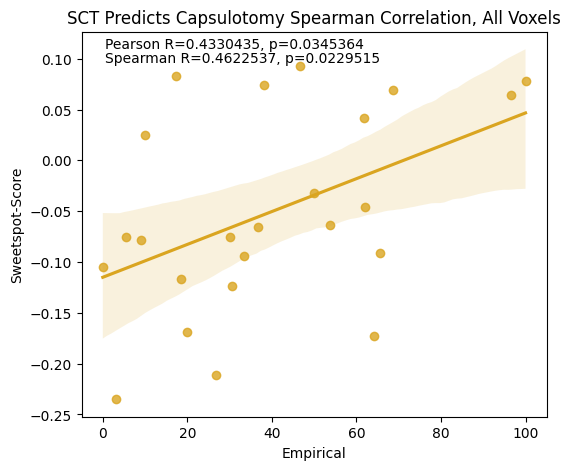

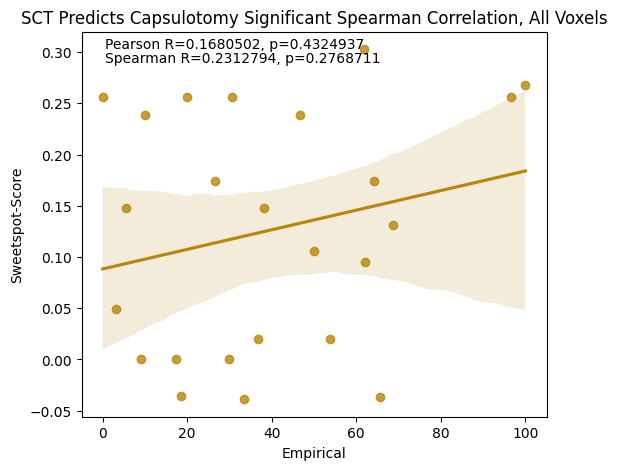

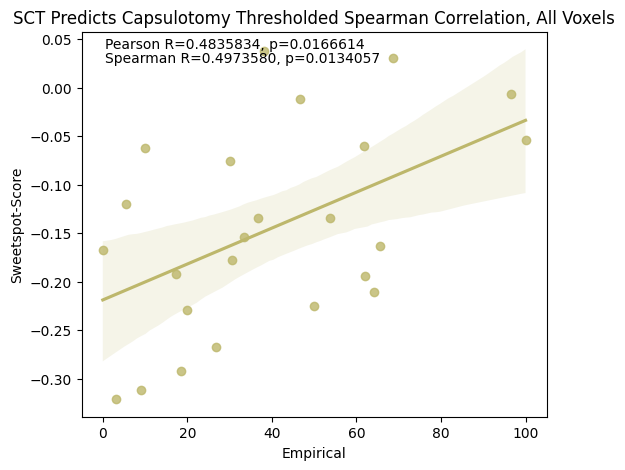

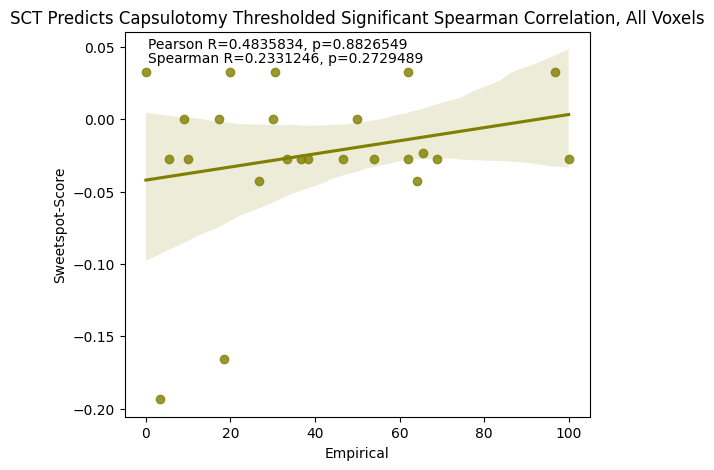

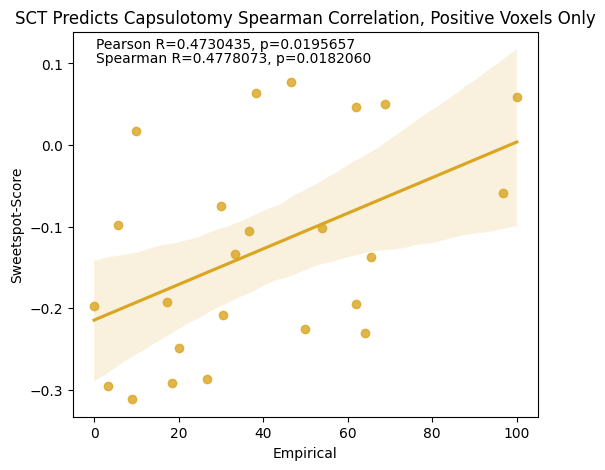

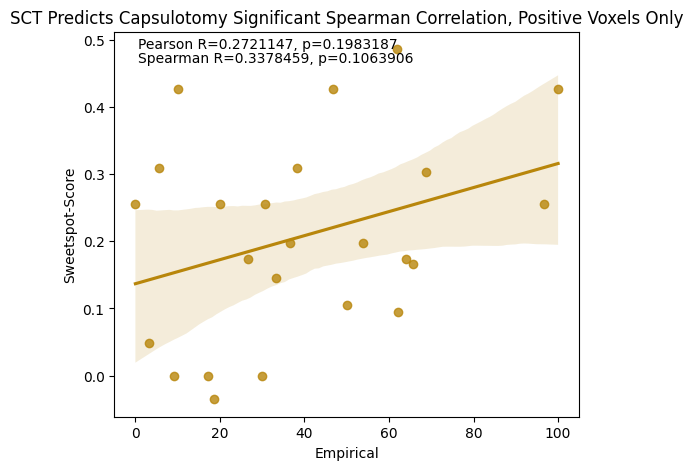

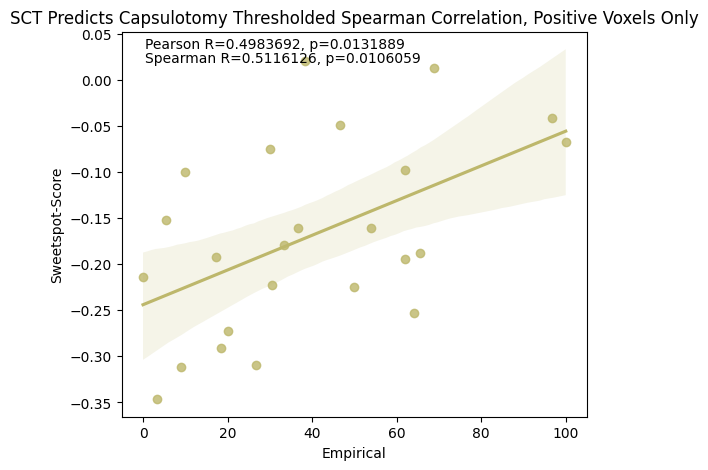

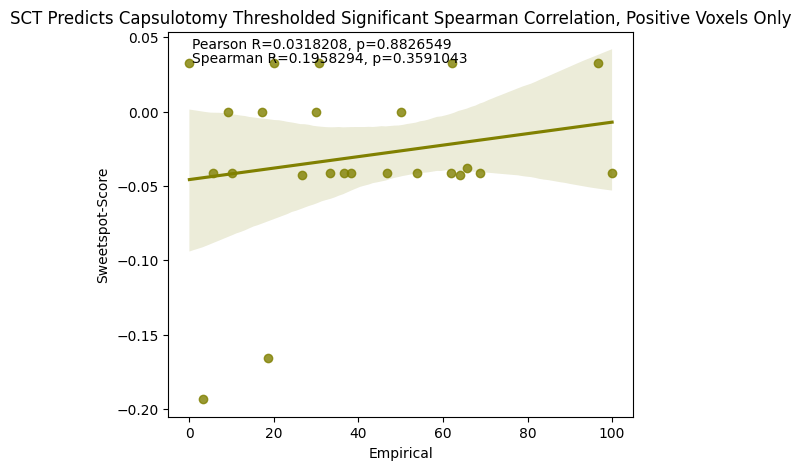

In [218]:
#spearman analysis for sct predicts capsulotomy, relative, all voxels, positive voxels only
def plot_spearman_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_spearman_analysis(brazil_canada_df, spearman_sweetspot_corr, 'SCT Predicts Capsulotomy Spearman Correlation, All Voxels', spearman_r_val, spearman_p_val, p_spearman_r_val, p_spearman_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/relative/spearman_all.png')
plot_spearman_analysis(brazil_canada_df, sig_spearman_sweetspot_corr, 'SCT Predicts Capsulotomy Significant Spearman Correlation, All Voxels',sig_spearman_r_val, sig_spearman_p_val, p_sig_spearman_r_val, p_sig_spearman_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/relative/spearman_sig_all.png')
plot_spearman_analysis(brazil_canada_df, thresholded_spearman_sweetspot_corr, 'SCT Predicts Capsulotomy Thresholded Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_spearman_p_val, p_thresholded_spearman_r_val, p_thresholded_spearman_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/relative/spearman_thresholded_all.png')
plot_spearman_analysis(brazil_canada_df, thresholded_sig_spearman_sweetspot_corr, 'SCT Predicts Capsulotomy Thresholded Significant Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_sig_spearman_p_val, p_thresholded_sig_spearman_r_val, p_thresholded_sig_spearman_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/relative/spearman_sig_thresholded_all.png')

#positive voxels
plot_spearman_analysis(brazil_canada_df, pos_spearman_sweetspot_corr, 'SCT Predicts Capsulotomy Spearman Correlation, Positive Voxels Only', pos_spearman_r_val, pos_spearman_p_val, pos_p_spearman_r_val, pos_p_spearman_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/relative/spearman_pos.png')
plot_spearman_analysis(brazil_canada_df, pos_sig_spearman_sweetspot_corr, 'SCT Predicts Capsulotomy Significant Spearman Correlation, Positive Voxels Only',pos_sig_spearman_r_val, pos_sig_spearman_p_val, pos_p_sig_spearman_r_val, pos_p_sig_spearman_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/relative/spearman_sig_pos.png')
plot_spearman_analysis(brazil_canada_df, pos_thresholded_spearman_sweetspot_corr, 'SCT Predicts Capsulotomy Thresholded Spearman Correlation, Positive Voxels Only',pos_thresholded_spearman_r_val, pos_thresholded_spearman_p_val, pos_p_thresholded_spearman_r_val, pos_p_thresholded_spearman_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/relative/spearman_thresholded_pos.png')
plot_spearman_analysis(brazil_canada_df, pos_thresholded_sig_spearman_sweetspot_corr, 'SCT Predicts Capsulotomy Thresholded Significant Spearman Correlation, Positive Voxels Only',pos_thresholded_sig_spearman_r_val, pos_thresholded_sig_spearman_p_val, pos_p_thresholded_sig_spearman_r_val, pos_p_thresholded_sig_spearman_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/relative/spearman_sig_thresholded_pos.png')

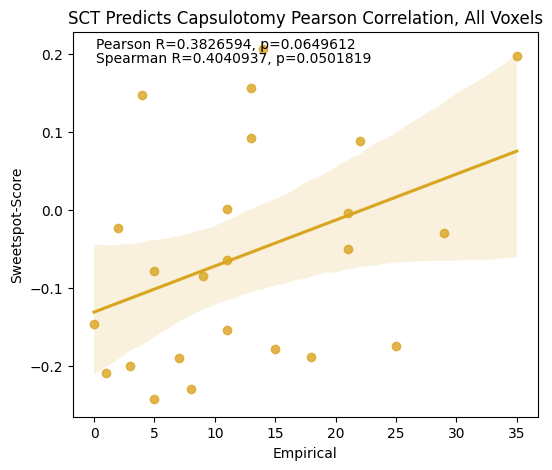

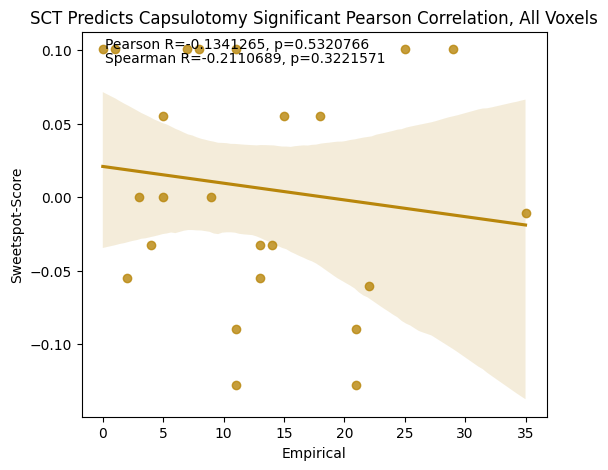

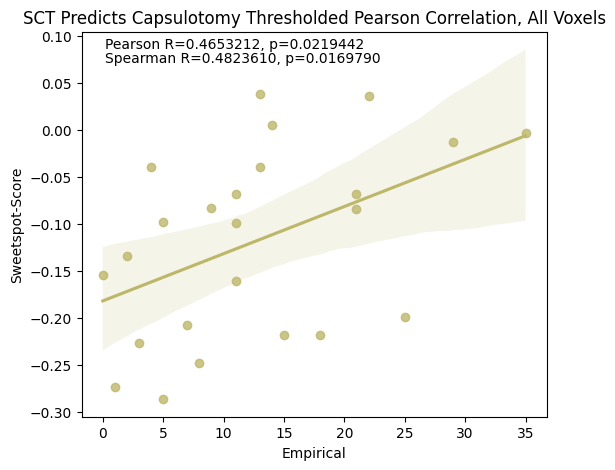

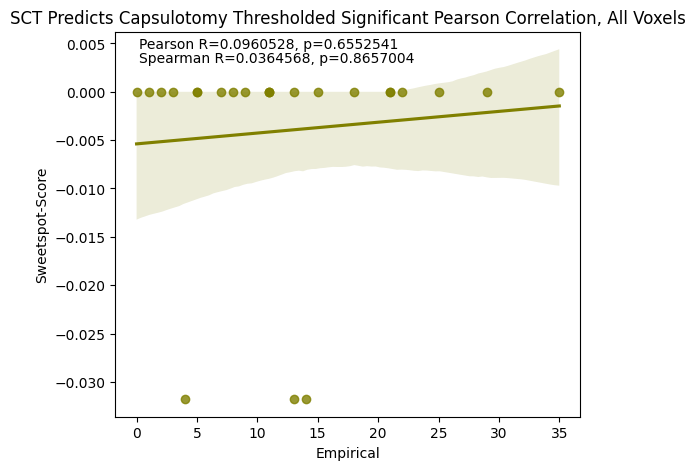

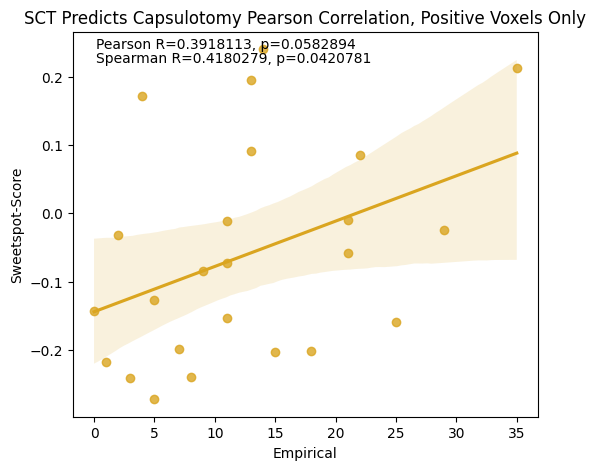

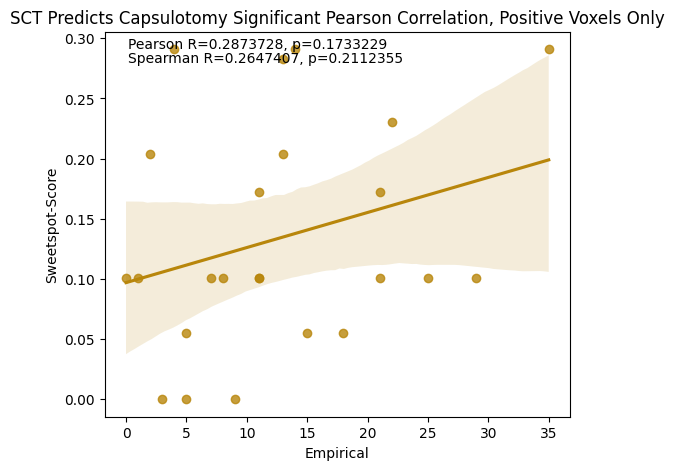

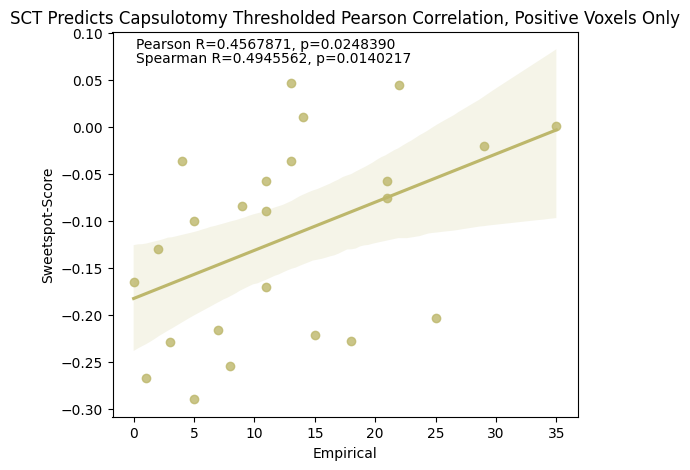

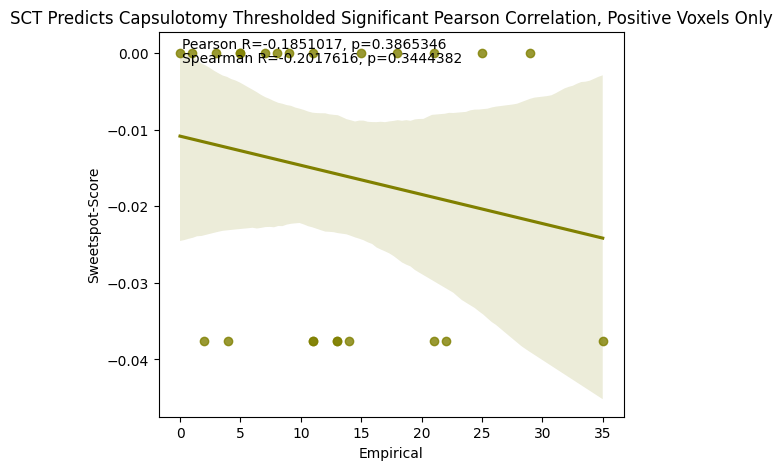

In [44]:
#pearson analysis for sct predicts capsulotomy, absolute, all voxels and positive voxels only
def plot_pearson_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color, save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_pearson_analysis(brazil_canada_df, pearson_sweetspot_corr, 'SCT Predicts Capsulotomy Pearson Correlation, All Voxels', pearson_r_val, pearson_p_val, s_pearson_r_val, s_pearson_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/absolute/pearson_all.png')
plot_pearson_analysis(brazil_canada_df, sig_pearson_sweetspot_corr, 'SCT Predicts Capsulotomy Significant Pearson Correlation, All Voxels',sig_pearson_r_val, sig_pearson_p_val, s_sig_pearson_r_val, s_sig_pearson_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/absolute/pearson_sig_all.png')
plot_pearson_analysis(brazil_canada_df, thresholded_pearson_sweetspot_corr, 'SCT Predicts Capsulotomy Thresholded Pearson Correlation, All Voxels',thresholded_pearson_r_val, thresholded_pearson_p_val, s_thresholded_pearson_r_val, s_thresholded_pearson_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/absolute/pearson_thresholded_all.png')
plot_pearson_analysis(brazil_canada_df, thresholded_sig_pearson_sweetspot_corr, 'SCT Predicts Capsulotomy Thresholded Significant Pearson Correlation, All Voxels',thresholded_sig_pearson_r_val, thresholded_sig_pearson_p_val, s_thresholded_sig_pearson_r_val, s_thresholded_sig_pearson_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/absolute/pearson_sig_thresholded_all.png')

#positive only
plot_pearson_analysis(brazil_canada_df, pos_pearson_sweetspot_corr, 'SCT Predicts Capsulotomy Pearson Correlation, Positive Voxels Only', pos_pearson_r_val, pos_pearson_p_val, pos_s_pearson_r_val, pos_s_pearson_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/absolute/pearson_pos.png')
plot_pearson_analysis(brazil_canada_df, pos_sig_pearson_sweetspot_corr, 'SCT Predicts Capsulotomy Significant Pearson Correlation, Positive Voxels Only',pos_sig_pearson_r_val, pos_sig_pearson_p_val, pos_s_sig_pearson_r_val, pos_s_sig_pearson_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/absolute/pearson_sig_pos.png')
plot_pearson_analysis(brazil_canada_df, pos_thresholded_pearson_sweetspot_corr, 'SCT Predicts Capsulotomy Thresholded Pearson Correlation, Positive Voxels Only',pos_thresholded_pearson_r_val, pos_thresholded_pearson_p_val, pos_s_thresholded_pearson_r_val, pos_s_thresholded_pearson_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/absolute/pearson_thresholded_pos.png')
plot_pearson_analysis(brazil_canada_df, pos_thresholded_sig_pearson_sweetspot_corr, 'SCT Predicts Capsulotomy Thresholded Significant Pearson Correlation, Positive Voxels Only',pos_thresholded_sig_pearson_r_val, pos_thresholded_sig_pearson_p_val, pos_s_thresholded_sig_pearson_r_val, pos_s_thresholded_sig_pearson_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/absolute/pearson_sig_thresholded_pos.png')

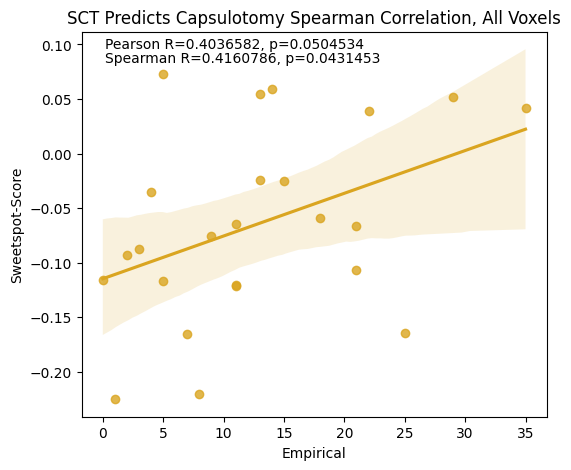

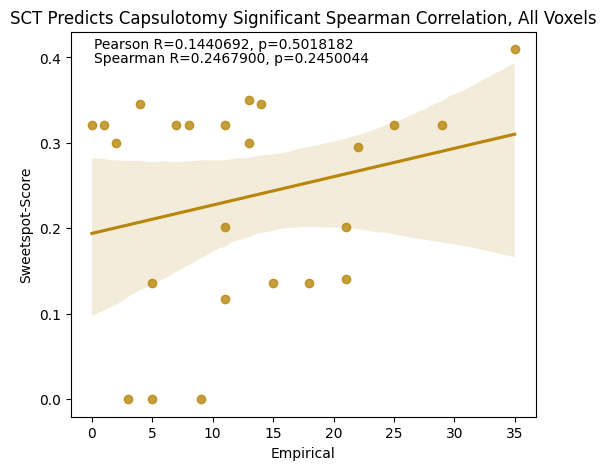

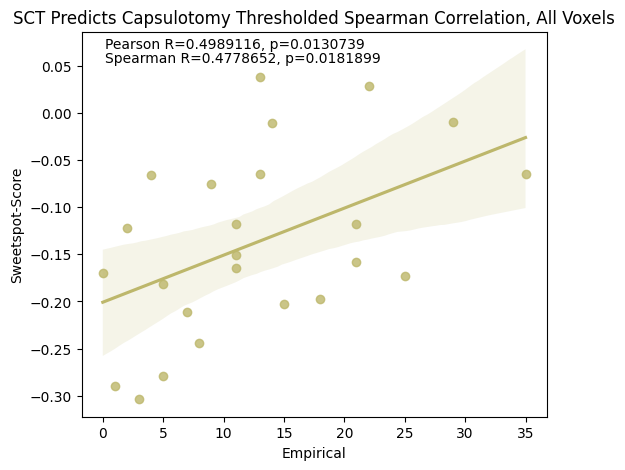

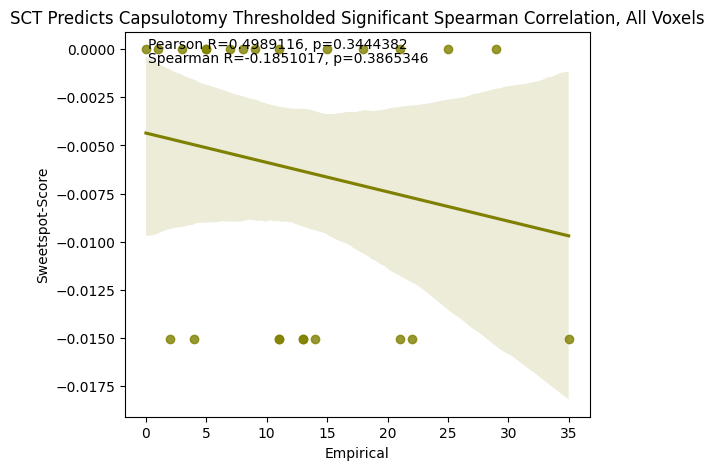

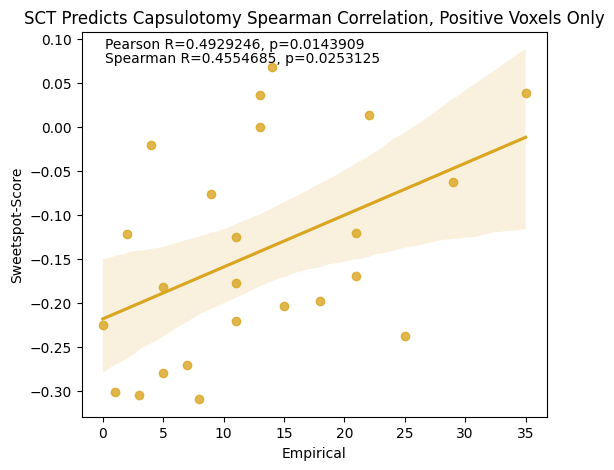

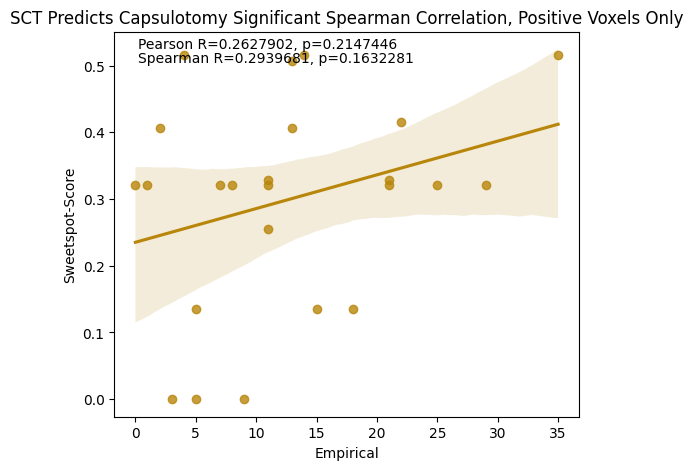

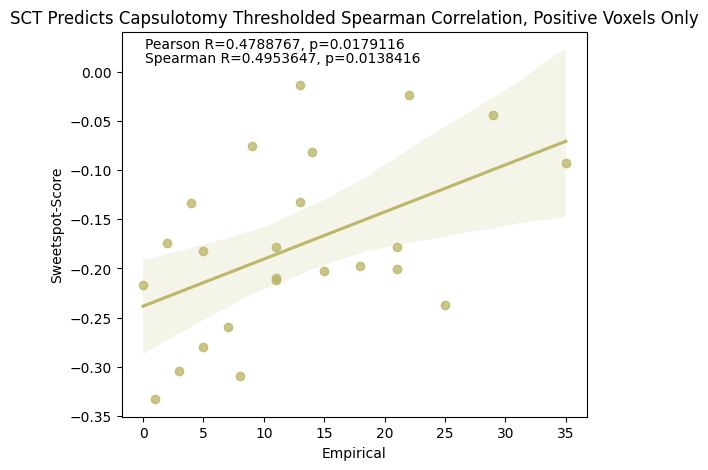

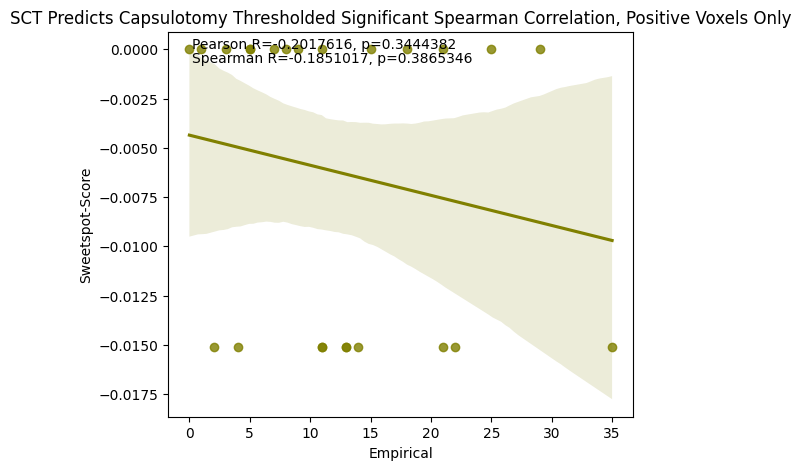

In [45]:
#spearman analysis for sct predicts capsulotomy, absolute, all voxels, positive voxels only
def plot_spearman_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_spearman_analysis(brazil_canada_df, spearman_sweetspot_corr, 'SCT Predicts Capsulotomy Spearman Correlation, All Voxels', spearman_r_val, spearman_p_val, p_spearman_r_val, p_spearman_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/absolute/spearman_all.png')
plot_spearman_analysis(brazil_canada_df, sig_spearman_sweetspot_corr, 'SCT Predicts Capsulotomy Significant Spearman Correlation, All Voxels',sig_spearman_r_val, sig_spearman_p_val, p_sig_spearman_r_val, p_sig_spearman_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/absolute/spearman_sig_all.png')
plot_spearman_analysis(brazil_canada_df, thresholded_spearman_sweetspot_corr, 'SCT Predicts Capsulotomy Thresholded Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_spearman_p_val, p_thresholded_spearman_r_val, p_thresholded_spearman_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/absolute/spearman_thresholded_all.png')
plot_spearman_analysis(brazil_canada_df, thresholded_sig_spearman_sweetspot_corr, 'SCT Predicts Capsulotomy Thresholded Significant Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_sig_spearman_p_val, p_thresholded_sig_spearman_r_val, p_thresholded_sig_spearman_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/absolute/spearman_sig_thresholded_all.png')

#positive voxels
plot_spearman_analysis(brazil_canada_df, pos_spearman_sweetspot_corr, 'SCT Predicts Capsulotomy Spearman Correlation, Positive Voxels Only', pos_spearman_r_val, pos_spearman_p_val, pos_p_spearman_r_val, pos_p_spearman_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/absolute/spearman_pos.png')
plot_spearman_analysis(brazil_canada_df, pos_sig_spearman_sweetspot_corr, 'SCT Predicts Capsulotomy Significant Spearman Correlation, Positive Voxels Only',pos_sig_spearman_r_val, pos_sig_spearman_p_val, pos_p_sig_spearman_r_val, pos_p_sig_spearman_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/absolute/spearman_sig_pos.png')
plot_spearman_analysis(brazil_canada_df, pos_thresholded_spearman_sweetspot_corr, 'SCT Predicts Capsulotomy Thresholded Spearman Correlation, Positive Voxels Only',pos_thresholded_spearman_r_val, pos_thresholded_spearman_p_val, pos_p_thresholded_spearman_r_val, pos_p_thresholded_spearman_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/absolute/spearman_thresholded_pos.png')
plot_spearman_analysis(brazil_canada_df, pos_thresholded_sig_spearman_sweetspot_corr, 'SCT Predicts Capsulotomy Thresholded Significant Spearman Correlation, Positive Voxels Only',pos_thresholded_sig_spearman_r_val, pos_thresholded_sig_spearman_p_val, pos_p_thresholded_sig_spearman_r_val, pos_p_thresholded_sig_spearman_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/sct predicts capsulotomy/absolute/spearman_sig_thresholded_pos.png')

# Capsulotomy Predicts SCT

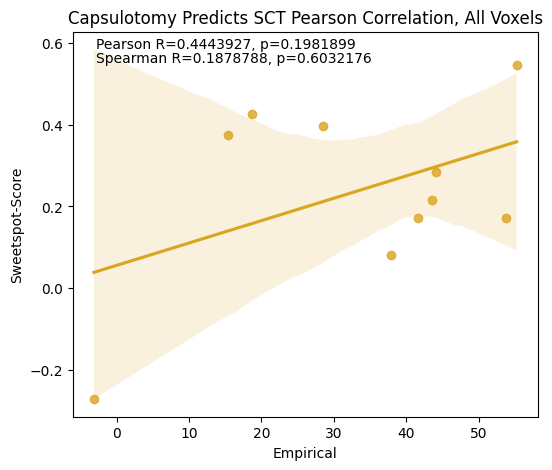

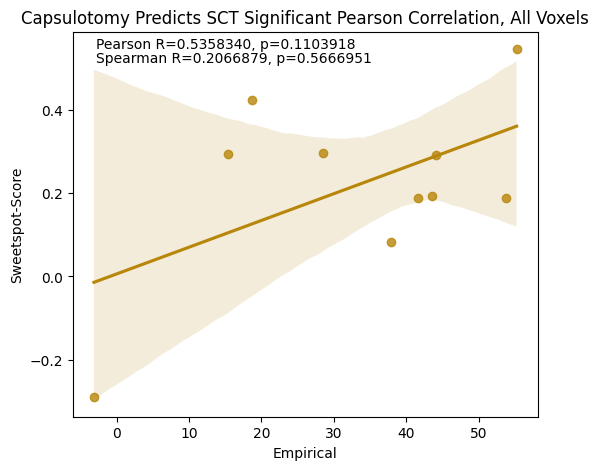

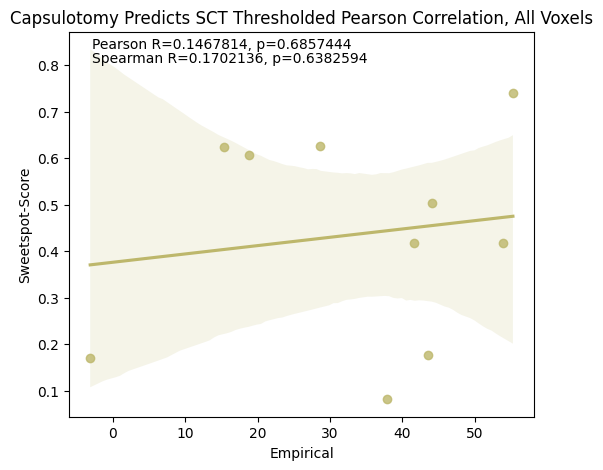

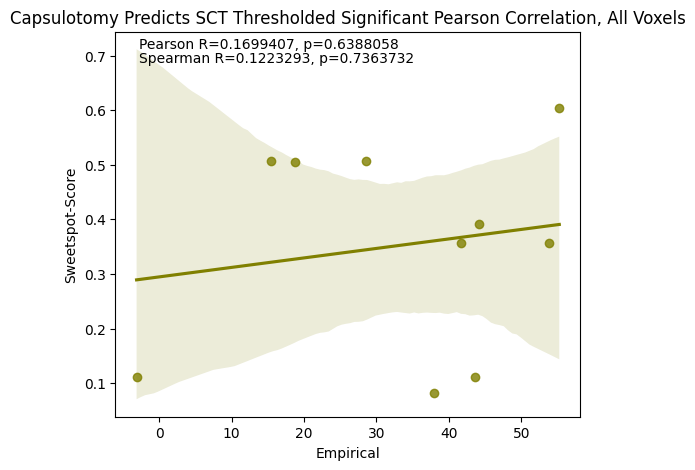

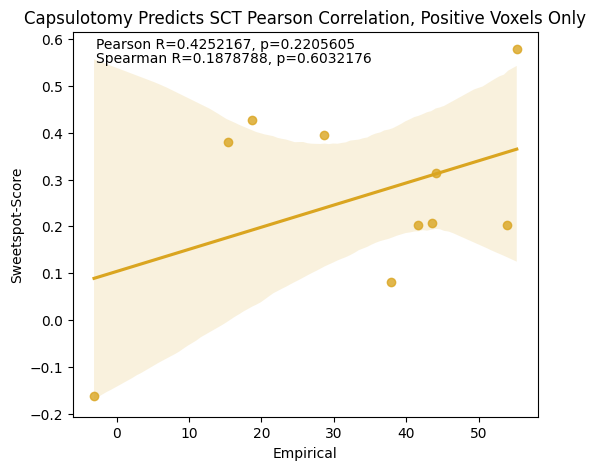

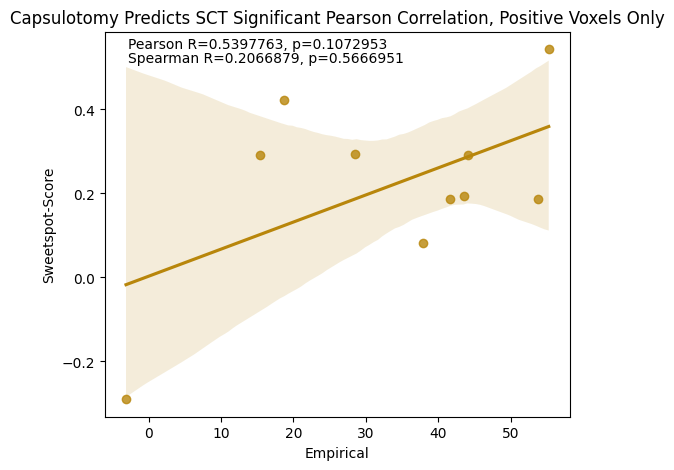

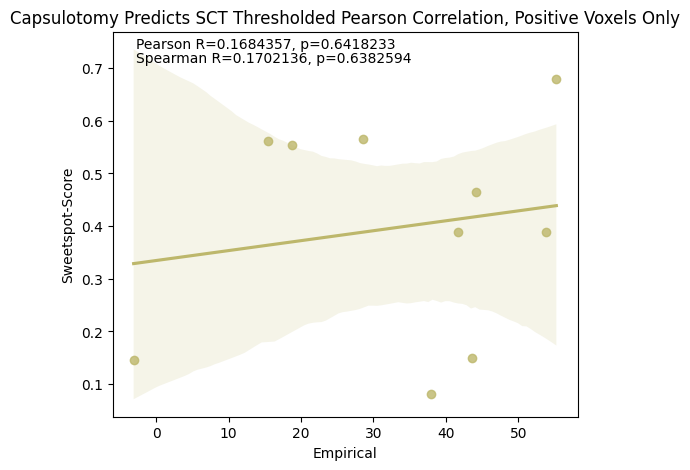

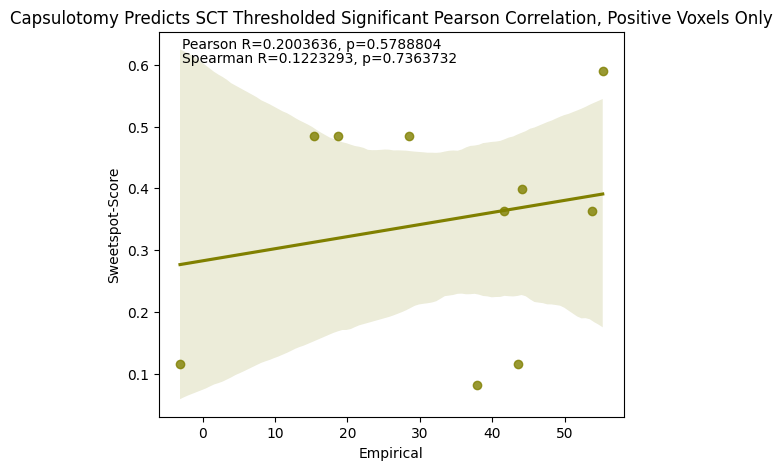

In [101]:
#pearson analysis for capsulotomy predicts sct, relative, all voxels and positive voxels only
def plot_pearson_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color, save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_pearson_analysis(sct_df, pearson_sweetspot_corr, 'Capsulotomy Predicts SCT Pearson Correlation, All Voxels', pearson_r_val, pearson_p_val, s_pearson_r_val, s_pearson_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/relative/pearson_all.png')
plot_pearson_analysis(sct_df, sig_pearson_sweetspot_corr, 'Capsulotomy Predicts SCT Significant Pearson Correlation, All Voxels',sig_pearson_r_val, sig_pearson_p_val, s_sig_pearson_r_val, s_sig_pearson_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/relative/pearson_sig_all.png')
plot_pearson_analysis(sct_df, thresholded_pearson_sweetspot_corr, 'Capsulotomy Predicts SCT Thresholded Pearson Correlation, All Voxels',thresholded_pearson_r_val, thresholded_pearson_p_val, s_thresholded_pearson_r_val, s_thresholded_pearson_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/relative/pearson_thresholded_all.png')
plot_pearson_analysis(sct_df, thresholded_sig_pearson_sweetspot_corr, 'Capsulotomy Predicts SCT Thresholded Significant Pearson Correlation, All Voxels',thresholded_sig_pearson_r_val, thresholded_sig_pearson_p_val, s_thresholded_sig_pearson_r_val, s_thresholded_sig_pearson_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/relative/pearson_sig_thresholded_all.png')

#positive only
plot_pearson_analysis(sct_df, pos_pearson_sweetspot_corr, 'Capsulotomy Predicts SCT Pearson Correlation, Positive Voxels Only', pos_pearson_r_val, pos_pearson_p_val, pos_s_pearson_r_val, pos_s_pearson_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/relative/pearson_pos.png')
plot_pearson_analysis(sct_df, pos_sig_pearson_sweetspot_corr, 'Capsulotomy Predicts SCT Significant Pearson Correlation, Positive Voxels Only',pos_sig_pearson_r_val, pos_sig_pearson_p_val, pos_s_sig_pearson_r_val, pos_s_sig_pearson_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/relative/pearson_sig_pos.png')
plot_pearson_analysis(sct_df, pos_thresholded_pearson_sweetspot_corr, 'Capsulotomy Predicts SCT Thresholded Pearson Correlation, Positive Voxels Only',pos_thresholded_pearson_r_val, pos_thresholded_pearson_p_val, pos_s_thresholded_pearson_r_val, pos_s_thresholded_pearson_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/relative/pearson_thresholded_pos.png')
plot_pearson_analysis(sct_df, pos_thresholded_sig_pearson_sweetspot_corr, 'Capsulotomy Predicts SCT Thresholded Significant Pearson Correlation, Positive Voxels Only',pos_thresholded_sig_pearson_r_val, pos_thresholded_sig_pearson_p_val, pos_s_thresholded_sig_pearson_r_val, pos_s_thresholded_sig_pearson_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/relative/pearson_sig_thresholded_pos.png')

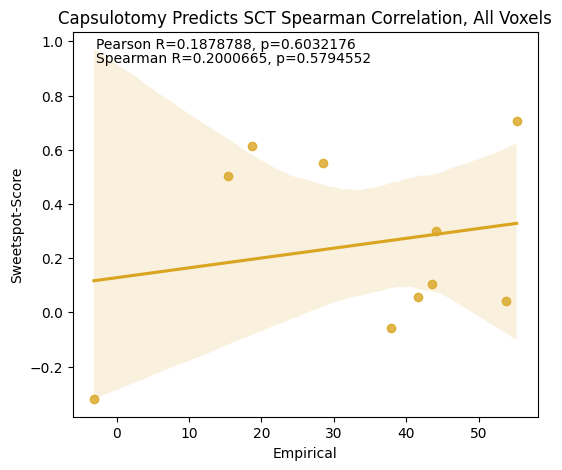

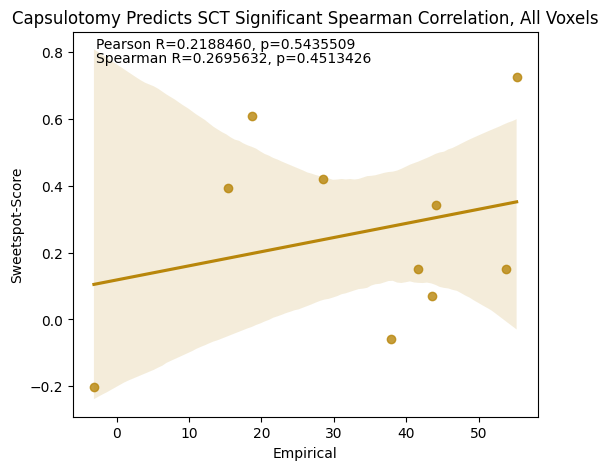

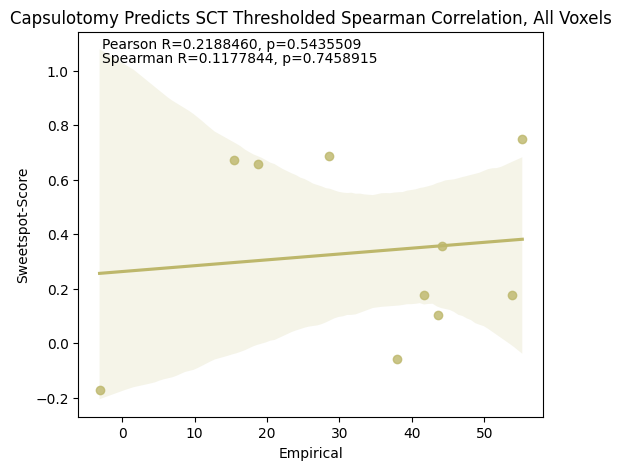

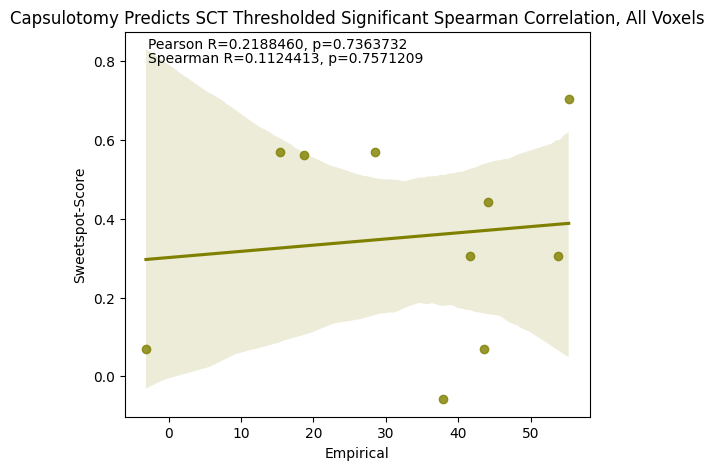

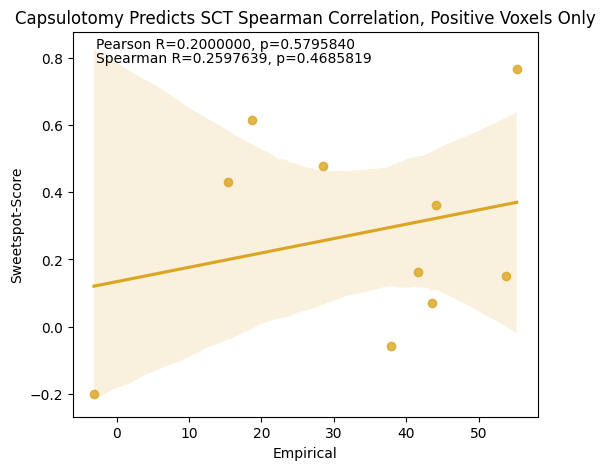

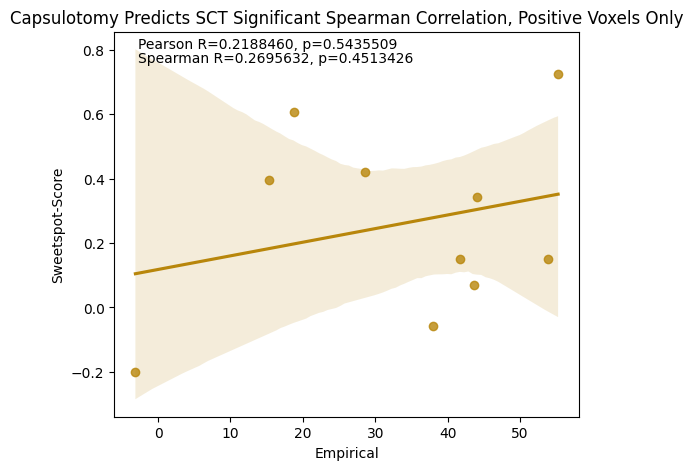

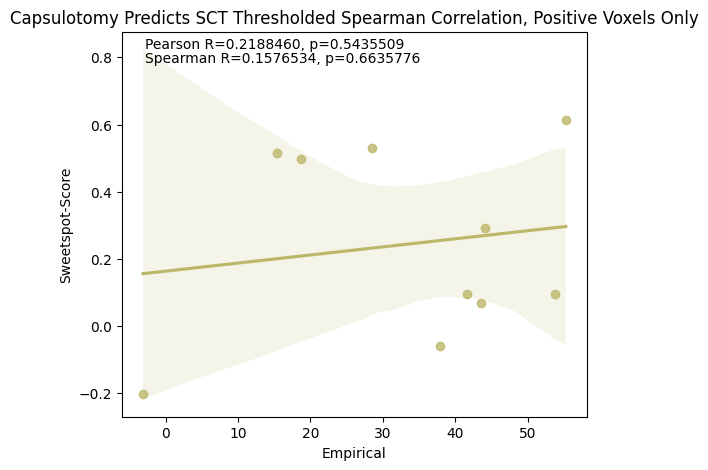

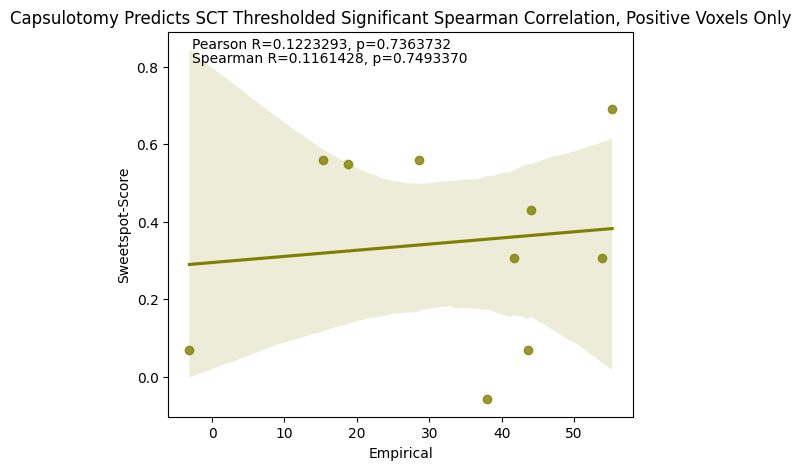

In [227]:
#spearman analysis for capsulotomy predicts sct, relative, all voxels, positive voxels only
def plot_spearman_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_spearman_analysis(sct_df, spearman_sweetspot_corr, 'Capsulotomy Predicts SCT Spearman Correlation, All Voxels', spearman_r_val, spearman_p_val, p_spearman_r_val, p_spearman_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/relative/spearman_all.png')
plot_spearman_analysis(sct_df, sig_spearman_sweetspot_corr, 'Capsulotomy Predicts SCT Significant Spearman Correlation, All Voxels',sig_spearman_r_val, sig_spearman_p_val, p_sig_spearman_r_val, p_sig_spearman_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/relative/spearman_sig_all.png')
plot_spearman_analysis(sct_df, thresholded_spearman_sweetspot_corr, 'Capsulotomy Predicts SCT Thresholded Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_spearman_p_val, p_thresholded_spearman_r_val, p_thresholded_spearman_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/relative/spearman_thresholded_all.png')
plot_spearman_analysis(sct_df, thresholded_sig_spearman_sweetspot_corr, 'Capsulotomy Predicts SCT Thresholded Significant Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_sig_spearman_p_val, p_thresholded_sig_spearman_r_val, p_thresholded_sig_spearman_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/relative/spearman_sig_thresholded_all.png')

#positive voxels
plot_spearman_analysis(sct_df, pos_spearman_sweetspot_corr, 'Capsulotomy Predicts SCT Spearman Correlation, Positive Voxels Only', pos_spearman_r_val, pos_spearman_p_val, pos_p_spearman_r_val, pos_p_spearman_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/relative/spearman_pos.png')
plot_spearman_analysis(sct_df, pos_sig_spearman_sweetspot_corr, 'Capsulotomy Predicts SCT Significant Spearman Correlation, Positive Voxels Only',pos_sig_spearman_r_val, pos_sig_spearman_p_val, pos_p_sig_spearman_r_val, pos_p_sig_spearman_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/relative/spearman_sig_pos.png')
plot_spearman_analysis(sct_df, pos_thresholded_spearman_sweetspot_corr, 'Capsulotomy Predicts SCT Thresholded Spearman Correlation, Positive Voxels Only',pos_thresholded_spearman_r_val, pos_thresholded_spearman_p_val, pos_p_thresholded_spearman_r_val, pos_p_thresholded_spearman_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/relative/spearman_thresholded_pos.png')
plot_spearman_analysis(sct_df, pos_thresholded_sig_spearman_sweetspot_corr, 'Capsulotomy Predicts SCT Thresholded Significant Spearman Correlation, Positive Voxels Only',pos_thresholded_sig_spearman_r_val, pos_thresholded_sig_spearman_p_val, pos_p_thresholded_sig_spearman_r_val, pos_p_thresholded_sig_spearman_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/relative/spearman_sig_thresholded_pos.png')

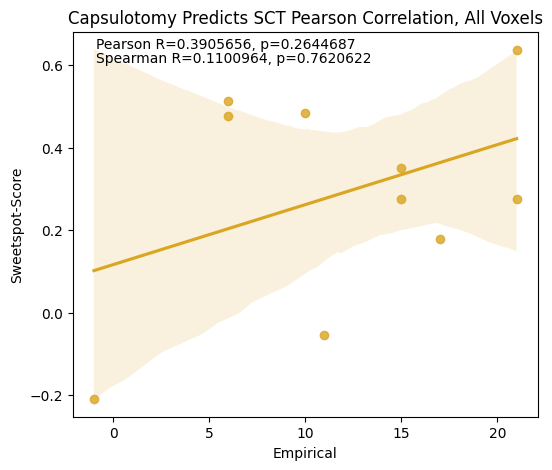

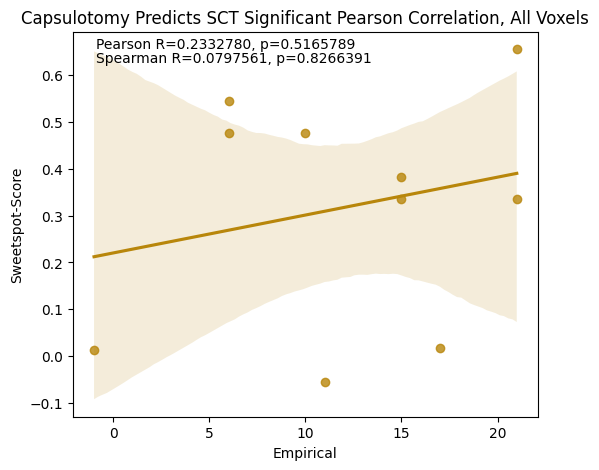

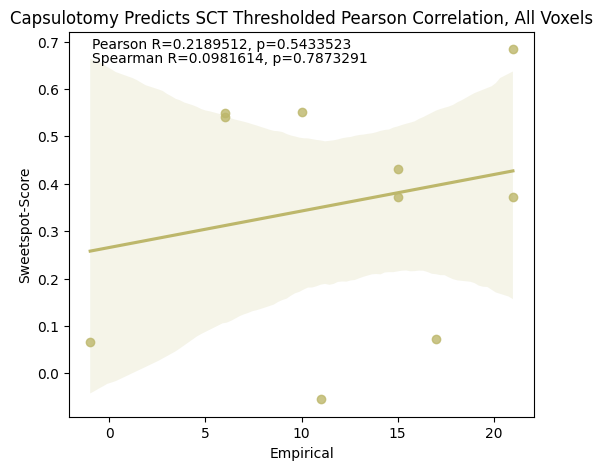

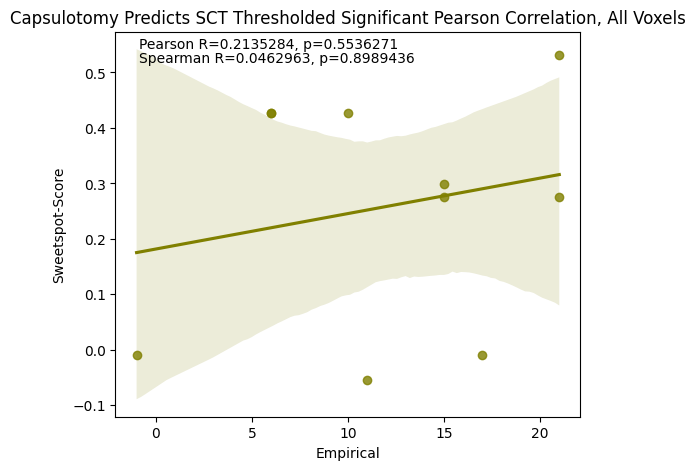

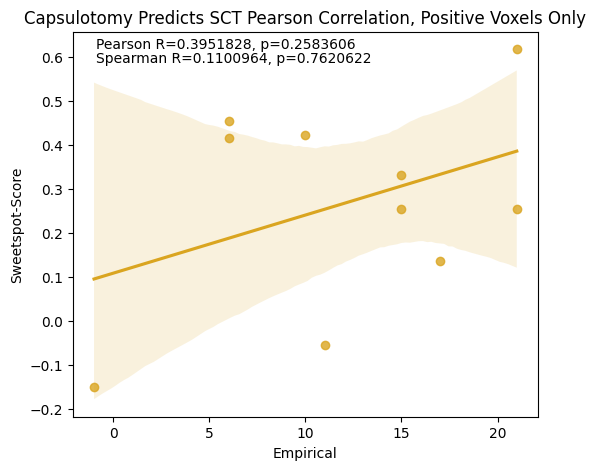

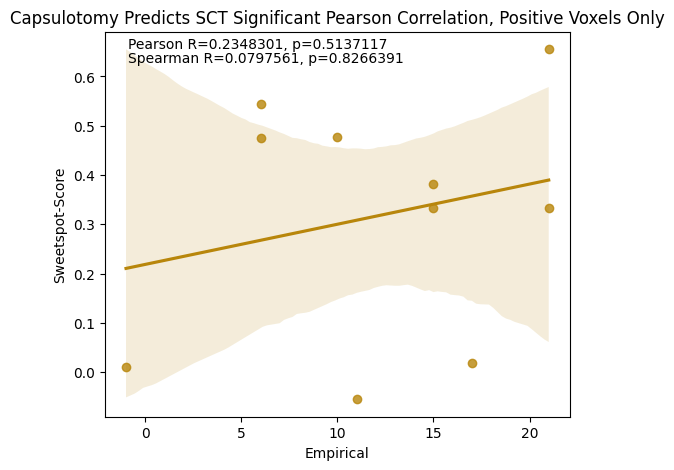

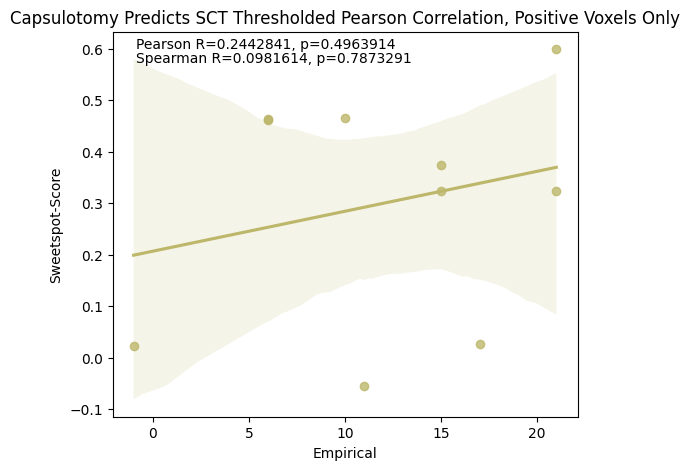

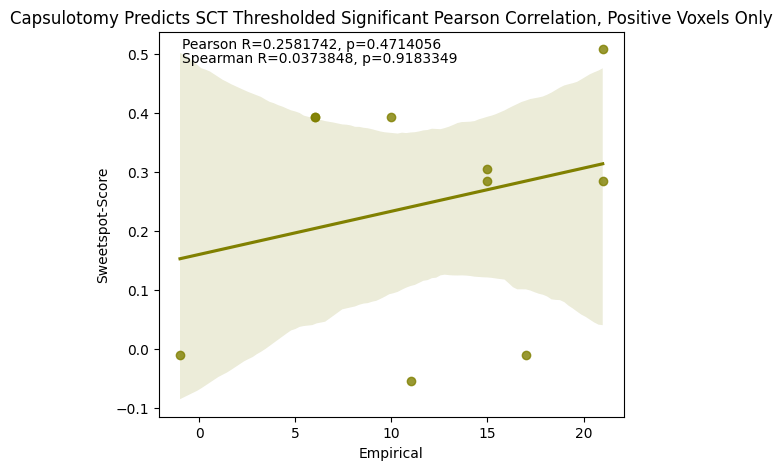

In [97]:
#pearson analysis for capsulotomy predicts sct, absolute, all voxels and positive voxels only
def plot_pearson_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color, save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_pearson_analysis(sct_df, pearson_sweetspot_corr, 'Capsulotomy Predicts SCT Pearson Correlation, All Voxels', pearson_r_val, pearson_p_val, s_pearson_r_val, s_pearson_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/absolute/pearson_all.png')
plot_pearson_analysis(sct_df, sig_pearson_sweetspot_corr, 'Capsulotomy Predicts SCT Significant Pearson Correlation, All Voxels',sig_pearson_r_val, sig_pearson_p_val, s_sig_pearson_r_val, s_sig_pearson_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/absolute/pearson_sig_all.png')
plot_pearson_analysis(sct_df, thresholded_pearson_sweetspot_corr, 'Capsulotomy Predicts SCT Thresholded Pearson Correlation, All Voxels',thresholded_pearson_r_val, thresholded_pearson_p_val, s_thresholded_pearson_r_val, s_thresholded_pearson_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/absolute/pearson_thresholded_all.png')
plot_pearson_analysis(sct_df, thresholded_sig_pearson_sweetspot_corr, 'Capsulotomy Predicts SCT Thresholded Significant Pearson Correlation, All Voxels',thresholded_sig_pearson_r_val, thresholded_sig_pearson_p_val, s_thresholded_sig_pearson_r_val, s_thresholded_sig_pearson_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/absolute/pearson_sig_thresholded_all.png')

#positive only
plot_pearson_analysis(sct_df, pos_pearson_sweetspot_corr, 'Capsulotomy Predicts SCT Pearson Correlation, Positive Voxels Only', pos_pearson_r_val, pos_pearson_p_val, pos_s_pearson_r_val, pos_s_pearson_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/absolute/pearson_pos.png')
plot_pearson_analysis(sct_df, pos_sig_pearson_sweetspot_corr, 'Capsulotomy Predicts SCT Significant Pearson Correlation, Positive Voxels Only',pos_sig_pearson_r_val, pos_sig_pearson_p_val, pos_s_sig_pearson_r_val, pos_s_sig_pearson_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/absolute/pearson_sig_pos.png')
plot_pearson_analysis(sct_df, pos_thresholded_pearson_sweetspot_corr, 'Capsulotomy Predicts SCT Thresholded Pearson Correlation, Positive Voxels Only',pos_thresholded_pearson_r_val, pos_thresholded_pearson_p_val, pos_s_thresholded_pearson_r_val, pos_s_thresholded_pearson_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/absolute/pearson_thresholded_pos.png')
plot_pearson_analysis(sct_df, pos_thresholded_sig_pearson_sweetspot_corr, 'Capsulotomy Predicts SCT Thresholded Significant Pearson Correlation, Positive Voxels Only',pos_thresholded_sig_pearson_r_val, pos_thresholded_sig_pearson_p_val, pos_s_thresholded_sig_pearson_r_val, pos_s_thresholded_sig_pearson_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/absolute/pearson_sig_thresholded_pos.png')

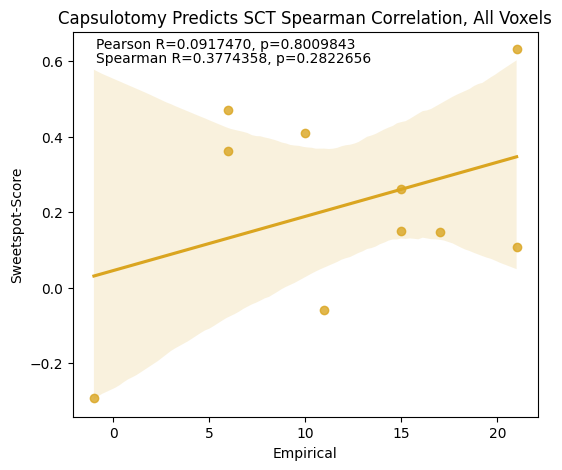

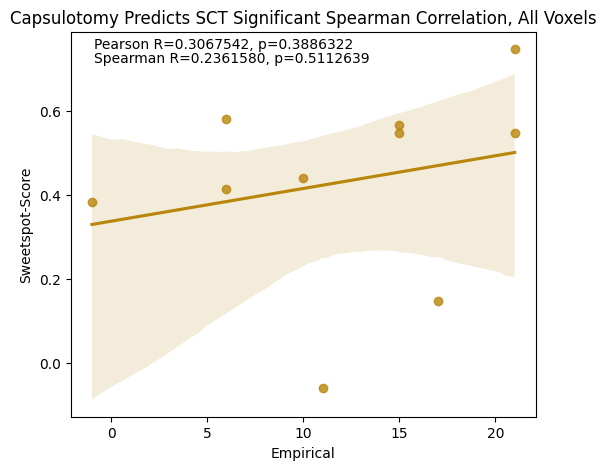

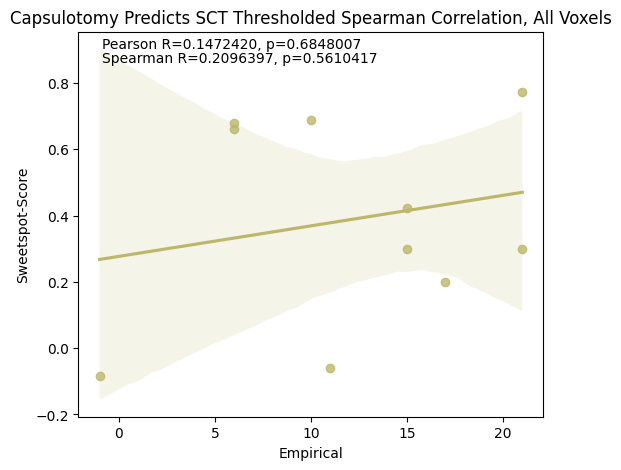

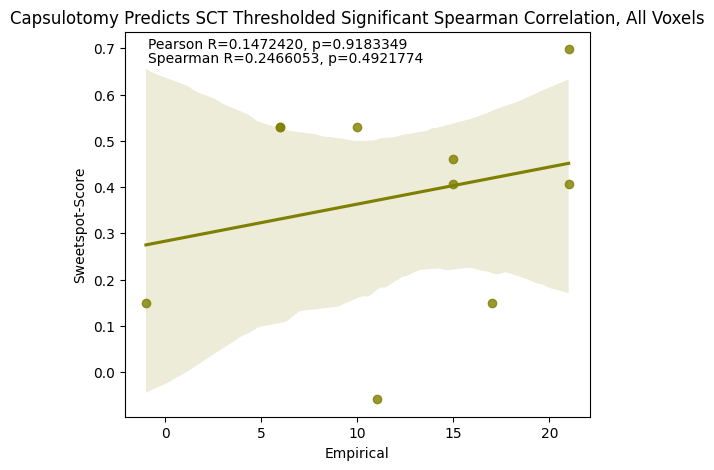

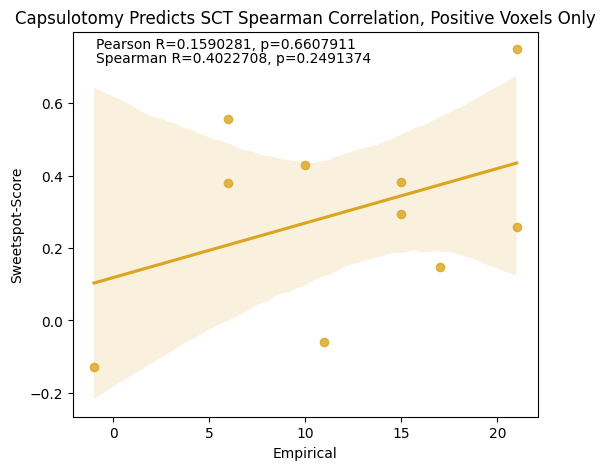

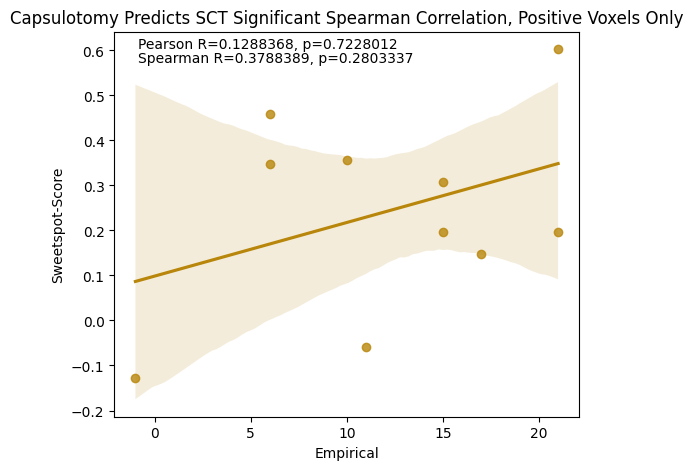

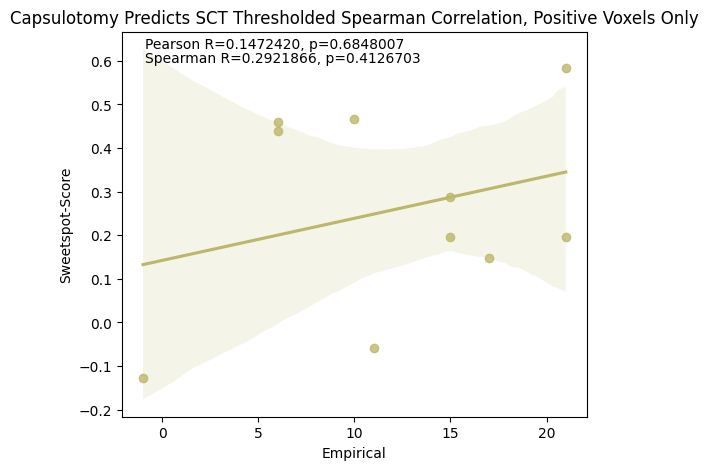

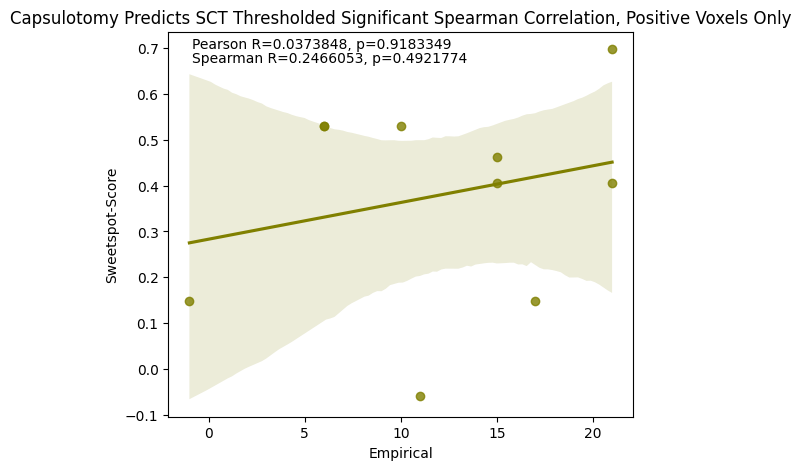

In [96]:
#spearman analysis for capsulotomy predicts sct, absolute, all voxels, positive voxels only
def plot_spearman_analysis(x_data, y_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,save_path=None):
    plt.figure(figsize=(6, 5))
    ax = sns.regplot(x=x_data, y=y_data, color=color)
    plt.title(title)
    plt.xlabel('Empirical')
    plt.ylabel('Sweetspot-Score')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),
            transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),
            transform=ax.transAxes, verticalalignment='top')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

plot_spearman_analysis(sct_df, spearman_sweetspot_corr, 'Capsulotomy Predicts SCT Spearman Correlation, All Voxels', spearman_r_val, spearman_p_val, p_spearman_r_val, p_spearman_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/absolute/spearman_all.png')
plot_spearman_analysis(sct_df, sig_spearman_sweetspot_corr, 'Capsulotomy Predicts SCT Significant Spearman Correlation, All Voxels',sig_spearman_r_val, sig_spearman_p_val, p_sig_spearman_r_val, p_sig_spearman_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/absolute/spearman_sig_all.png')
plot_spearman_analysis(sct_df, thresholded_spearman_sweetspot_corr, 'Capsulotomy Predicts SCT Thresholded Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_spearman_p_val, p_thresholded_spearman_r_val, p_thresholded_spearman_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/absolute/spearman_thresholded_all.png')
plot_spearman_analysis(sct_df, thresholded_sig_spearman_sweetspot_corr, 'Capsulotomy Predicts SCT Thresholded Significant Spearman Correlation, All Voxels',thresholded_spearman_r_val, thresholded_sig_spearman_p_val, p_thresholded_sig_spearman_r_val, p_thresholded_sig_spearman_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/absolute/spearman_sig_thresholded_all.png')

#positive voxels
plot_spearman_analysis(sct_df, pos_spearman_sweetspot_corr, 'Capsulotomy Predicts SCT Spearman Correlation, Positive Voxels Only', pos_spearman_r_val, pos_spearman_p_val, pos_p_spearman_r_val, pos_p_spearman_p_val, 'goldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/absolute/spearman_pos.png')
plot_spearman_analysis(sct_df, pos_sig_spearman_sweetspot_corr, 'Capsulotomy Predicts SCT Significant Spearman Correlation, Positive Voxels Only',pos_sig_spearman_r_val, pos_sig_spearman_p_val, pos_p_sig_spearman_r_val, pos_p_sig_spearman_p_val, 'darkgoldenrod','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/absolute/spearman_sig_pos.png')
plot_spearman_analysis(sct_df, pos_thresholded_spearman_sweetspot_corr, 'Capsulotomy Predicts SCT Thresholded Spearman Correlation, Positive Voxels Only',pos_thresholded_spearman_r_val, pos_thresholded_spearman_p_val, pos_p_thresholded_spearman_r_val, pos_p_thresholded_spearman_p_val, 'darkkhaki','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/absolute/spearman_thresholded_pos.png')
plot_spearman_analysis(sct_df, pos_thresholded_sig_spearman_sweetspot_corr, 'Capsulotomy Predicts SCT Thresholded Significant Spearman Correlation, Positive Voxels Only',pos_thresholded_sig_spearman_r_val, pos_thresholded_sig_spearman_p_val, pos_p_thresholded_sig_spearman_r_val, pos_p_thresholded_sig_spearman_p_val, 'olive','/Volumes/Empty/Sweetspot_Seg/Outputs/python cross-validations/predict subcohorts/capsulotomy predicts sct/absolute/spearman_sig_thresholded_pos.png')